In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_excel('data.xlsx')

C:\Users\user\anaconda3\lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning: Unknown extension is not supported and will be removed
  for idx, row in parser.parse():
C:\Users\user\anaconda3\lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning: Conditional Formatting extension is not supported and will be removed
  for idx, row in parser.parse():


In [3]:
data = data.drop(0).reset_index(drop=True)

In [4]:
data.drop(['Нормированное электрическое сопротивление литологической разности','Коэффициент фильтрации ', 'Литологтческий тир' ], axis=1, inplace=True)
data.replace(999, None, inplace=True)

In [5]:
data.rename(columns={'Скважина ': 'well', 'Глубина точки (м)': 'Depth(m)', 'Скороость счета (мкр/час)': 'gamma_ray(μR/h)', 'Кажущееся сопротивление(ом.м)': 'appareent_resistance(ohmm)', 'Концентрация радия (%)': 'Ra_concentr(%)', 'Литология по керну': 'core_lithology', 'Тир пород по проницаемости': 'perm_class', 'Литологтческий тир': 'litho_class', 'Коэффициент фильтрации ': 'filtr_coef', 'Продуктивный горизонт': 'productive_horizon', 'Потенциал самопроизвольной поляризации (мв)':'spontaneous__potential(mV)'}, inplace=True)

In [6]:
columns_to_fill = [
    "gamma_ray(μR/h)",
    "appareent_resistance(ohmm)",
    "spontaneous__potential(mV)",
    "perm_class"
]

for column in columns_to_fill:
    median_value = data[column].median()
    data[column].fillna(median_value, inplace=True)

# Check if the missing values are filled
missing_values_updated = data[columns_to_fill].isnull().sum()
missing_values_updated

gamma_ray(μR/h)               0
appareent_resistance(ohmm)    0
spontaneous__potential(mV)    0
perm_class                    0
dtype: int64

In [7]:
data

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon
0,7699.0,120.0,6.0,3.57,4.6,0.0,7.0,10.0,0.0
1,7699.0,120.1,6.0,3.53,4.8,0.0,7.0,10.0,0.0
2,7699.0,120.2,6.0,3.50,4.9,0.0,7.0,10.0,0.0
3,7699.0,120.3,7.0,3.46,5.1,0.0,7.0,10.0,0.0
4,7699.0,120.4,7.0,3.43,5.4,0.0,7.0,10.0,0.0
...,...,...,...,...,...,...,...,...,...
123192,11896.0,383.4,9.0,3.83,1.2,0.0,956.0,10.0,0.0
123193,11896.0,383.5,9.0,3.86,1.2,0.0,956.0,10.0,0.0
123194,11896.0,383.6,5.0,3.89,1.2,0.0,956.0,10.0,0.0
123195,11896.0,383.7,5.0,3.92,1.3,0.0,956.0,10.0,0.0


In [8]:
data['core_lithology'].value_counts()

3.0      25344
112.0    12214
12.0     11167
4.0       4429
7.0       3919
1.0       2877
666.0     1488
74.0      1446
76.0      1428
956.0      718
47.0       441
59.0       416
44.0       331
37.0       322
67.0       263
64.0       124
34.0        78
11.0        57
644.0       36
123.0       35
71.0        31
36.0        25
43.0        24
35.0        24
66.0        22
447.0       17
774.0       14
31.0        11
53.0        10
6.0          7
5.0          6
79.0         5
0.0          2
41.0         1
Name: core_lithology, dtype: int64

In [9]:
data.to_excel("data01.12.23.xlsx", engine='openpyxl', index=False)

In [10]:
data.isnull().sum()

well                              0
Depth(m)                          0
gamma_ray(μR/h)                   0
appareent_resistance(ohmm)        0
spontaneous__potential(mV)        0
Ra_concentr(%)                    0
core_lithology                55865
perm_class                        0
productive_horizon                0
dtype: int64

In [11]:
# Проверка на пустые данные
missing_values = data.isnull().sum()

missing_values

well                              0
Depth(m)                          0
gamma_ray(μR/h)                   0
appareent_resistance(ohmm)        0
spontaneous__potential(mV)        0
Ra_concentr(%)                    0
core_lithology                55865
perm_class                        0
productive_horizon                0
dtype: int64

# Distribution of lithology class by core

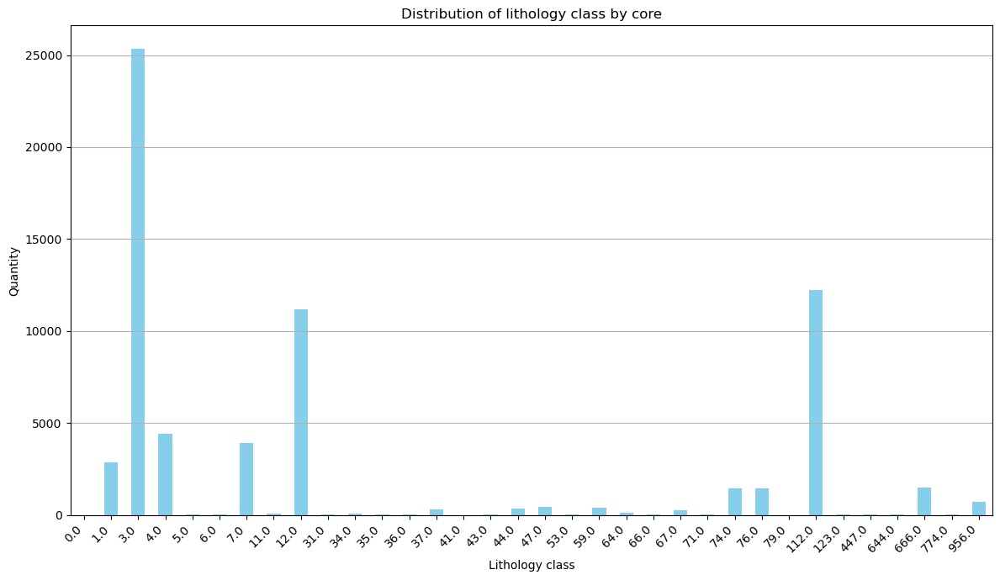

In [11]:
# Отображение количества для каждого типа литологии
lithology_counts = data['core_lithology'].value_counts().sort_index()

# Визуализация по типу литол.
plt.figure(figsize=(12, 7))
lithology_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of lithology class by core')
plt.xlabel('Lithology class')
plt.ylabel('Quantity')
plt.grid(axis='y')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [14]:
lithology_counts

0.0          2
1.0       2877
3.0      25344
4.0       4429
5.0          6
6.0          7
7.0       3919
11.0        57
12.0     11167
31.0        11
34.0        78
35.0        24
36.0        25
37.0       322
41.0         1
43.0        24
44.0       331
47.0       441
53.0        10
59.0       416
64.0       124
66.0        22
67.0       263
71.0        31
74.0      1446
76.0      1428
79.0         5
112.0    12214
123.0       35
447.0       17
644.0       36
666.0     1488
774.0       14
956.0      718
Name: core_lithology, dtype: int64

In [13]:
lithology_counts.count()

34

# Distribution of measurements across wells

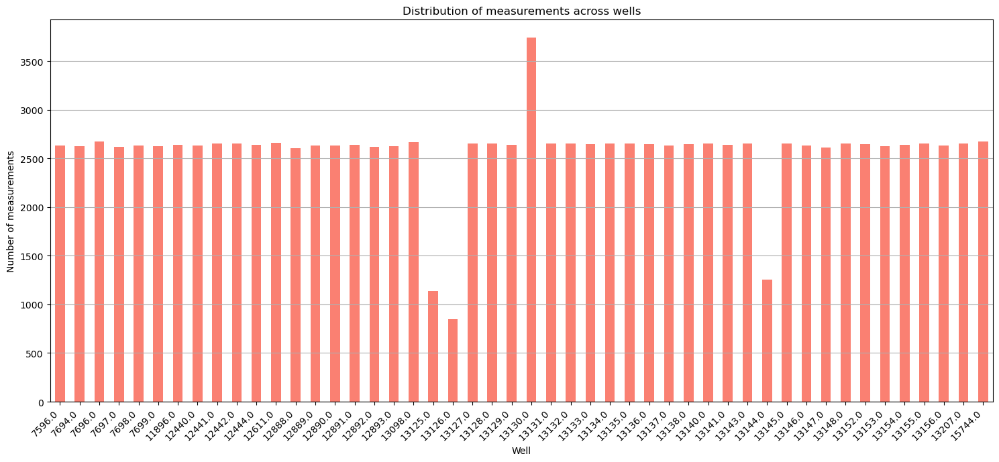

7596.0     2635
7694.0     2622
7696.0     2673
7697.0     2617
7698.0     2630
7699.0     2627
11896.0    2639
12440.0    2633
12441.0    2651
12442.0    2651
12444.0    2640
12611.0    2663
12888.0    2604
12889.0    2631
12890.0    2630
12891.0    2637
12892.0    2618
12893.0    2624
13098.0    2667
13125.0    1136
13126.0     845
13127.0    2650
13128.0    2651
13129.0    2641
13130.0    3738
13131.0    2651
13132.0    2651
13133.0    2648
13134.0    2652
13135.0    2650
13136.0    2647
13137.0    2629
13138.0    2649
13140.0    2652
13141.0    2640
13143.0    2651
13144.0    1256
13145.0    2651
13146.0    2631
13147.0    2612
13148.0    2654
13152.0    2645
13153.0    2625
13154.0    2639
13155.0    2651
13156.0    2634
13207.0    2651
15744.0    2675
Name: well, dtype: int64

In [15]:
# Отображение количества для каждой скважины
well_counts = data['well'].value_counts().sort_index()


plt.figure(figsize=(15, 7))
well_counts.plot(kind='bar', color='salmon')
plt.title('Distribution of measurements across wells')
plt.xlabel('Well')
plt.ylabel('Number of measurements')
plt.grid(axis='y')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

well_counts

In [21]:
data['well'].nunique()

48

In [22]:
df = data.copy()
df

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon
0,7699.0,120.0,6.0,3.57,4.6,0.0,7.0,10.0,0.0
1,7699.0,120.1,6.0,3.53,4.8,0.0,7.0,10.0,0.0
2,7699.0,120.2,6.0,3.50,4.9,0.0,7.0,10.0,0.0
3,7699.0,120.3,7.0,3.46,5.1,0.0,7.0,10.0,0.0
4,7699.0,120.4,7.0,3.43,5.4,0.0,7.0,10.0,0.0
...,...,...,...,...,...,...,...,...,...
123192,11896.0,383.4,9.0,3.83,1.2,0.0,956.0,10.0,0.0
123193,11896.0,383.5,9.0,3.86,1.2,0.0,956.0,10.0,0.0
123194,11896.0,383.6,5.0,3.89,1.2,0.0,956.0,10.0,0.0
123195,11896.0,383.7,5.0,3.92,1.3,0.0,956.0,10.0,0.0


# Re-categorizing classes (merge several classes into one class)
### the link to article where says about it 
#### The DOI link for the article "A supervised machine learning-based solution for efficient network intrusion detection using ensemble learning based on hyperparameter optimization" by Arindam Sarkar, Hanjabam Saratchandra Sharma, and Moirangthem Marjit Singh is dx.doi.org/10.1007/s41870-022-01115-4 . The article was published on October 10, 2022.


In [23]:
def categorize_lithology(code):
    # Define the groups and their respective codes
    
    groups = {
        #sand-gravel deposits and sands of various grains
        '0': [
            1, 1111, 1277, 10, 101, 111, 17, 11, 117, 112, 1127, 1125, 11257,
            123, 12, 1225, 1229, 127, 1227, 121, 1217, 122, 1235, 1237, 12377,
            1239, 125, 14, 126, 129, 1259, 149, 19, 29
        ],
        #medium-grained sands
        '1': [
            3, 31, 321, 34, 35, 30, 309, 355, 37, 376, 347, 36, 370, 375, 377,
            379, 39
        ],
        #fine fine grained sands
        '2': [
            4, 41, 421, 4217, 43, 415, 45, 456, 457, 467, 4777, 40, 409, 455,
            437, 46, 466, 47, 475, 477, 49, 44, 442, 445, 440, 4409, 4455, 446,
            447, 4475
        ],
        #sadnstone
        '3': [
            5, 51, 519, 52, 591, 592, 529, 58, 53, 530, 5306, 54, 56, 57, 578,
            593, 5399, 594, 549, 579, 598, 509, 59
        ],
        #silt/siltstone/clay
        '4': [
            6, 60, 61, 63, 659, 64, 641, 6410, 647, 648, 65, 66, 669, 67, 674,
            675, 69, 693, 62, 967, 969, 7, 71, 714, 715, 731, 74, 75, 76, 763,
            765, 709, 77, 789, 79, 794
        ],
        #impermeable sands
        '5': [
            517, 551, 552, 7121, 7122, 7123, 7124, 7127, 7155, 7255, 717, 553,
            535, 5358, 73, 730, 733, 735, 739, 7355, 743, 539, 545, 5458, 554,
            745, 7455, 7456, 746, 7466, 747, 7475, 774, 7745, 7746, 5445, 644,
            6449, 744, 7445
        ],
        #Other
        '6': [
            55, 723, 81, 82, 83, 84, 85, 86, 87, 88, 89, 9, 907, 90, 91, 92, 93,
            94, 95, 96, 962, 965, 97, 28, 0, 999
        ]
    }
    
    # Determine the group of the code
    for group_name, codes in groups.items():
        if code in codes:
            return group_name
    #not defined
    return np.nan
df['core_lithology'] = df['core_lithology'].apply(categorize_lithology)

In [18]:
df

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon
0,7699.0,120.0,6.0,3.57,4.6,0.0,NaN,10.0,0.0
1,7699.0,120.1,6.0,3.53,4.8,0.0,NaN,10.0,0.0
2,7699.0,120.2,6.0,3.50,4.9,0.0,NaN,10.0,0.0
3,7699.0,120.3,7.0,3.46,5.1,0.0,NaN,10.0,0.0
4,7699.0,120.4,7.0,3.43,5.4,0.0,NaN,10.0,0.0
...,...,...,...,...,...,...,...,...,...
123192,11896.0,383.4,9.0,3.83,1.2,0.0,NaN,10.0,0.0
123193,11896.0,383.5,9.0,3.86,1.2,0.0,NaN,10.0,0.0
123194,11896.0,383.6,5.0,3.89,1.2,0.0,NaN,10.0,0.0
123195,11896.0,383.7,5.0,3.92,1.3,0.0,NaN,10.0,0.0


In [25]:
df['core_lithology'].value_counts()

0    26350
1    25804
4     7245
2     5243
3      432
5       50
6        2
Name: core_lithology, dtype: int64

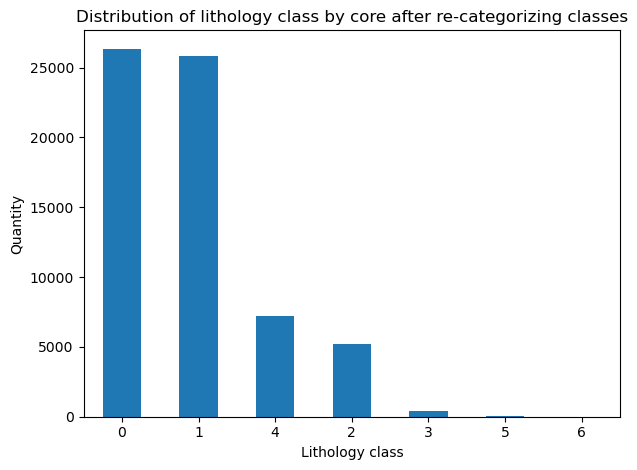

In [26]:
df['core_lithology'].value_counts().plot(kind='bar')
plt.title('Distribution of lithology class by core after re-categorizing classes')
plt.xlabel('Lithology class')
plt.ylabel('Quantity')
plt.xticks(rotation=False)
plt.tight_layout()
plt.show()

In [22]:
df['core_lithology'].value_counts()

0    26350
1    25804
4     7245
2     5243
3      432
5       50
6        2
Name: core_lithology, dtype: int64

In [23]:
df

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon
0,7699.0,120.0,6.0,3.57,4.6,0.0,4,10.0,0.0
1,7699.0,120.1,6.0,3.53,4.8,0.0,4,10.0,0.0
2,7699.0,120.2,6.0,3.50,4.9,0.0,4,10.0,0.0
3,7699.0,120.3,7.0,3.46,5.1,0.0,4,10.0,0.0
4,7699.0,120.4,7.0,3.43,5.4,0.0,4,10.0,0.0
...,...,...,...,...,...,...,...,...,...
123192,11896.0,383.4,9.0,3.83,1.2,0.0,NaN,10.0,0.0
123193,11896.0,383.5,9.0,3.86,1.2,0.0,NaN,10.0,0.0
123194,11896.0,383.6,5.0,3.89,1.2,0.0,NaN,10.0,0.0
123195,11896.0,383.7,5.0,3.92,1.3,0.0,NaN,10.0,0.0


In [67]:
df.to_excel("processed_data_eng.xlsx", engine='openpyxl', index=False)

In [27]:
updated_data = pd.read_excel("processed_data_eng.xlsx")

In [28]:
updated_data

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon
0,7699,120.0,6,3.57,4.6,0.0,4.0,10,0
1,7699,120.1,6,3.53,4.8,0.0,4.0,10,0
2,7699,120.2,6,3.50,4.9,0.0,4.0,10,0
3,7699,120.3,7,3.46,5.1,0.0,4.0,10,0
4,7699,120.4,7,3.43,5.4,0.0,4.0,10,0
...,...,...,...,...,...,...,...,...,...
123192,11896,383.4,9,3.83,1.2,0.0,NaN,10,0
123193,11896,383.5,9,3.86,1.2,0.0,NaN,10,0
123194,11896,383.6,5,3.89,1.2,0.0,NaN,10,0
123195,11896,383.7,5,3.92,1.3,0.0,NaN,10,0


In [29]:
updated_data_0 = updated_data.copy()

In [27]:
updated_data_0

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon
0,7699,120.0,6,3.57,4.6,0.0,4.0,10,0
1,7699,120.1,6,3.53,4.8,0.0,4.0,10,0
2,7699,120.2,6,3.50,4.9,0.0,4.0,10,0
3,7699,120.3,7,3.46,5.1,0.0,4.0,10,0
4,7699,120.4,7,3.43,5.4,0.0,4.0,10,0
...,...,...,...,...,...,...,...,...,...
123192,11896,383.4,9,3.83,1.2,0.0,NaN,10,0
123193,11896,383.5,9,3.86,1.2,0.0,NaN,10,0
123194,11896,383.6,5,3.89,1.2,0.0,NaN,10,0
123195,11896,383.7,5,3.92,1.3,0.0,NaN,10,0


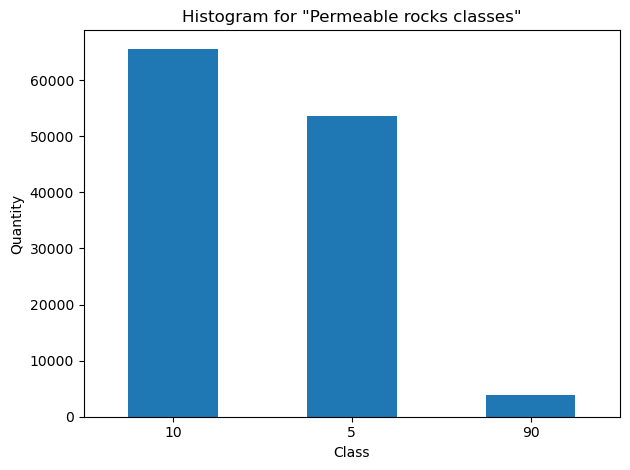

In [28]:
updated_data_0['perm_class'].value_counts().plot(kind='bar')
plt.title('Histogram for "Permeable rocks classes"')
plt.xlabel('Class')
plt.ylabel('Quantity')
plt.xticks(rotation=False)
plt.tight_layout()
plt.show()

In [29]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [30]:
# Replacing 'productive_horizon' values with NaN where 'core_lithology' is not defined
updated_data_0.loc[updated_data_0['core_lithology'].isnull(), 'productive_horizon'] = pd.NA

# Check the result
updated_missing_values = updated_data_0.isnull().sum()
updated_missing_values

well                              0
Depth(m)                          0
gamma_ray(μR/h)                   0
appareent_resistance(ohmm)        0
spontaneous__potential(mV)        0
Ra_concentr(%)                    0
core_lithology                58071
perm_class                        0
productive_horizon            58071
dtype: int64

In [31]:
updated_data_0

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon
0,7699,120.0,6,3.57,4.6,0.0,4.0,10,0
1,7699,120.1,6,3.53,4.8,0.0,4.0,10,0
2,7699,120.2,6,3.50,4.9,0.0,4.0,10,0
3,7699,120.3,7,3.46,5.1,0.0,4.0,10,0
4,7699,120.4,7,3.43,5.4,0.0,4.0,10,0
...,...,...,...,...,...,...,...,...,...
123192,11896,383.4,9,3.83,1.2,0.0,NaN,10,NaN
123193,11896,383.5,9,3.86,1.2,0.0,NaN,10,NaN
123194,11896,383.6,5,3.89,1.2,0.0,NaN,10,NaN
123195,11896,383.7,5,3.92,1.3,0.0,NaN,10,NaN


## For classes 0,1,2,3 (permeable formations):
* If natural background radioactivity of sandstone is less than 20µR/h then there is no uranium (non-productive)
* If equal or more than 20µR/h and less than 80µR/h, then it is has non-commercial reserves
* If equal or more than 80µR/h then it has commercial Uranium reserves

#### The link about it Design and optimization of an integrated gamma ray scanning system for the uranium sample":

dx.doi.org/10.1515/kern-2021-0039

In [31]:
# For core_lithology classes 0, 1, 2, 3
condition1 = updated_data_0['core_lithology'].isin([0, 1, 2, 3])
updated_data_0.loc[condition1 & (updated_data_0['gamma_ray(μR/h)'] < 20), 'productive_horizon'] = 0
updated_data_0.loc[condition1 & (updated_data_0['gamma_ray(μR/h)'] >= 20) & (updated_data_0['gamma_ray(μR/h)'] < 80), 'productive_horizon'] = 2

# For core_lithology classes 4, 5, 6
condition2 = updated_data_0['core_lithology'].isin([4, 5, 6])
updated_data_0.loc[condition2, 'productive_horizon'] = 0

In [32]:
updated_data_0['core_lithology'].isnull().sum()

58071

In [33]:
updated_data_0['core_lithology'].value_counts()

0.0    26350
1.0    25804
4.0     7245
2.0     5243
3.0      432
5.0       50
6.0        2
Name: core_lithology, dtype: int64

In [49]:
updated_data_0['productive_horizon'].value_counts()

0    56175
2     6028
1     2923
Name: productive_horizon, dtype: int64

# Feature engineering
#### Creating new features 1) gamma rate of change 2) gamma ray square
##### the link about it here DOI link for the article titled "Real-Time Gamma Ray Log Generation from Drilling Parameters of Offset Wells Using Physics-Informed Machine Learning":

dx.doi.org/10.2118/212445-pa

In [33]:
updated_data_0['gamma_rate_of_change'] = updated_data_0['gamma_ray(μR/h)'].diff() / updated_data_0['Depth(m)'].diff()
updated_data_0['gamma_squared'] = updated_data_0['gamma_ray(μR/h)'] ** 2
updated_data_0.replace([np.inf, -np.inf], np.nan, inplace=True)

## splitting data into data with all values and data with missing values. Further model training will be conducted on data with all values (without NaN values)

In [36]:
# Разделить данные на две выборкки: один с пропущенными значениями и один без пропущенных значений в столбце «Литология по керну».
data_with_values_new = updated_data_0.dropna(subset=['core_lithology'])
data_missing_values_new = updated_data_0[updated_data_0['core_lithology'].isnull()]

In [37]:
data_with_values_new.to_excel('data_with_values_new.xlsx', index=False)
data_missing_values_new.to_excel('data_missing_values_new.xlsx', index=False)

In [38]:
data_with_values_new

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared
0,7699,120.0,6,3.57,4.6,0.0000,4.0,10,0,NaN,36
1,7699,120.1,6,3.53,4.8,0.0000,4.0,10,0,0.0,36
2,7699,120.2,6,3.50,4.9,0.0000,4.0,10,0,0.0,36
3,7699,120.3,7,3.46,5.1,0.0000,4.0,10,0,10.0,49
4,7699,120.4,7,3.43,5.4,0.0000,4.0,10,0,0.0,49
...,...,...,...,...,...,...,...,...,...,...,...
123169,11896,381.1,68,11.87,10.6,0.0094,0.0,5,2,-50.0,4624
123170,11896,381.2,62,12.24,9.8,0.0098,0.0,5,2,-60.0,3844
123171,11896,381.3,47,13.12,8.7,0.0063,0.0,5,2,-150.0,2209
123172,11896,381.4,40,14.21,7.4,0.0020,3.0,10,2,-70.0,1600


In [40]:
data_missing_values_new

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared
2585,7699,378.5,13,7.37,1.6,0.0018,NaN,5,NaN,10.0,169
2586,7699,378.6,14,5.45,1.4,0.0005,NaN,10,NaN,10.0,196
2587,7699,378.7,15,5.23,1.6,0.0010,NaN,10,NaN,10.0,225
2588,7699,378.8,17,5.19,1.6,0.0016,NaN,10,NaN,20.0,289
2589,7699,378.9,17,5.00,1.7,0.0015,NaN,10,NaN,0.0,289
...,...,...,...,...,...,...,...,...,...,...,...
123192,11896,383.4,9,3.83,1.2,0.0000,NaN,10,NaN,0.0,81
123193,11896,383.5,9,3.86,1.2,0.0000,NaN,10,NaN,0.0,81
123194,11896,383.6,5,3.89,1.2,0.0000,NaN,10,NaN,-40.0,25
123195,11896,383.7,5,3.92,1.3,0.0000,NaN,10,NaN,0.0,25


In [41]:
updated_data_0['core_lithology'].value_counts()

0.0    26350
1.0    25804
4.0     7245
2.0     5243
3.0      432
5.0       50
6.0        2
Name: core_lithology, dtype: int64

# Removing classes with very low amount of measurements in order to avoid imbalance of classes
## the link for that here DOI link for the article titled "Assessing optimal methods for transferring machine learning models to low-volume and imbalanced clinical datasets: experiences from predicting outcomes of Danish trauma patients":

dx.doi.org/10.3389/fdgth.2023.1249258

In [40]:
# Removing rows where core_lithology is in classes [3, 5, 6]
data_with_values_new_filtered = data_with_values_new[~data_with_values_new['core_lithology'].isin([3, 5, 6])]

In [41]:
data_with_values_new_filtered

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared
0,7699,120.0,6,3.57,4.6,0.0000,4.0,10,0,NaN,36
1,7699,120.1,6,3.53,4.8,0.0000,4.0,10,0,0.0,36
2,7699,120.2,6,3.50,4.9,0.0000,4.0,10,0,0.0,36
3,7699,120.3,7,3.46,5.1,0.0000,4.0,10,0,10.0,49
4,7699,120.4,7,3.43,5.4,0.0000,4.0,10,0,0.0,49
...,...,...,...,...,...,...,...,...,...,...,...
123167,11896,380.9,82,8.09,10.9,0.0132,0.0,5,1,0.0,6724
123168,11896,381.0,73,9.76,10.6,0.0090,0.0,5,2,-90.0,5329
123169,11896,381.1,68,11.87,10.6,0.0094,0.0,5,2,-50.0,4624
123170,11896,381.2,62,12.24,9.8,0.0098,0.0,5,2,-60.0,3844


In [42]:
# Option 1: Fill NaN values with the mean (or median) of each column
data_with_values_new_filtered.fillna(data_with_values_new_filtered.mean(), inplace=True)

# Option 2: Drop rows with NaN values
data_with_values_new_filtered.dropna(inplace=True)
data_with_values_new_filtered.replace([np.inf, -np.inf], np.nan, inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_11664\1395966034.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_with_values_new_filtered.fillna(data_with_values_new_filtered.mean(), inplace=True)
C:\Users\user\AppData\Local\Temp\ipykernel_11664\1395966034.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_with_values_new_filtered.dropna(inplace=True)
C:\Users\user\AppData\Local\Temp\ipykernel_11664\1395966034.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://p

# Neccessity of using SMOTE for imbalanced data 
##### link here DOI link for the article titled "Weighted SMOTE Algorithm: A Tool To Improve Disease Prediction With Imbalanced Data":

dx.doi.org/10.1109/ICCE-Taiwan58799.2023.10226703

# Neccessity of using LabelEncoder for ml model
##### link here  Here is the DOI link for the article titled "A Hybrid Machine Learning Model to Estimate Chlorophyll-a in Clear and Coastal Waters":

dx.doi.org/10.1109/IGARSS52108.2023.10282483

In [43]:
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Ensure core_lithology is a categorical feature
data_with_values_new_filtered['core_lithology'] = data_with_values_new_filtered['core_lithology'].astype('category')

X = data_with_values_new_filtered[['Depth(m)', 'gamma_ray(μR/h)', 'appareent_resistance(ohmm)', 'spontaneous__potential(mV)', 'gamma_rate_of_change', 'gamma_squared']]
y = data_with_values_new_filtered['core_lithology']

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train.shape, X_test.shape

C:\Users\user\AppData\Local\Temp\ipykernel_11664\1118711086.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_with_values_new_filtered['core_lithology'] = data_with_values_new_filtered['core_lithology'].astype('category')


((51713, 6), (12929, 6))

In [44]:
# Initialize SMOTE and apply it to the training set only
smote = SMOTE()
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Create a new DataFrame from the balanced training data
balanced_data_train = pd.DataFrame(X_train_smote, columns=X_train.columns)
balanced_data_train['core_lithology'] = y_train_smote

# Display the new class distributions
balanced_data_train['core_lithology'].value_counts()

0.0    21155
1.0    21155
2.0    21155
4.0    21155
Name: core_lithology, dtype: int64

In [45]:
X_test.shape, X_train_smote.shape, y_train_smote.shape

((12929, 6), (84620, 7), (84620,))

In [109]:
balanced_data_train

,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),gamma_rate_of_change,gamma_squared,core_lithology
0,261.000000,8,12.620000,7.700000,0.0,64,0.0
1,309.900000,9,10.800000,0.800000,0.0,81,0.0
2,378.000000,82,6.660000,4.900000,50.0,6724,1.0
3,184.600000,6,14.200000,13.100000,0.0,36,0.0
4,141.500000,7,5.070000,11.800000,0.0,49,2.0
...,...,...,...,...,...,...,...
84615,144.273483,6,5.166257,11.500000,0.0,36,4.0
84616,358.098339,20,6.625595,5.109819,0.0,400,4.0
84617,375.058676,23,4.473681,6.019258,-30.0,529,4.0
84618,132.282859,6,3.374997,11.772866,0.0,36,4.0


In [46]:
data_with_values_new = data_with_values_new.dropna()

In [47]:
X_train_smote.isnull().sum()

Depth(m)                      0
gamma_ray(μR/h)               0
appareent_resistance(ohmm)    0
spontaneous__potential(mV)    0
gamma_rate_of_change          0
gamma_squared                 0
core_lithology                0
dtype: int64

# necessity using GridSearch CV for RandomForestClassifier ml model (prefferebly in Geoscience)
#### The DOI link for the article "Case Study: Neural Network Implementation in Ensemble Machine Learning for Well Log Estimation, Case Applied in Campos Basin" is https://dx.doi.org/10.3997/2214-4609.202183042

param_grid = {
    'n_estimators': [100, 200],
    'max_features': ['auto', 'sqrt'],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False]
}

In [48]:

best_params = {
    'bootstrap': False,
    'max_depth': None,
    'max_features': 'auto',
    'min_samples_leaf': 1,
    'min_samples_split': 2,
    'n_estimators': 200
}

# Computation of a probabilistic uranium concentration map of Norway: A digital expert elicitation approach employing random forests and artificial neural networks
### link for article  https://dx.doi.org/10.1016/j.heliyon.2023.e21791

In [50]:
X_train_smote = X_train_smote[['Depth(m)', 'gamma_ray(μR/h)', 'appareent_resistance(ohmm)', 'spontaneous__potential(mV)', 'gamma_rate_of_change', 'gamma_squared']]

In [51]:
X_test.shape, X_train_smote.shape

((12929, 6), (84620, 6))

              precision    recall  f1-score   support

         0.0       0.87      0.87      0.87      5195
         1.0       0.84      0.81      0.82      5203
         2.0       0.63      0.70      0.67      1114
         4.0       0.79      0.83      0.81      1417

    accuracy                           0.83     12929
   macro avg       0.78      0.80      0.79     12929
weighted avg       0.83      0.83      0.83     12929



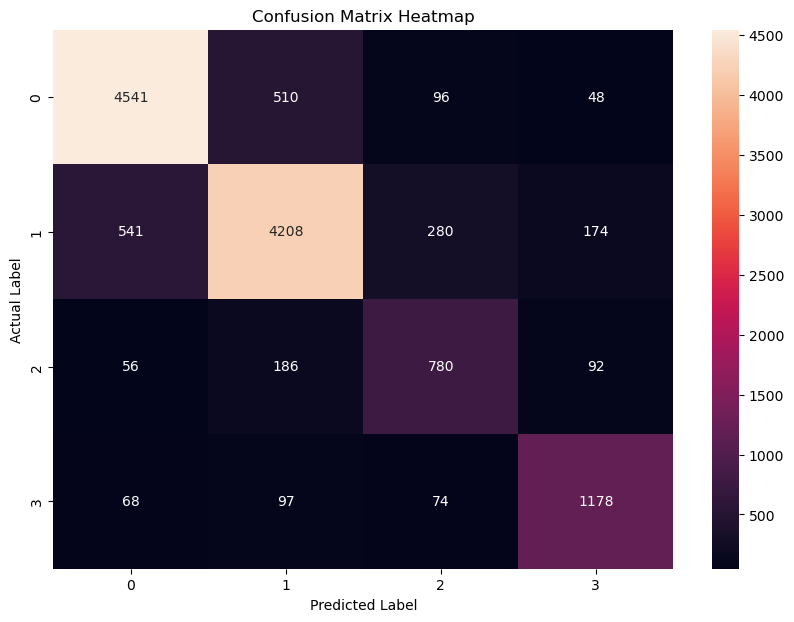

In [52]:
# Train the RandomForestClassifier with best parameters
rf_best = RandomForestClassifier(**best_params, random_state=42)
rf_best.fit(X_train_smote, y_train_smote)

# Predictions
y_pred = rf_best.predict(X_test)

# Classification report
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Heatmap of Confusion Matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='g')
plt.title('Confusion Matrix Heatmap')
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.show()

              precision    recall  f1-score   support

         0.0       0.87      0.87      0.87      5195
         1.0       0.85      0.81      0.83      5203
         2.0       0.63      0.70      0.66      1114
         4.0       0.79      0.84      0.82      1417

    accuracy                           0.83     12929
   macro avg       0.79      0.81      0.80     12929
weighted avg       0.83      0.83      0.83     12929



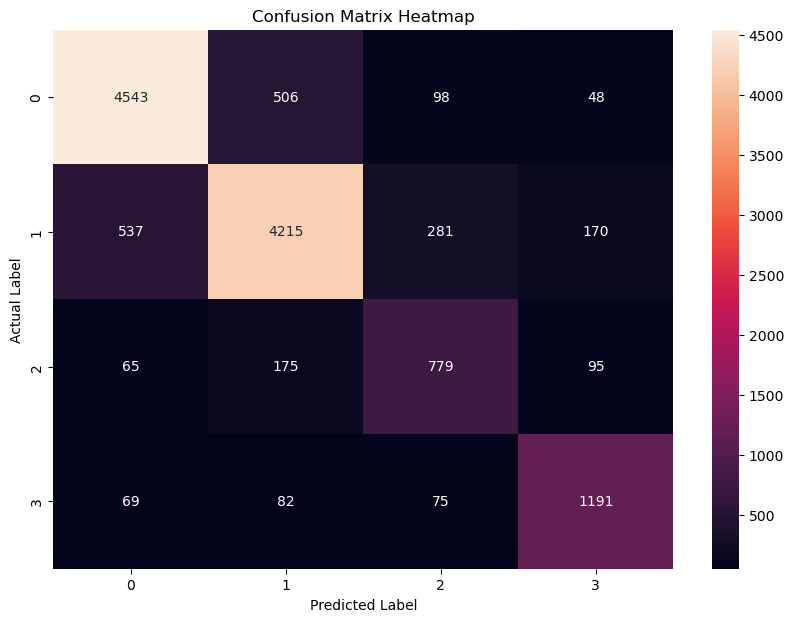

In [116]:
# Train the RandomForestClassifier with best parameters
rf_best = RandomForestClassifier(**best_params, random_state=42)
rf_best.fit(X_train_smote, y_train_smote)

# Predictions
y_pred = rf_best.predict(X_test)

# Classification report
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Heatmap of Confusion Matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='g')
plt.title('Confusion Matrix Heatmap')
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.show()

In [53]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.83


In [54]:
# Ensure the feature columns are numeric and handle NaNs
feature_cols = ['Depth(m)', 'gamma_ray(μR/h)', 'appareent_resistance(ohmm)', 'spontaneous__potential(mV)', 'gamma_rate_of_change', 'gamma_squared']
data_missing_values_new[feature_cols] = data_missing_values_new[feature_cols].apply(pd.to_numeric, errors='coerce')
data_missing_values_new.dropna(subset=feature_cols, inplace=True)

# Now you can use the trained model to predict the 'core_lithology'
# (Replace 'trained_model' with the actual variable name of your trained model)
predicted_lithology = rf_best.predict(data_missing_values_new[feature_cols])

# Add the predictions to the DataFrame
data_missing_values_new['core_lithology'] = predicted_lithology

C:\Users\user\AppData\Local\Temp\ipykernel_11664\2410312392.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_missing_values_new[feature_cols] = data_missing_values_new[feature_cols].apply(pd.to_numeric, errors='coerce')
C:\Users\user\AppData\Local\Temp\ipykernel_11664\2410312392.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_missing_values_new.dropna(subset=feature_cols, inplace=True)
C:\Users\user\AppData\Local\Temp\ipykernel_11664\2410312392.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try 

In [55]:
data_with_values_new

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared
1,7699,120.1,6,3.53,4.8,0.0000,4.0,10,0,0.0,36
2,7699,120.2,6,3.50,4.9,0.0000,4.0,10,0,0.0,36
3,7699,120.3,7,3.46,5.1,0.0000,4.0,10,0,10.0,49
4,7699,120.4,7,3.43,5.4,0.0000,4.0,10,0,0.0,49
5,7699,120.5,7,3.39,5.6,0.0000,4.0,10,0,0.0,49
...,...,...,...,...,...,...,...,...,...,...,...
123169,11896,381.1,68,11.87,10.6,0.0094,0.0,5,2,-50.0,4624
123170,11896,381.2,62,12.24,9.8,0.0098,0.0,5,2,-60.0,3844
123171,11896,381.3,47,13.12,8.7,0.0063,0.0,5,2,-150.0,2209
123172,11896,381.4,40,14.21,7.4,0.0020,3.0,10,2,-70.0,1600


In [56]:
data_missing_values_new

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared
2585,7699,378.5,13,7.37,1.6,0.0018,1.0,5,NaN,10.0,169
2586,7699,378.6,14,5.45,1.4,0.0005,2.0,10,NaN,10.0,196
2587,7699,378.7,15,5.23,1.6,0.0010,2.0,10,NaN,10.0,225
2588,7699,378.8,17,5.19,1.6,0.0016,2.0,10,NaN,20.0,289
2589,7699,378.9,17,5.00,1.7,0.0015,2.0,10,NaN,0.0,289
...,...,...,...,...,...,...,...,...,...,...,...
123192,11896,383.4,9,3.83,1.2,0.0000,4.0,10,NaN,0.0,81
123193,11896,383.5,9,3.86,1.2,0.0000,4.0,10,NaN,0.0,81
123194,11896,383.6,5,3.89,1.2,0.0000,4.0,10,NaN,-40.0,25
123195,11896,383.7,5,3.92,1.3,0.0000,2.0,10,NaN,0.0,25


In [58]:
data_with_values_new.to_excel('data_with_values_new.xlsx', index=False)
data_missing_values_new.to_excel('data_missing_values_new.xlsx', index=False)

In [57]:
data_missing_values_new.isnull().sum()

well                              0
Depth(m)                          0
gamma_ray(μR/h)                   0
appareent_resistance(ohmm)        0
spontaneous__potential(mV)        0
Ra_concentr(%)                    0
core_lithology                    0
perm_class                        0
productive_horizon            58071
gamma_rate_of_change              0
gamma_squared                     0
dtype: int64

0    57668
2      390
1       13
Name: productive_horizon, dtype: int64

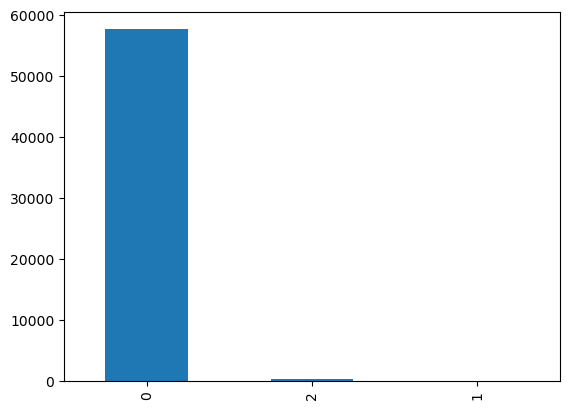

In [99]:
data_missing_values_new['productive_horizon'].value_counts().plot(kind='bar')
data_missing_values_new['productive_horizon'].value_counts()

0    56173
2     6028
1     2923
Name: productive_horizon, dtype: int64

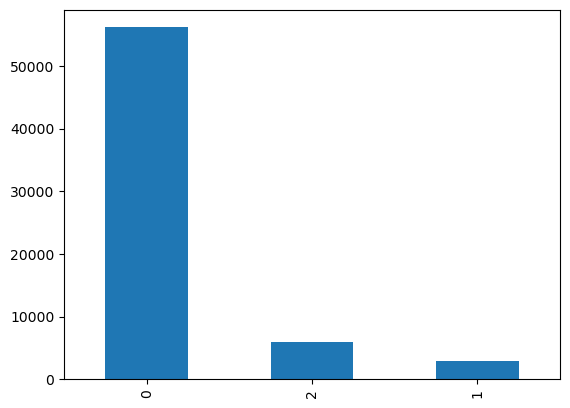

In [79]:
data_with_values_new['productive_horizon'].value_counts().plot(kind='bar')
data_with_values_new['productive_horizon'].value_counts()

In [59]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# First, separate the features and target variable
feature_cols = ['well','Depth(m)', 'gamma_ray(μR/h)', 'appareent_resistance(ohmm)', 'spontaneous__potential(mV)', 'gamma_rate_of_change', 'gamma_squared']
X = data_with_values_new[feature_cols]
y = data_with_values_new['productive_horizon']



In [60]:
data_with_values_new['productive_horizon'].astype(int)

1         0
2         0
3         0
4         0
5         0
         ..
123169    2
123170    2
123171    2
123172    2
123173    2
Name: productive_horizon, Length: 65124, dtype: int32

In [62]:
from sklearn.preprocessing import LabelEncoder

# Assuming your target variable is 'productive_horizon' in 'data_with_values_new'

# Check the data type of the target variable
print(data_with_values_new['productive_horizon'].dtype)

# If the target variable is not numeric, encode it
if data_with_values_new['productive_horizon'].dtype == 'object':
    le = LabelEncoder()
    data_with_values_new['productive_horizon'] = le.fit_transform(data_with_values_new['productive_horizon'])

# Check for NaN values in the target variable and handle them
print(data_with_values_new['productive_horizon'].isnull().sum())

# If NaN values exist, you may choose to drop these rows
data_with_values_new = data_with_values_new.dropna(subset=['productive_horizon'])

# Now proceed with the resampling
# ...

# Ensure y is now a valid target for classification
y = data_with_values_new['productive_horizon']

int32
0


In [63]:
# Perform the train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Define the resampling strategy
oversample_strategy = {1: 20000, 2: 20000}  # Oversample classes 1 and 2
undersample_strategy = {0: 30000}           # Undersample class 0

# Create a pipeline that first applies SMOTE and then applies RandomUnderSampler
resample_pipeline = Pipeline([
    ('smote', SMOTE(sampling_strategy=oversample_strategy)),
    ('under', RandomUnderSampler(sampling_strategy=undersample_strategy))
])

# Apply the pipeline to the training data only
X_train_resampled, y_train_resampled = resample_pipeline.fit_resample(X_train, y_train)

In [90]:
y_train.value_counts()

0    44930
2     4828
1     2341
Name: productive_horizon, dtype: int64

In [91]:
y_train_resampled.value_counts()

0    30000
1    20000
2    20000
Name: productive_horizon, dtype: int64

# Distribution productive horizon Before and after SMOTE 

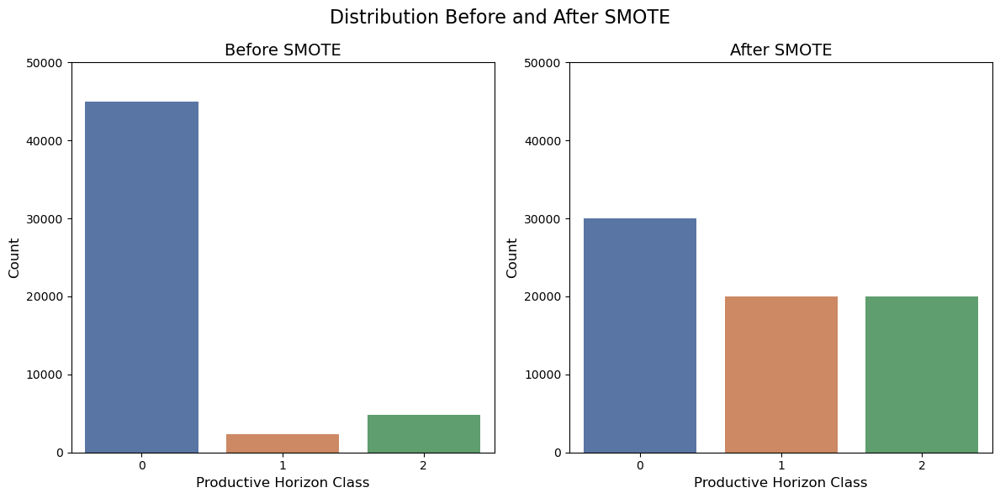

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns

# Updated class distribution before SMOTE
before_smote_counts = [44930, 2341, 4828]
classes = ['0', '1', '2']  # Updated class labels

# Updated class distribution after SMOTE
after_smote_counts = [30000, 20000, 20000]

# Set up the matplotlib figure
plt.figure(figsize=(12, 6))

# Subplot 1: Before SMOTE
plt.subplot(1, 2, 1)
sns.barplot(x=classes, y=before_smote_counts, palette='deep')
plt.title('Before SMOTE', fontsize=14)
plt.xlabel('Productive Horizon Class', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.ylim(0, 50000)  # Adjusted for the new max count

# Subplot 2: After SMOTE
plt.subplot(1, 2, 2)
sns.barplot(x=classes, y=after_smote_counts, palette='deep')
plt.title('After SMOTE', fontsize=14)
plt.xlabel('Productive Horizon Class', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.ylim(0, 50000)  # Adjusted for the new max count

plt.suptitle('Distribution Before and After SMOTE', fontsize=16)
plt.tight_layout()
plt.show()


In [64]:
from sklearn.preprocessing import LabelEncoder

# Convert the target variable to a suitable format if it's not already
if y.dtype == 'object' or y.dtype == 'float':
    le = LabelEncoder()
    y = le.fit_transform(y)

# Check for and handle missing values in X and y
X = X.fillna(X.mean())  # Replace NaNs in features with the mean (or choose another method)
y = y[~pd.isnull(y)]   # Drop NaNs in target variable

# Ensure all features in X are numeric
# Convert or encode non-numeric features as needed
# X = ... (apply conversions if necessary)

# Resample the dataset
X_resampled, y_resampled = resample_pipeline.fit_resample(X, y)

In [65]:
X_train_resampled.shape, X_test.shape

((70000, 7), (13025, 7))

from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# Define the parameter grid for RandomForestClassifier
param_grid = {
    'n_estimators': [100, 200],
    'max_features': ['auto', 'sqrt'],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False]
}

# Initialize the RandomForestClassifier
rf = RandomForestClassifier(random_state=42)

# Set up GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring='accuracy')

# Fit GridSearchCV to the data
grid_search.fit(X_train, y_train)

# Best parameters
best_params = grid_search.best_params_
print("Best parameters:", best_params)

In [66]:
best_params = {'bootstrap': False, 'max_depth': 20, 
               'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}

In [67]:
# Train the RandomForestClassifier with the best parameters
rf_best_2 = RandomForestClassifier(**best_params, random_state=42)
rf_best_2.fit(X_resampled, y_resampled)

RandomForestClassifier(bootstrap=False, max_depth=20, n_estimators=200,
                       random_state=42)

In [68]:
X_test.shape

(13025, 7)

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     11243
           1       0.93      1.00      0.96       582
           2       0.97      1.00      0.99      1200

    accuracy                           0.99     13025
   macro avg       0.97      1.00      0.98     13025
weighted avg       0.99      0.99      0.99     13025

Accuracy: 0.99


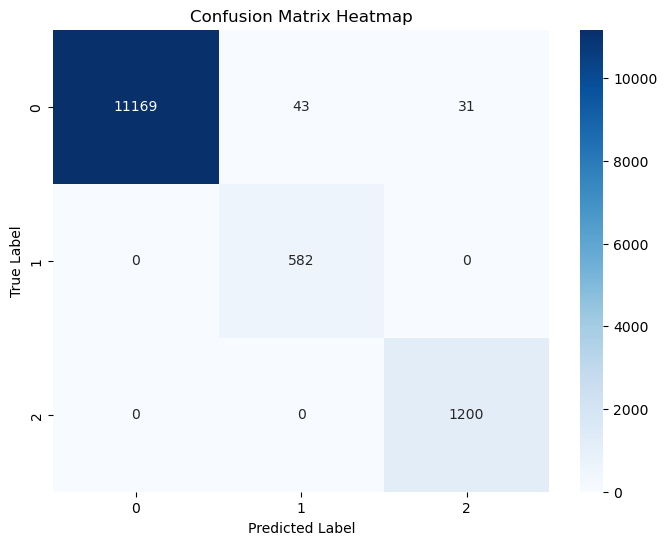

In [141]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt

# Predict on the test set
y_pred = rf_best_2.predict(X_test)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Heatmap of the Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix Heatmap')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Feature importance for productive_horizon

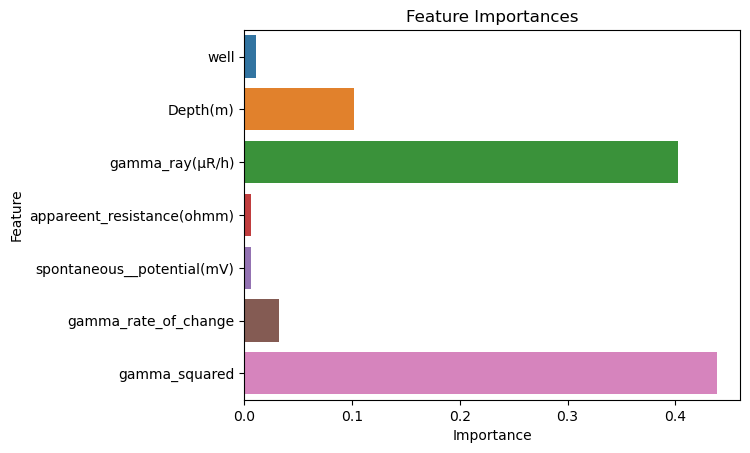

In [80]:
# Feature Importance Visualization
feature_importances = rf_best_2.feature_importances_
sns.barplot(x=feature_importances, y=X_resampled.columns)
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


# 

In [85]:

from sklearn.tree import export_graphviz
import matplotlib.pyplot as plt
import os

# Selecting one tree from the random forest model
tree = rf_best_2.estimators_[0]

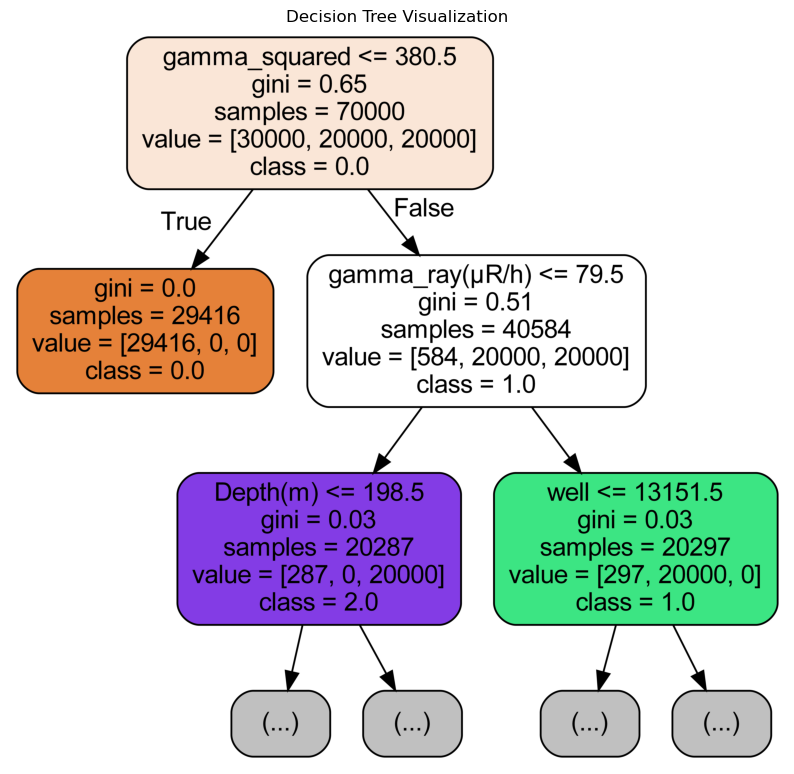

In [88]:
# Exporting the tree to a dot file with limited depth
export_graphviz(tree, out_file='tree_0.dot', 
                feature_names=['well','Depth(m)', 'gamma_ray(μR/h)', 'appareent_resistance(ohmm)', 
                               'spontaneous__potential(mV)', 'gamma_rate_of_change', 'gamma_squared'],
                class_names=y_train_smote.astype(str).unique(),
                rounded=True, proportion=False, 
                precision=2, filled=True, max_depth=2)

# Convert the dot file to a png file
os.system('dot -Tpng tree_0.dot -o tree_0.png -Gdpi=1500')

# Displaying the tree
img = plt.imread('tree_0.png')
plt.figure(figsize=(10, 10))  # Adjust size as needed
plt.imshow(img)
plt.axis('off')  # Turn off the axis
plt.title(f'Decision Tree Visualization')
plt.show()

In [155]:
merged_df_1 = pd.concat([data_with_values_new, data_missing_values_new])
merged_df_1

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared
1,7699,120.1,6,3.53,4.8,0.0,4.0,10,0,0.0,36
2,7699,120.2,6,3.50,4.9,0.0,4.0,10,0,0.0,36
3,7699,120.3,7,3.46,5.1,0.0,4.0,10,0,10.0,49
4,7699,120.4,7,3.43,5.4,0.0,4.0,10,0,0.0,49
5,7699,120.5,7,3.39,5.6,0.0,4.0,10,0,0.0,49
...,...,...,...,...,...,...,...,...,...,...,...
123192,11896,383.4,9,3.83,1.2,0.0,4.0,10,NaN,0.0,81
123193,11896,383.5,9,3.86,1.2,0.0,4.0,10,NaN,0.0,81
123194,11896,383.6,5,3.89,1.2,0.0,4.0,10,NaN,-40.0,25
123195,11896,383.7,5,3.92,1.3,0.0,2.0,10,NaN,0.0,25


In [156]:
merged_df_2 = merged_df_1.copy()

In [157]:
merged_df_1['predicted_productive_horizon'] = merged_df_1['productive_horizon']

In [158]:
merged_df_1.isnull().sum()

well                                0
Depth(m)                            0
gamma_ray(μR/h)                     0
appareent_resistance(ohmm)          0
spontaneous__potential(mV)          0
Ra_concentr(%)                      0
core_lithology                      0
perm_class                          0
productive_horizon              58071
gamma_rate_of_change                0
gamma_squared                       0
predicted_productive_horizon    58071
dtype: int64

In [159]:
# Select rows where productive_horizon is missing
missing_horizon_mask = merged_df_1['productive_horizon'].isnull()

# Extract features for prediction
X_missing = merged_df_1.loc[missing_horizon_mask, ['Depth(m)', 'gamma_ray(μR/h)', 'appareent_resistance(ohmm)', 
                                                   'spontaneous__potential(mV)', 'core_lithology', 'gamma_rate_of_change', 'gamma_squared']]

# Predict productive_horizon for these rows
predicted_horizon = rf_best_2.predict(X_missing)

# Assign predictions to 'predicted_productive_horizon' only for rows with missing productive_horizon
merged_df_1.loc[missing_horizon_mask, 'predicted_productive_horizon'] = predicted_horizon

C:\Users\user\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- core_lithology
Feature names seen at fit time, yet now missing:
- well

  warnings.warn(message, FutureWarning)


In [160]:
merged_df_1['predicted_productive_horizon'].value_counts()

0    114244
2      6028
1      2923
Name: predicted_productive_horizon, dtype: int64

In [161]:
merged_df_1

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared,predicted_productive_horizon
1,7699,120.1,6,3.53,4.8,0.0,4.0,10,0,0.0,36,0
2,7699,120.2,6,3.50,4.9,0.0,4.0,10,0,0.0,36,0
3,7699,120.3,7,3.46,5.1,0.0,4.0,10,0,10.0,49,0
4,7699,120.4,7,3.43,5.4,0.0,4.0,10,0,0.0,49,0
5,7699,120.5,7,3.39,5.6,0.0,4.0,10,0,0.0,49,0
...,...,...,...,...,...,...,...,...,...,...,...,...
123192,11896,383.4,9,3.83,1.2,0.0,4.0,10,<NA>,0.0,81,0
123193,11896,383.5,9,3.86,1.2,0.0,4.0,10,<NA>,0.0,81,0
123194,11896,383.6,5,3.89,1.2,0.0,4.0,10,<NA>,-40.0,25,0
123195,11896,383.7,5,3.92,1.3,0.0,2.0,10,<NA>,0.0,25,0


In [162]:
merged_df_1.isnull().sum()

well                                0
Depth(m)                            0
gamma_ray(μR/h)                     0
appareent_resistance(ohmm)          0
spontaneous__potential(mV)          0
Ra_concentr(%)                      0
core_lithology                      0
perm_class                          0
productive_horizon              58071
gamma_rate_of_change                0
gamma_squared                       0
predicted_productive_horizon        0
dtype: int64

In [169]:
merged_df_1['productive_horizon'].fillna(999, inplace=True)

In [170]:
merged_df_1

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared,predicted_productive_horizon
1,7699,120.1,6,3.53,4.8,0.0,4.0,10,0,0.0,36,0
2,7699,120.2,6,3.50,4.9,0.0,4.0,10,0,0.0,36,0
3,7699,120.3,7,3.46,5.1,0.0,4.0,10,0,10.0,49,0
4,7699,120.4,7,3.43,5.4,0.0,4.0,10,0,0.0,49,0
5,7699,120.5,7,3.39,5.6,0.0,4.0,10,0,0.0,49,0
...,...,...,...,...,...,...,...,...,...,...,...,...
123192,11896,383.4,9,3.83,1.2,0.0,4.0,10,999,0.0,81,0
123193,11896,383.5,9,3.86,1.2,0.0,4.0,10,999,0.0,81,0
123194,11896,383.6,5,3.89,1.2,0.0,4.0,10,999,-40.0,25,0
123195,11896,383.7,5,3.92,1.3,0.0,2.0,10,999,0.0,25,0


y_pred_df = pd.DataFrame(y_pred, columns=['y_pred'])
y_test_df = pd.DataFrame(y_test).reset_index(drop=True)
merged_df = pd.concat([X_test.reset_index(drop=True), y_test_df, y_pred_df], axis=1)
merged_df

# 30.11.2023 Start From Here

merged_df.to_excel("merged_df.xlsx", engine='openpyxl', index=False)

In [3]:
merged_df = pd.read_excel('merged_df.xlsx')

In [4]:
merged_df

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),gamma_rate_of_change,gamma_squared,productive_horizon,y_pred
0,7699,213.7,6,7.85,3.9,0.0,36,0,0
1,13153,370.2,82,6.57,14.2,-30.0,6724,0,0
2,13127,347.2,13,5.98,10.8,-10.0,169,0,0
3,12444,356.2,92,5.71,10.7,60.0,8464,1,1
4,13155,318.4,8,8.15,9.5,0.0,64,0,0
...,...,...,...,...,...,...,...,...,...
13020,12442,196.7,5,8.99,11.5,0.0,25,0,0
13021,13133,334.5,9,6.75,8.3,0.0,81,0,0
13022,7699,164.0,7,9.78,10.8,0.0,49,0,0
13023,7699,205.1,6,7.09,7.8,-10.0,36,0,0


well_data_7699 = merged_df[merged_df['well'] == 7699]
well_data_7699 = well_data_7699.sort_values('Depth(m)', ascending=True)
well_data_7699

# 09.12.2023 Start from here

In [3]:
merged_df_1 = pd.read_excel('merged_df_1.xlsx')

In [4]:
merged_df_1

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared,predicted_productive_horizon
0,7699,120.1,6,3.53,4.8,0.0,4,10,0,0.0,36,0
1,7699,120.2,6,3.50,4.9,0.0,4,10,0,0.0,36,0
2,7699,120.3,7,3.46,5.1,0.0,4,10,0,10.0,49,0
3,7699,120.4,7,3.43,5.4,0.0,4,10,0,0.0,49,0
4,7699,120.5,7,3.39,5.6,0.0,4,10,0,0.0,49,0
...,...,...,...,...,...,...,...,...,...,...,...,...
123190,11896,383.4,9,3.83,1.2,0.0,4,10,999,0.0,81,0
123191,11896,383.5,9,3.86,1.2,0.0,4,10,999,0.0,81,0
123192,11896,383.6,5,3.89,1.2,0.0,4,10,999,-40.0,25,0
123193,11896,383.7,5,3.92,1.3,0.0,2,10,999,0.0,25,0


In [10]:
merged_df_1['predicted_productive_horizon'].value_counts()

0    114244
2      6028
1      2923
Name: predicted_productive_horizon, dtype: int64

In [176]:
well_data_7699 = merged_df_1[merged_df_1['well'] == 7699]
well_data_7699 = well_data_7699.sort_values('Depth(m)', ascending=True)
well_data_7699

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared,predicted_productive_horizon
1,7699,120.1,6,3.53,4.8,0.0,4.0,10,0,0.0,36,0
2,7699,120.2,6,3.50,4.9,0.0,4.0,10,0,0.0,36,0
3,7699,120.3,7,3.46,5.1,0.0,4.0,10,0,10.0,49,0
4,7699,120.4,7,3.43,5.4,0.0,4.0,10,0,0.0,49,0
5,7699,120.5,7,3.39,5.6,0.0,4.0,10,0,0.0,49,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2622,7699,382.2,8,4.77,0.3,0.0,4.0,10,999,0.0,64,0
2623,7699,382.3,8,4.77,0.3,0.0,4.0,10,999,0.0,64,0
2624,7699,382.4,8,4.77,0.3,0.0,4.0,10,999,0.0,64,0
2625,7699,382.5,8,4.77,0.3,0.0,4.0,10,999,0.0,64,0


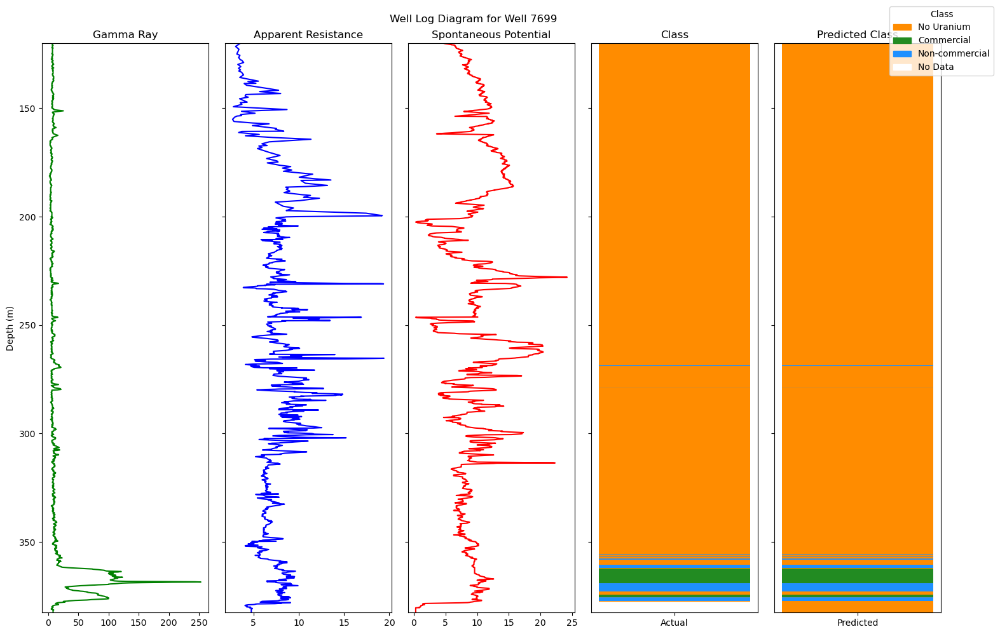

In [174]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
import pandas as pd

# Assuming well_data is your DataFrame
# well_data = pd.read_csv('path_to_your_data.csv')  # Uncomment this line and replace with your actual file path

# Define the colormap for the facies including 'No Data' class
colors = ['#FF8C00', '#228B22', '#1E90FF', '#FFFFFF']  # Adding white for 'No Data'
cmap = mcolors.ListedColormap(colors)
bounds = [0, 1, 2, 3, 4]  # Adding boundary for the 'No Data' class
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Define facies labels including 'No Data'
facies_labels = ['No Uranium', 'Commercial', 'Non-commercial', 'No Data']

# Create subplots
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(15, 10), sharey=True)

# Plot features against depth
axs[0].plot(well_data_7699['gamma_ray(μR/h)'], well_data_7699['Depth(m)'], 'g', label='Gamma Ray')
axs[1].plot(well_data_7699['appareent_resistance(ohmm)'], well_data_7699['Depth(m)'], 'b', label='Apparent Resistance')
axs[2].plot(well_data_7699['spontaneous__potential(mV)'], well_data_7699['Depth(m)'], 'r', label='Spontaneous Potential')

# Set y-axis label and invert y-axis
axs[0].set_ylabel('Depth (m)')
for ax in axs:
    ax.invert_yaxis()
    ax.set_ylim(well_data_7699['Depth(m)'].max(), well_data_7699['Depth(m)'].min())

# Replace 999 with 3 (representing 'No Data') for plotting
well_data_7699['productive_horizon_plot'] = well_data_7699['productive_horizon'].replace(999, 3)
well_data_7699['predicted_productive_horizon_plot'] = well_data_7699['predicted_productive_horizon'].replace(999, 3)

# Plot actual and predicted labels with colors
for d, actual, predicted in zip(well_data_7699['Depth(m)'], well_data_7699['productive_horizon_plot'], well_data_7699['predicted_productive_horizon_plot']):
    axs[3].hlines(d, xmin=0, xmax=0.5, colors=cmap(norm([actual]))[0], linewidth=4)
    axs[4].hlines(d, xmin=0.5, xmax=1, colors=cmap(norm([predicted]))[0], linewidth=4)

# Set x-axis labels and titles
axs[3].set_xticks([0.25])
axs[3].set_xticklabels(['Actual'])
axs[4].set_xticks([0.75])
axs[4].set_xticklabels(['Predicted'])
axs[0].set_title('Gamma Ray')
axs[1].set_title('Apparent Resistance')
axs[2].set_title('Spontaneous Potential')
axs[3].set_title('Class')
axs[4].set_title('Predicted Class')

# Create patches for the legend
facies_patches = [Patch(color=colors[i], label=facies_labels[i]) for i in range(len(colors))]

# Add legend outside the subplots
fig.legend(handles=facies_patches, loc='upper right', bbox_to_anchor=(1.05, 1), title='Class')

# Set global title and adjust layout
fig.suptitle('Well Log Diagram for Well 7699')
plt.tight_layout()
plt.show()

In [183]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
import pandas as pd

In [184]:
well_data_13153 = merged_df_1[merged_df_1['well'] == 13153]
well_data_13153 = well_data_13153.sort_values('Depth(m)', ascending=True)
well_data_13153

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared,predicted_productive_horizon
79614,13153,120.0,6,2.64,10.9,0.0,4.0,10,999,0.011372,36,0
79615,13153,120.1,6,2.72,10.9,0.0,4.0,10,999,0.000000,36,0
79616,13153,120.2,5,2.79,10.9,0.0,4.0,10,999,-10.000000,25,0
79617,13153,120.3,6,2.76,10.9,0.0,4.0,10,999,10.000000,36,0
79618,13153,120.4,6,2.72,10.9,0.0,4.0,10,999,0.000000,36,0
...,...,...,...,...,...,...,...,...,...,...,...,...
82234,13153,382.0,9,2.43,5.4,0.0,4.0,10,999,20.000000,81,0
82235,13153,382.1,9,2.43,5.5,0.0,4.0,10,999,0.000000,81,0
82236,13153,382.2,9,2.43,5.7,0.0,4.0,10,999,0.000000,81,0
82237,13153,382.3,9,2.52,5.8,0.0,4.0,10,999,0.000000,81,0


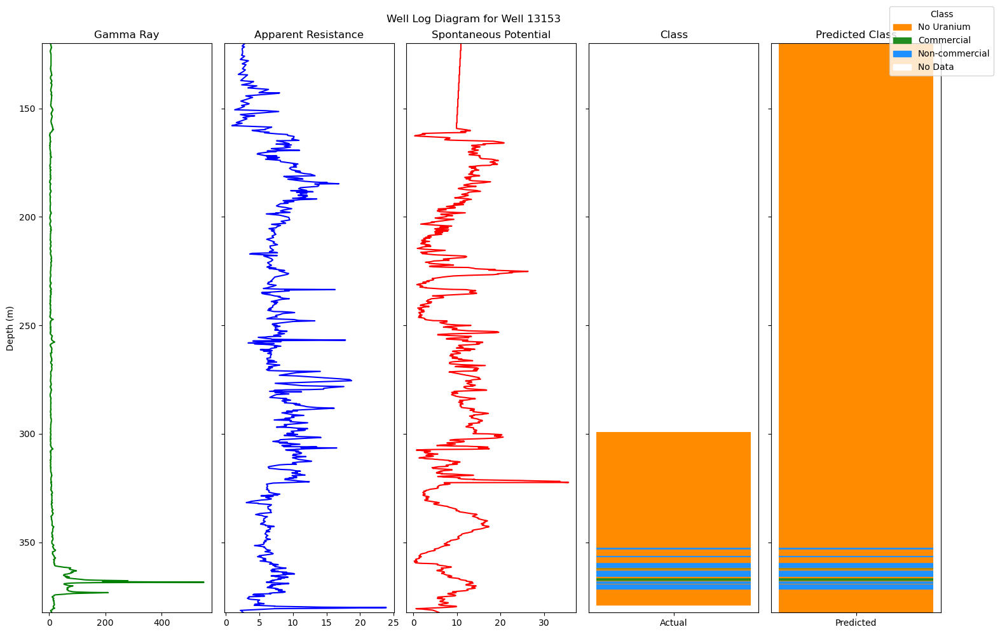

In [186]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
import pandas as pd

# Assuming well_data is your DataFrame
# well_data = pd.read_csv('path_to_your_data.csv')  # Uncomment this line and replace with your actual file path

# Define the colormap for the facies including 'No Data' class
colors = ['#FF8C00', '#228B22', '#1E90FF', '#FFFFFF']  # Adding white for 'No Data'
cmap = mcolors.ListedColormap(colors)
bounds = [0, 1, 2, 3, 4]  # Adding boundary for the 'No Data' class
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Define facies labels including 'No Data'
facies_labels = ['No Uranium', 'Commercial', 'Non-commercial', 'No Data']

# Create subplots
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(15, 10), sharey=True)

# Plot features against depth
axs[0].plot(well_data_13153['gamma_ray(μR/h)'], well_data_13153['Depth(m)'], 'g', label='Gamma Ray')
axs[1].plot(well_data_13153['appareent_resistance(ohmm)'], well_data_13153['Depth(m)'], 'b', label='Apparent Resistance')
axs[2].plot(well_data_13153['spontaneous__potential(mV)'], well_data_13153['Depth(m)'], 'r', label='Spontaneous Potential')

# Set y-axis label and invert y-axis
axs[0].set_ylabel('Depth (m)')
for ax in axs:
    ax.invert_yaxis()
    ax.set_ylim(well_data_13153['Depth(m)'].max(), well_data_13153['Depth(m)'].min())

# Replace 999 with 3 (representing 'No Data') for plotting
well_data_13153['productive_horizon_plot'] = well_data_13153['productive_horizon'].replace(999, 3)
well_data_13153['predicted_productive_horizon_plot'] = well_data_13153['predicted_productive_horizon'].replace(999, 3)

# Plot actual and predicted labels with colors
for d, actual, predicted in zip(well_data_13153['Depth(m)'], well_data_13153['productive_horizon_plot'], well_data_13153['predicted_productive_horizon_plot']):
    axs[3].hlines(d, xmin=0, xmax=0.5, colors=cmap(norm([actual]))[0], linewidth=4)
    axs[4].hlines(d, xmin=0.5, xmax=1, colors=cmap(norm([predicted]))[0], linewidth=4)

# Set x-axis labels and titles
axs[3].set_xticks([0.25])
axs[3].set_xticklabels(['Actual'])
axs[4].set_xticks([0.75])
axs[4].set_xticklabels(['Predicted'])
axs[0].set_title('Gamma Ray')
axs[1].set_title('Apparent Resistance')
axs[2].set_title('Spontaneous Potential')
axs[3].set_title('Class')
axs[4].set_title('Predicted Class')

# Create patches for the legend
facies_patches = [Patch(color=colors[i], label=facies_labels[i]) for i in range(len(colors))]

# Add legend outside the subplots
fig.legend(handles=facies_patches, loc='upper right', bbox_to_anchor=(1.05, 1), title='Class')

# Set global title and adjust layout
fig.suptitle('Well Log Diagram for Well 13153')
plt.tight_layout()
plt.show()

# Cycle for vizualizations above for all wells in dataset merged_df_1

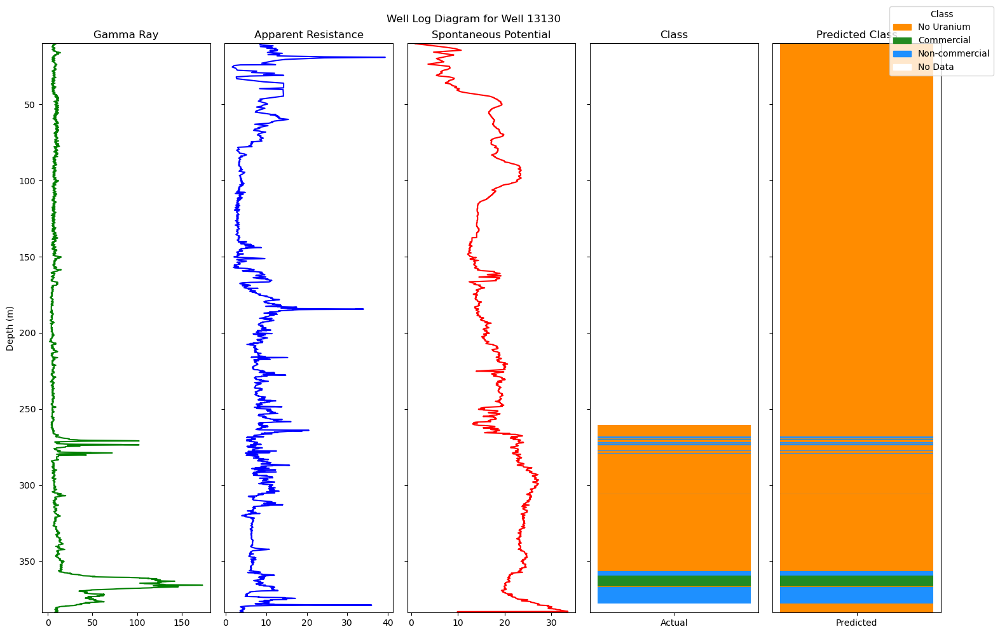

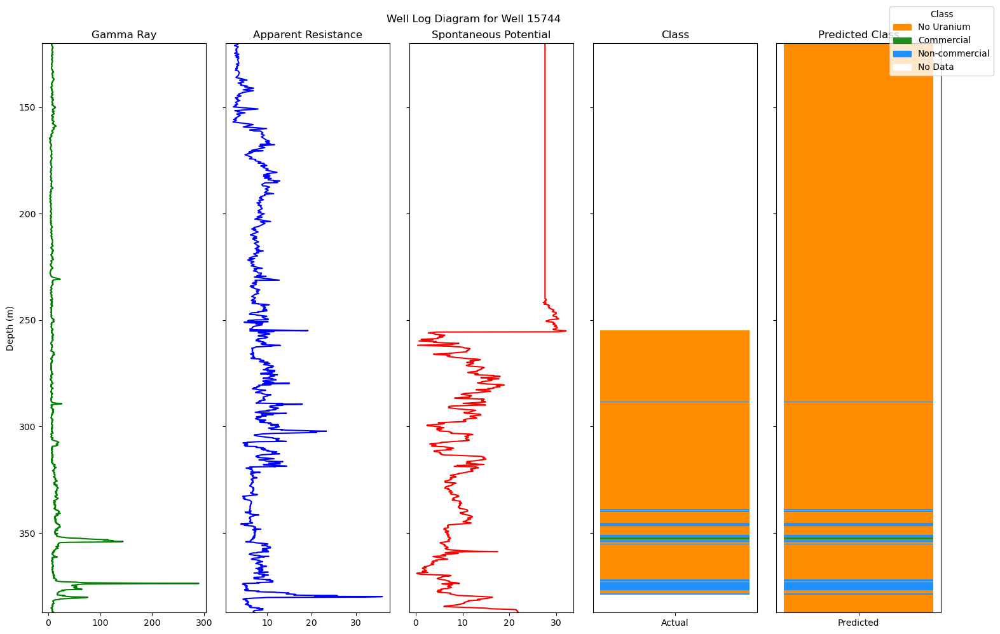

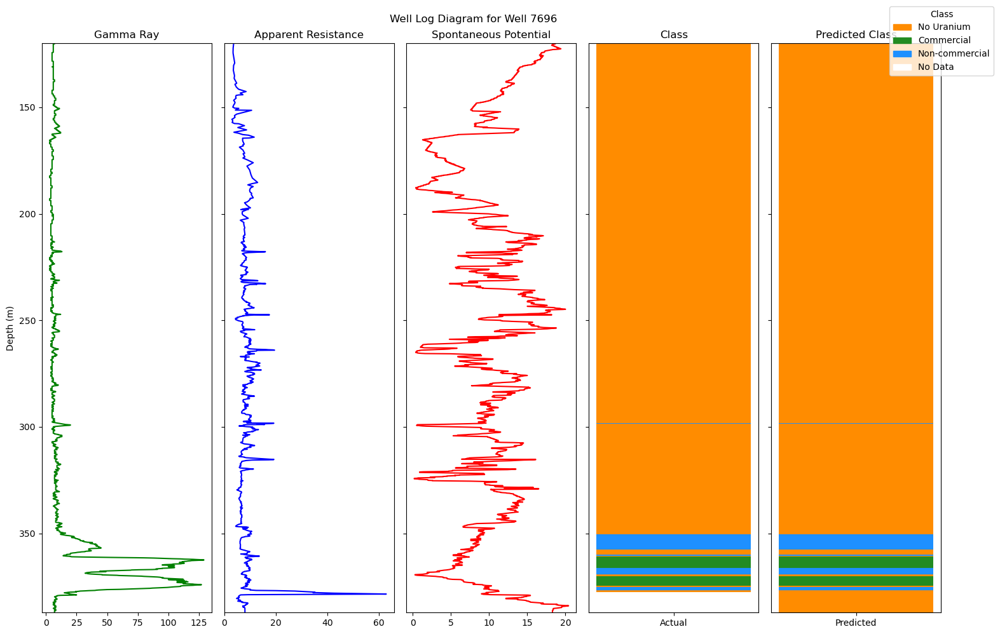

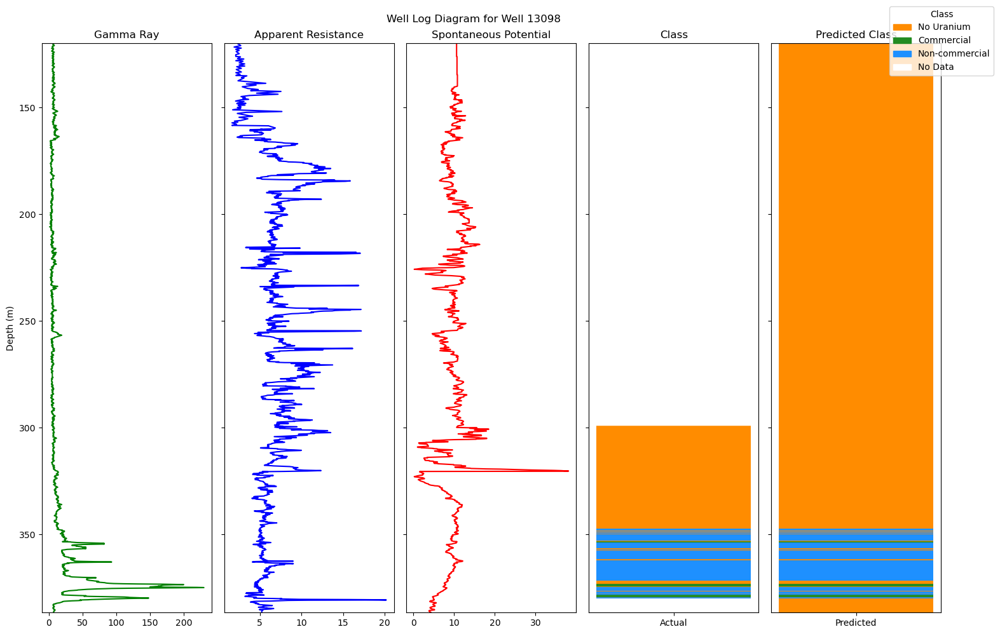

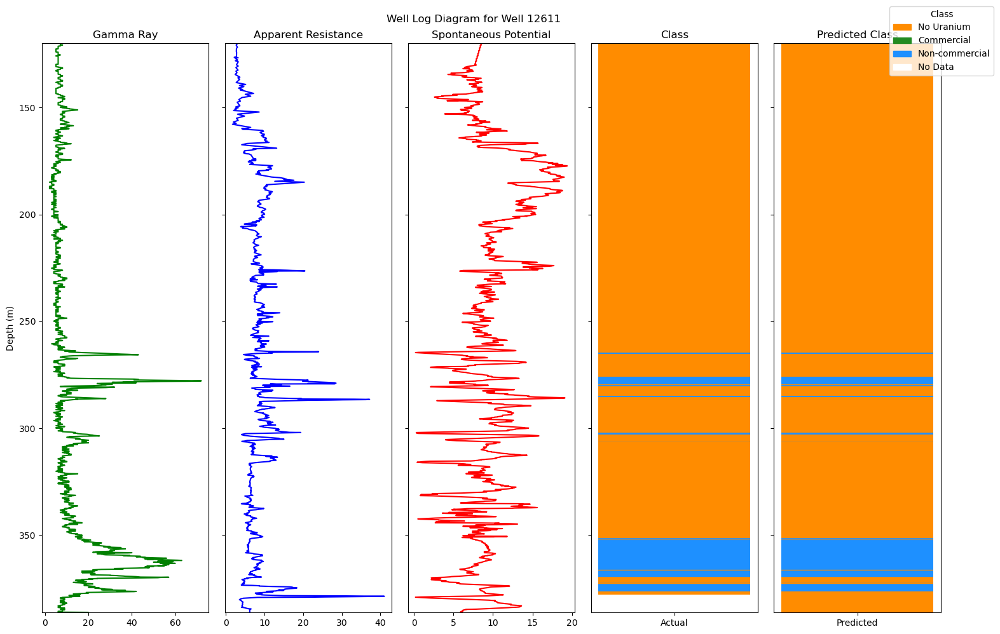

...

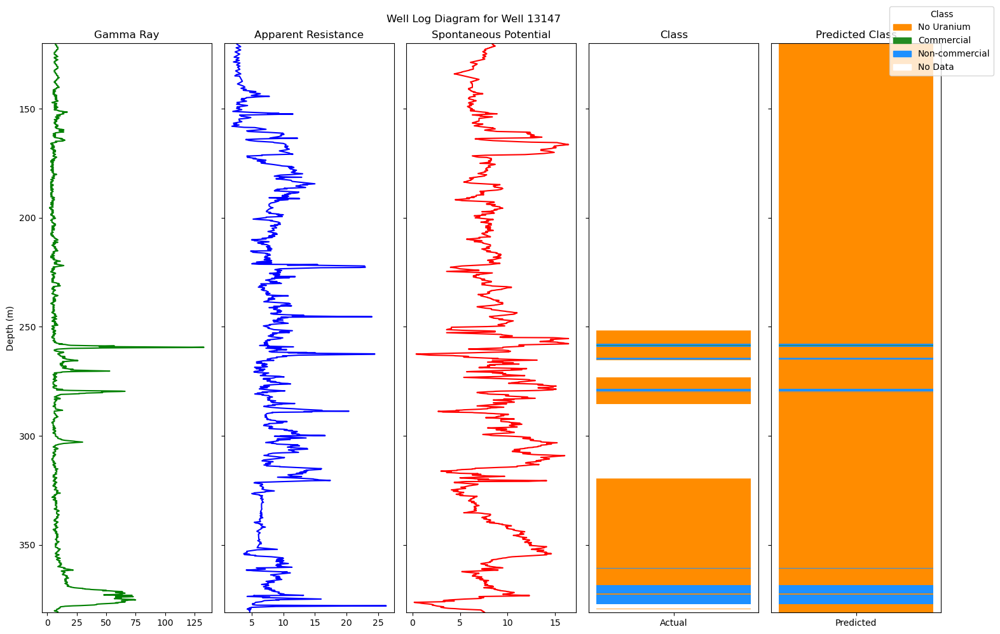

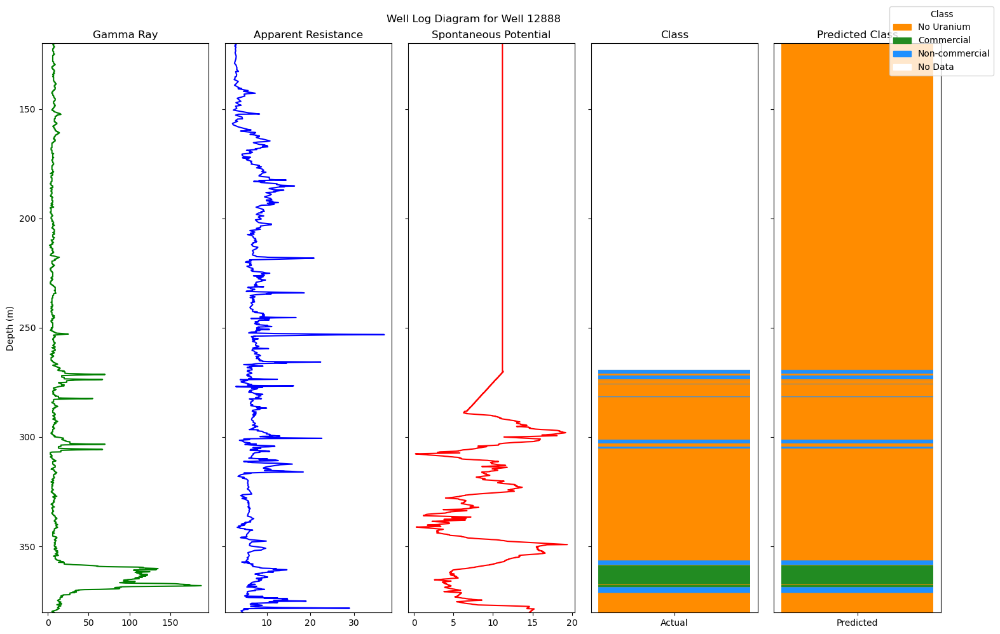

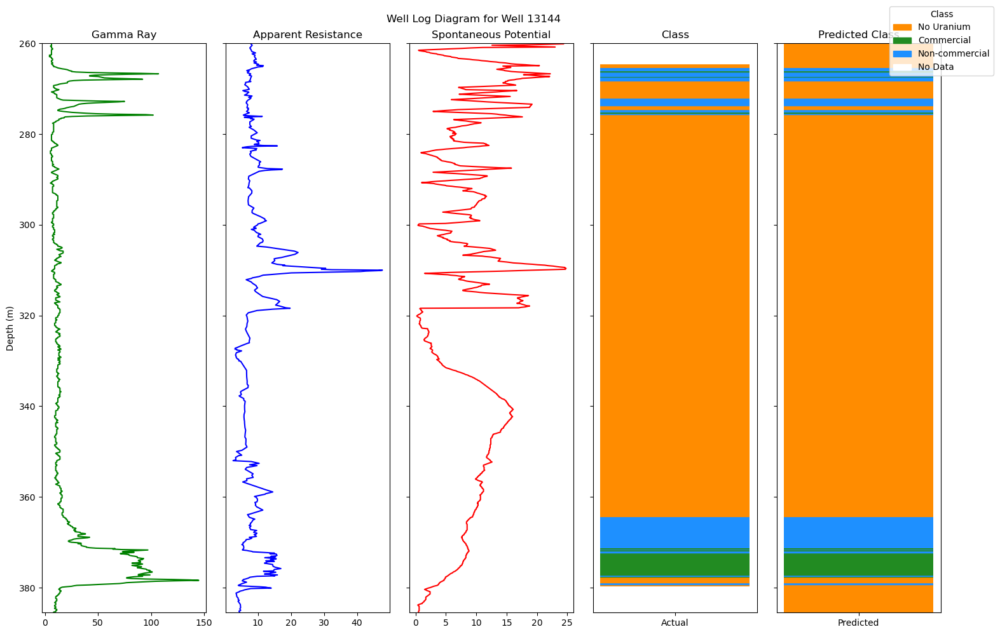

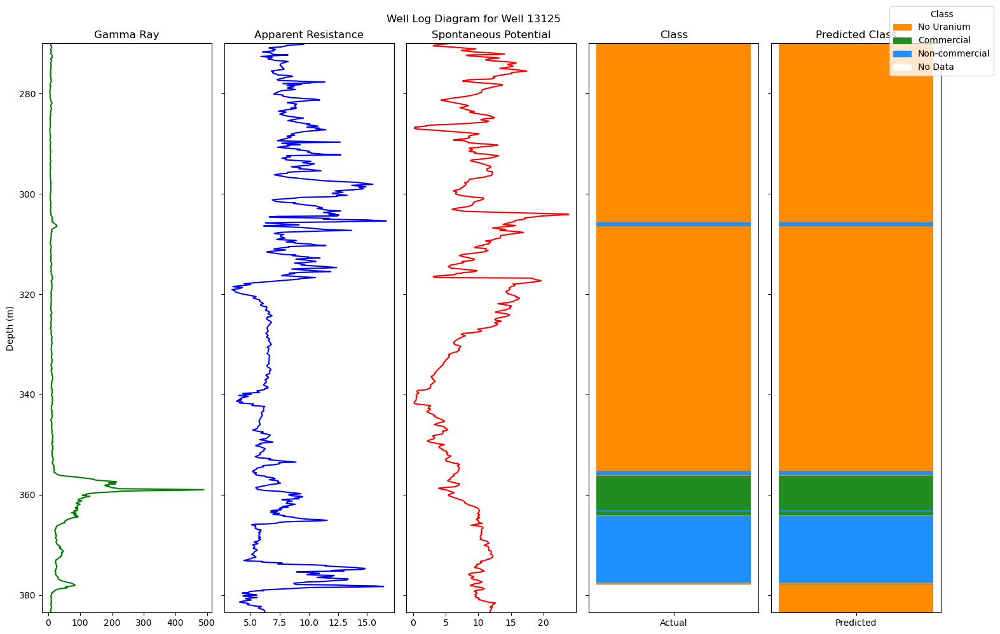

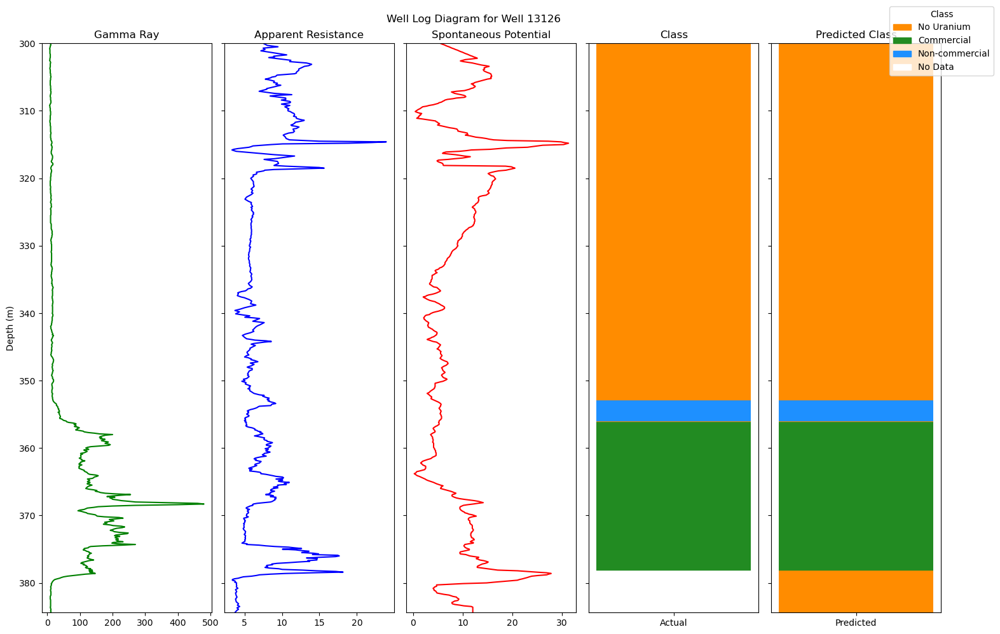

In [192]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
import pandas as pd

# Define the colormap for the facies including 'No Data' class
colors = ['#FF8C00', '#228B22', '#1E90FF', '#FFFFFF']  # Adding white for 'No Data'
cmap = mcolors.ListedColormap(colors)
bounds = [0, 1, 2, 3, 4]  # Adding boundary for the 'No Data' class
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Define facies labels including 'No Data'
facies_labels = ['No Uranium', 'Commercial', 'Non-commercial', 'No Data']

# List of wells
wells = [13130, 15744, 7696, 13098, 12611, 13148, 13140, 13134, 13207, 13128, 13131, 13155, 13145, 12441, 12442, 13132, 13127, 13143, 13135, 13138, 13133, 13136, 13152, 13129, 12444, 13141, 11896, 13154, 12891, 7596, 13156, 12440, 12889, 13146, 12890, 7698, 13137, 7699, 13153, 12893, 7694, 12892, 7697, 13147, 12888, 13144, 13125, 13126]

# Loop through each well and create a plot
for well in wells:
    well_data = merged_df_1[merged_df_1['well'] == well]
    well_data = well_data.sort_values('Depth(m)', ascending=True)

    # Replace 999 with 3 (representing 'No Data') for plotting
    well_data['productive_horizon_plot'] = well_data['productive_horizon'].replace(999, 3)
    well_data['predicted_productive_horizon_plot'] = well_data['predicted_productive_horizon'].replace(999, 3)

    # Create subplots
    fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(15, 10), sharey=True)

    # Plot features against depth
    axs[0].plot(well_data['gamma_ray(μR/h)'], well_data['Depth(m)'], 'g', label='Gamma Ray')
    axs[1].plot(well_data['appareent_resistance(ohmm)'], well_data['Depth(m)'], 'b', label='Apparent Resistance')
    axs[2].plot(well_data['spontaneous__potential(mV)'], well_data['Depth(m)'], 'r', label='Spontaneous Potential')

    # Set y-axis label and invert y-axis
    axs[0].set_ylabel('Depth (m)')
    for ax in axs:
        ax.invert_yaxis()
        ax.set_ylim(well_data['Depth(m)'].max(), well_data['Depth(m)'].min())

    # Plot actual and predicted labels with colors
    for d, actual, predicted in zip(well_data['Depth(m)'], well_data['productive_horizon_plot'], well_data['predicted_productive_horizon_plot']):
        axs[3].hlines(d, xmin=0, xmax=0.5, colors=cmap(norm([actual]))[0], linewidth=4)
        axs[4].hlines(d, xmin=0.5, xmax=1, colors=cmap(norm([predicted]))[0], linewidth=4)

    # Set x-axis labels and titles
    axs[3].set_xticks([0.25])
    axs[3].set_xticklabels(['Actual'])
    axs[4].set_xticks([0.75])
    axs[4].set_xticklabels(['Predicted'])

    # Set titles
    axs[0].set_title('Gamma Ray')
    axs[1].set_title('Apparent Resistance')
    axs[2].set_title('Spontaneous Potential')
    axs[3].set_title('Class')
    axs[4].set_title('Predicted Class')

    # Add legend
    facies_patches = [Patch(color=colors[i], label=facies_labels[i]) for i in range(len(colors))]
    fig.legend(handles=facies_patches, loc='upper right', bbox_to_anchor=(1.05, 1), title='Class')

    # Set global title and adjust layout
    fig.suptitle(f'Well Log Diagram for Well {well}')
    plt.tight_layout()
    plt.show()

# 09.12.2023 Creating visualizations for well logs (gamma, apparent resist, SP, Actual Lithology, Predicted Actual Lithology) 

In [ ]:
updated_data_1 = pd.read_excel("processed_data_eng.xlsx")

In [13]:
updated_data_1 = updated_data.copy()

In [198]:
updated_data_1

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon
0,7699,120.0,6,3.57,4.6,0.0,4.0,10,0
1,7699,120.1,6,3.53,4.8,0.0,4.0,10,0
2,7699,120.2,6,3.50,4.9,0.0,4.0,10,0
3,7699,120.3,7,3.46,5.1,0.0,4.0,10,0
4,7699,120.4,7,3.43,5.4,0.0,4.0,10,0
...,...,...,...,...,...,...,...,...,...
123192,11896,383.4,9,3.83,1.2,0.0,NaN,10,0
123193,11896,383.5,9,3.86,1.2,0.0,NaN,10,0
123194,11896,383.6,5,3.89,1.2,0.0,NaN,10,0
123195,11896,383.7,5,3.92,1.3,0.0,NaN,10,0


In [15]:
# Replacing 'productive_horizon' values with NaN where 'core_lithology' is not defined
updated_data_1.loc[updated_data_1['core_lithology'].isnull(), 'productive_horizon'] = pd.NA

# Check the result
updated_missing_values = updated_data_1.isnull().sum()
updated_missing_values

well                              0
Depth(m)                          0
gamma_ray(μR/h)                   0
appareent_resistance(ohmm)        0
spontaneous__potential(mV)        0
Ra_concentr(%)                    0
core_lithology                58071
perm_class                        0
productive_horizon            58071
dtype: int64

In [16]:
updated_data_1['gamma_rate_of_change'] = updated_data_1['gamma_ray(μR/h)'].diff() / updated_data_1['Depth(m)'].diff()
updated_data_1['gamma_squared'] = updated_data_1['gamma_ray(μR/h)'] ** 2
updated_data_1.replace([np.inf, -np.inf], np.nan, inplace=True)

In [17]:
# Разделить данные на две выборкки: один с пропущенными значениями и один без пропущенных значений в столбце «Литология по керну».
data_with_values_new_1 = updated_data_1.dropna(subset=['core_lithology'])
data_missing_values_new_1 = updated_data_1[updated_data_1['core_lithology'].isnull()]

In [18]:
data_with_values_new_1

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared
0,7699,120.0,6,3.57,4.6,0.0000,4.0,10,0,NaN,36
1,7699,120.1,6,3.53,4.8,0.0000,4.0,10,0,0.0,36
2,7699,120.2,6,3.50,4.9,0.0000,4.0,10,0,0.0,36
3,7699,120.3,7,3.46,5.1,0.0000,4.0,10,0,10.0,49
4,7699,120.4,7,3.43,5.4,0.0000,4.0,10,0,0.0,49
...,...,...,...,...,...,...,...,...,...,...,...
123169,11896,381.1,68,11.87,10.6,0.0094,0.0,5,0,-50.0,4624
123170,11896,381.2,62,12.24,9.8,0.0098,0.0,5,0,-60.0,3844
123171,11896,381.3,47,13.12,8.7,0.0063,0.0,5,0,-150.0,2209
123172,11896,381.4,40,14.21,7.4,0.0020,3.0,10,0,-70.0,1600


In [19]:
data_missing_values_new_1

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared
2585,7699,378.5,13,7.37,1.6,0.0018,NaN,5,NaN,10.0,169
2586,7699,378.6,14,5.45,1.4,0.0005,NaN,10,NaN,10.0,196
2587,7699,378.7,15,5.23,1.6,0.0010,NaN,10,NaN,10.0,225
2588,7699,378.8,17,5.19,1.6,0.0016,NaN,10,NaN,20.0,289
2589,7699,378.9,17,5.00,1.7,0.0015,NaN,10,NaN,0.0,289
...,...,...,...,...,...,...,...,...,...,...,...
123192,11896,383.4,9,3.83,1.2,0.0000,NaN,10,NaN,0.0,81
123193,11896,383.5,9,3.86,1.2,0.0000,NaN,10,NaN,0.0,81
123194,11896,383.6,5,3.89,1.2,0.0000,NaN,10,NaN,-40.0,25
123195,11896,383.7,5,3.92,1.3,0.0000,NaN,10,NaN,0.0,25


In [20]:
# Removing rows where core_lithology is in classes [3, 5, 6]
data_with_values_new_filtered_1 = data_with_values_new_1[~data_with_values_new_1['core_lithology'].isin([3, 5, 6])]

In [21]:
# Option 1: Fill NaN values with the mean (or median) of each column
data_with_values_new_filtered_1.fillna(data_with_values_new_filtered_1.mean(), inplace=True)

# Option 2: Drop rows with NaN values
data_with_values_new_filtered_1.dropna(inplace=True)
data_with_values_new_filtered_1.replace([np.inf, -np.inf], np.nan, inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_14580\1788191191.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_with_values_new_filtered_1.fillna(data_with_values_new_filtered_1.mean(), inplace=True)
C:\Users\user\AppData\Local\Temp\ipykernel_14580\1788191191.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_with_values_new_filtered_1.dropna(inplace=True)
C:\Users\user\AppData\Local\Temp\ipykernel_14580\1788191191.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: htt

In [61]:
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Ensure core_lithology is a categorical feature
data_with_values_new_filtered_1['core_lithology'] = data_with_values_new_filtered_1['core_lithology'].astype('category')

X = data_with_values_new_filtered_1[['Depth(m)', 'gamma_ray(μR/h)', 'appareent_resistance(ohmm)', 'spontaneous__potential(mV)', 'gamma_rate_of_change', 'gamma_squared']]
y = data_with_values_new_filtered_1['core_lithology']

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train.shape, X_test.shape

C:\Users\user\AppData\Local\Temp\ipykernel_14580\1545957258.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_with_values_new_filtered_1['core_lithology'] = data_with_values_new_filtered_1['core_lithology'].astype('category')


((51713, 6), (12929, 6))

In [68]:
y_train.value_counts()

0.0    21155
1.0    20601
4.0     5828
2.0     4129
Name: core_lithology, dtype: int64

In [62]:
# Initialize SMOTE and apply it to the training set only
smote = SMOTE()
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Create a new DataFrame from the balanced training data
balanced_data_train_1 = pd.DataFrame(X_train_smote, columns=X_train.columns)
balanced_data_train_1['core_lithology'] = y_train_smote

# Display the new class distributions
balanced_data_train_1['core_lithology'].value_counts()

0.0    21155
1.0    21155
2.0    21155
4.0    21155
Name: core_lithology, dtype: int64

In [24]:
X_train_smote.shape, 

((84620, 7),)

In [25]:
data_with_values_new_1 = data_with_values_new_1.dropna()

In [26]:

best_params = {
    'bootstrap': False,
    'max_depth': None,
    'max_features': 'auto',
    'min_samples_leaf': 1,
    'min_samples_split': 2,
    'n_estimators': 200
}

              precision    recall  f1-score   support

         0.0       0.87      0.87      0.87      5195
         1.0       0.84      0.81      0.83      5203
         2.0       0.64      0.70      0.67      1114
         4.0       0.79      0.84      0.81      1417

    accuracy                           0.83     12929
   macro avg       0.79      0.80      0.79     12929
weighted avg       0.83      0.83      0.83     12929



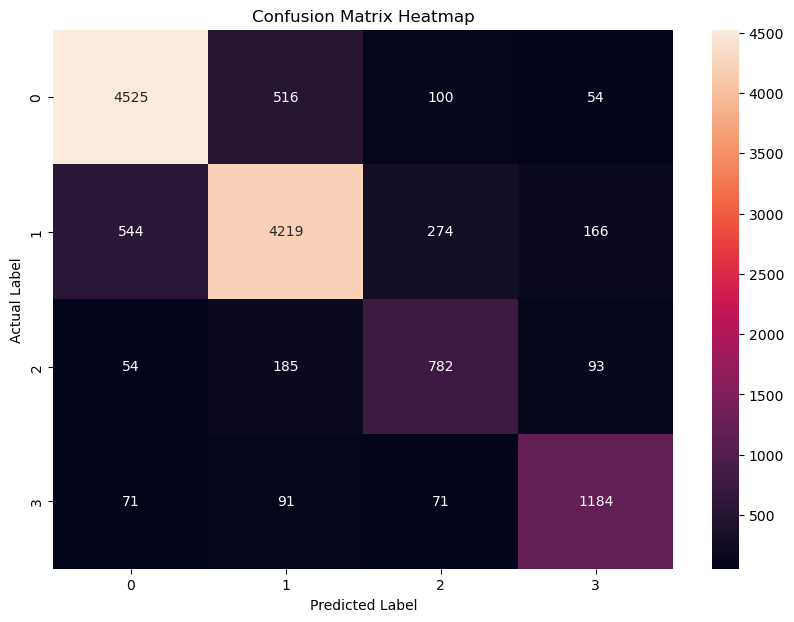

In [33]:
X_train_smote = X_train_smote[['Depth(m)', 'gamma_ray(μR/h)', 'appareent_resistance(ohmm)', 'spontaneous__potential(mV)', 'gamma_rate_of_change', 'gamma_squared']]
# Train the RandomForestClassifier with best parameters
rf_best_2 = RandomForestClassifier(**best_params, random_state=42)
rf_best_2.fit(X_train_smote, y_train_smote)

# Predictions
y_pred = rf_best_2.predict(X_test)

# Classification report
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Heatmap of Confusion Matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='g')
plt.title('Confusion Matrix Heatmap')
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.show()

In [28]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.83


# Feature importance diagram

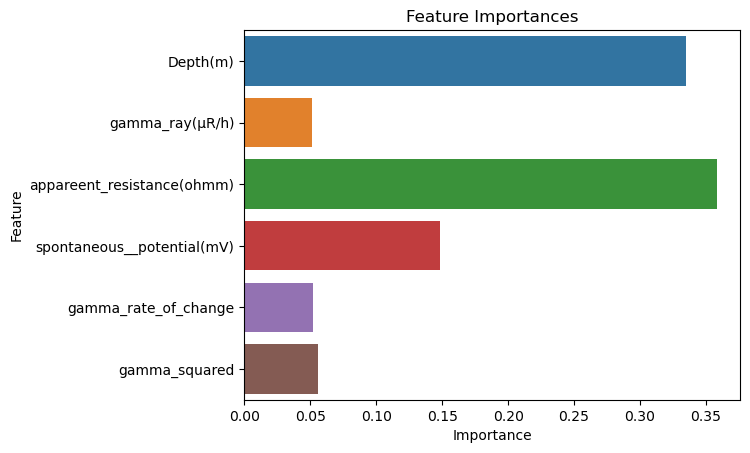

In [34]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


# Feature Importance Visualization
feature_importances = rf_best_2.feature_importances_
sns.barplot(x=feature_importances, y=X_train.columns)
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


# visualizing 1 decision tree (depth = 3)

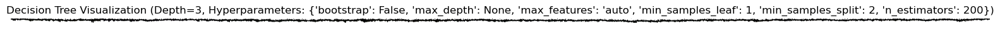

In [54]:
from sklearn.tree import export_graphviz
import matplotlib.pyplot as plt
import os

# Selecting one tree from the random forest model
chosen_tree = rf_best_2.estimators_[0]


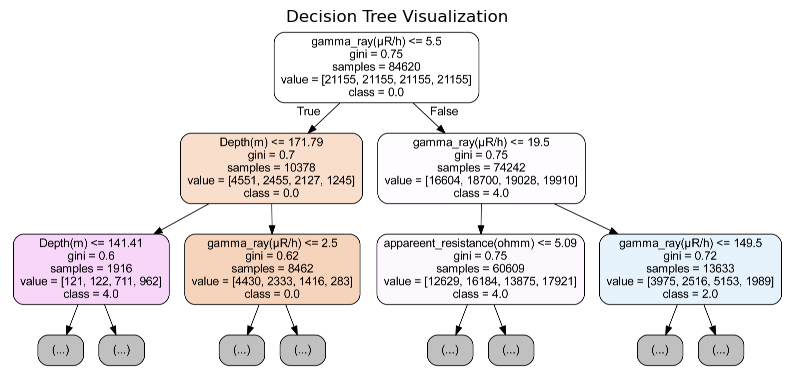

In [70]:
# Exporting the tree to a dot file with limited depth
export_graphviz(chosen_tree, out_file='tree.dot', 
                feature_names=['Depth(m)', 'gamma_ray(μR/h)', 'appareent_resistance(ohmm)', 
                               'spontaneous__potential(mV)', 'gamma_rate_of_change', 'gamma_squared'],
                class_names=y_train_smote.astype(str).unique(),
                rounded=True, proportion=False, 
                precision=2, filled=True, max_depth=2)

# Convert the dot file to a png file
os.system('dot -Tpng tree.dot -o tree.png -Gdpi=1500')

# Displaying the tree
img = plt.imread('tree.png')
plt.figure(figsize=(10, 10))  # Adjust size as needed
plt.imshow(img)
plt.axis('off')  # Turn off the axis
plt.title(f'Decision Tree Visualization')
plt.show()

In [29]:
updated_data_1.isnull().sum()

well                              0
Depth(m)                          0
gamma_ray(μR/h)                   0
appareent_resistance(ohmm)        0
spontaneous__potential(mV)        0
Ra_concentr(%)                    0
core_lithology                58071
perm_class                        0
productive_horizon            58071
gamma_rate_of_change              2
gamma_squared                     0
dtype: int64

# using trained model rf_best_2 for prediction lithology values and insert predicted values into new column predicted_core_lithology

In [220]:
# Define features for prediction
features_for_prediction = ['Depth(m)', 'gamma_ray(μR/h)', 'appareent_resistance(ohmm)', 
                           'spontaneous__potential(mV)', 'gamma_rate_of_change', 'gamma_squared']
updated_data_1 = updated_data_1.dropna(subset=features_for_prediction)

# Use the trained model to predict core_lithology for the entire dataset
predicted_lithology = rf_best_2.predict(updated_data_1[features_for_prediction])

# Create a new column 'predicted_core_lithology' in the original dataframe
# and assign the predicted values
updated_data_1['predicted_core_lithology'] = predicted_lithology

C:\Users\user\AppData\Local\Temp\ipykernel_5368\3709729331.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  updated_data_1['predicted_core_lithology'] = predicted_lithology


In [221]:
updated_data_1

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared,predicted_core_lithology
1,7699,120.1,6,3.53,4.8,0.0,4.0,10,0,0.0,36,4.0
2,7699,120.2,6,3.50,4.9,0.0,4.0,10,0,0.0,36,4.0
3,7699,120.3,7,3.46,5.1,0.0,4.0,10,0,10.0,49,4.0
4,7699,120.4,7,3.43,5.4,0.0,4.0,10,0,0.0,49,4.0
5,7699,120.5,7,3.39,5.6,0.0,4.0,10,0,0.0,49,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...
123192,11896,383.4,9,3.83,1.2,0.0,NaN,10,NaN,0.0,81,4.0
123193,11896,383.5,9,3.86,1.2,0.0,NaN,10,NaN,0.0,81,4.0
123194,11896,383.6,5,3.89,1.2,0.0,NaN,10,NaN,-40.0,25,4.0
123195,11896,383.7,5,3.92,1.3,0.0,NaN,10,NaN,0.0,25,2.0


In [222]:
updated_data_1['core_lithology'].fillna(999, inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_5368\2225504823.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  updated_data_1['core_lithology'].fillna(999, inplace=True)


In [236]:
updated_data_1

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared,predicted_core_lithology
1,7699,120.1,6,3.53,4.8,0.0,4.0,10,0,0.0,36,4.0
2,7699,120.2,6,3.50,4.9,0.0,4.0,10,0,0.0,36,4.0
3,7699,120.3,7,3.46,5.1,0.0,4.0,10,0,10.0,49,4.0
4,7699,120.4,7,3.43,5.4,0.0,4.0,10,0,0.0,49,4.0
5,7699,120.5,7,3.39,5.6,0.0,4.0,10,0,0.0,49,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...
123192,11896,383.4,9,3.83,1.2,0.0,999.0,10,NaN,0.0,81,4.0
123193,11896,383.5,9,3.86,1.2,0.0,999.0,10,NaN,0.0,81,4.0
123194,11896,383.6,5,3.89,1.2,0.0,999.0,10,NaN,-40.0,25,4.0
123195,11896,383.7,5,3.92,1.3,0.0,999.0,10,NaN,0.0,25,2.0


In [237]:
updated_data_1['core_lithology'].value_counts()

999.0    58071
0.0      26350
1.0      25804
4.0       7243
2.0       5243
3.0        432
5.0         50
6.0          2
Name: core_lithology, dtype: int64

In [238]:
updated_data_1.isnull().sum()

well                              0
Depth(m)                          0
gamma_ray(μR/h)                   0
appareent_resistance(ohmm)        0
spontaneous__potential(mV)        0
Ra_concentr(%)                    0
core_lithology                    0
perm_class                        0
productive_horizon            58071
gamma_rate_of_change              0
gamma_squared                     0
predicted_core_lithology          0
dtype: int64

# 09.12.2023 make visualization for well 7699

In [239]:
well_7699 = updated_data_1[updated_data_1['well'] == 7699]
well_7699= well_7699.sort_values('Depth(m)', ascending=True)

In [240]:
well_7699

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared,predicted_core_lithology
1,7699,120.1,6,3.53,4.8,0.0,4.0,10,0,0.0,36,4.0
2,7699,120.2,6,3.50,4.9,0.0,4.0,10,0,0.0,36,4.0
3,7699,120.3,7,3.46,5.1,0.0,4.0,10,0,10.0,49,4.0
4,7699,120.4,7,3.43,5.4,0.0,4.0,10,0,0.0,49,4.0
5,7699,120.5,7,3.39,5.6,0.0,4.0,10,0,0.0,49,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2622,7699,382.2,8,4.77,0.3,0.0,999.0,10,NaN,0.0,64,4.0
2623,7699,382.3,8,4.77,0.3,0.0,999.0,10,NaN,0.0,64,4.0
2624,7699,382.4,8,4.77,0.3,0.0,999.0,10,NaN,0.0,64,4.0
2625,7699,382.5,8,4.77,0.3,0.0,999.0,10,NaN,0.0,64,4.0


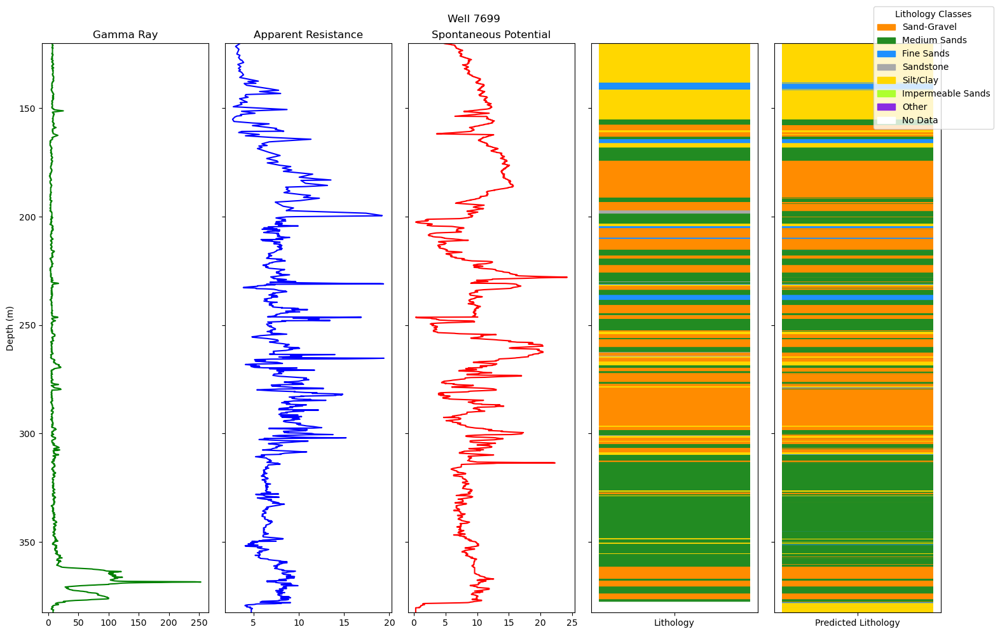

In [241]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
import pandas as pd

# Define the colormap for lithology classes including 'No Data'
# Note: Additional colors may be needed if there are more classes
colors = ['#FF8C00', '#228B22', '#1E90FF', '#A9A9A9', '#FFD700', '#ADFF2F', '#8A2BE2', '#FFFFFF']  # Colors for each lithology class + white for 'No Data'
cmap = mcolors.ListedColormap(colors)
bounds = [0, 1, 2, 3, 4, 5, 6, 7]  # Bounds for lithology classes (0, 1, 2, 3, 4, 5, 6) + 'No Data'
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Define lithology labels including 'No Data'
lithology_labels = ['Sand-Gravel', 'Medium Sands', 'Fine Sands', 'Sandstone', 'Silt/Clay', 'Impermeable Sands', 'Other', 'No Data']

# Create subplots
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(15, 10), sharey=True)


# Plot features against depth
axs[0].plot(well_7699['gamma_ray(μR/h)'], well_7699['Depth(m)'], 'g', label='Gamma Ray')
axs[1].plot(well_7699['appareent_resistance(ohmm)'], well_7699['Depth(m)'], 'b', label='Apparent Resistance')
axs[2].plot(well_7699['spontaneous__potential(mV)'], well_7699['Depth(m)'], 'r', label='Spontaneous Potential')

# Set y-axis label and invert y-axis
axs[0].set_ylabel('Depth (m)')
for ax in axs:
    ax.invert_yaxis()
    ax.set_ylim(well_7699['Depth(m)'].max(), well_7699['Depth(m)'].min())

# Replace 999 with 7 (representing 'No Data') for plotting
well_7699['core_lithology_plot'] = well_7699['core_lithology'].replace(999, 7)
well_7699['predicted_core_lithology_plot'] = well_7699['predicted_core_lithology'].replace(999, 7)

# Plot actual and predicted lithology with colors
for d, actual, predicted in zip(well_7699['Depth(m)'], well_7699['core_lithology_plot'], well_7699['predicted_core_lithology_plot']):
    axs[3].hlines(d, xmin=0, xmax=0.5, colors=cmap(norm([actual]))[0], linewidth=4)
    axs[4].hlines(d, xmin=0.5, xmax=1, colors=cmap(norm([predicted]))[0], linewidth=4)

# Set x-axis labels and titles
axs[3].set_xticks([0.25])
axs[3].set_xticklabels(['Lithology'])
axs[4].set_xticks([0.75])
axs[4].set_xticklabels(['Predicted Lithology'])
axs[0].set_title('Gamma Ray')
axs[1].set_title('Apparent Resistance')
axs[2].set_title('Spontaneous Potential')

# Create patches for the legend
lithology_patches = [Patch(color=colors[i], label=lithology_labels[i]) for i in range(len(lithology_labels))]

# Add legend outside the subplots
fig.legend(handles=lithology_patches, loc='upper right', bbox_to_anchor=(1.05, 1), title='Lithology Classes')

# Set global title and adjust layout
fig.suptitle('Well 7699')
plt.tight_layout()
plt.show()


# Cycle for all wells in updated_data_1 dataset

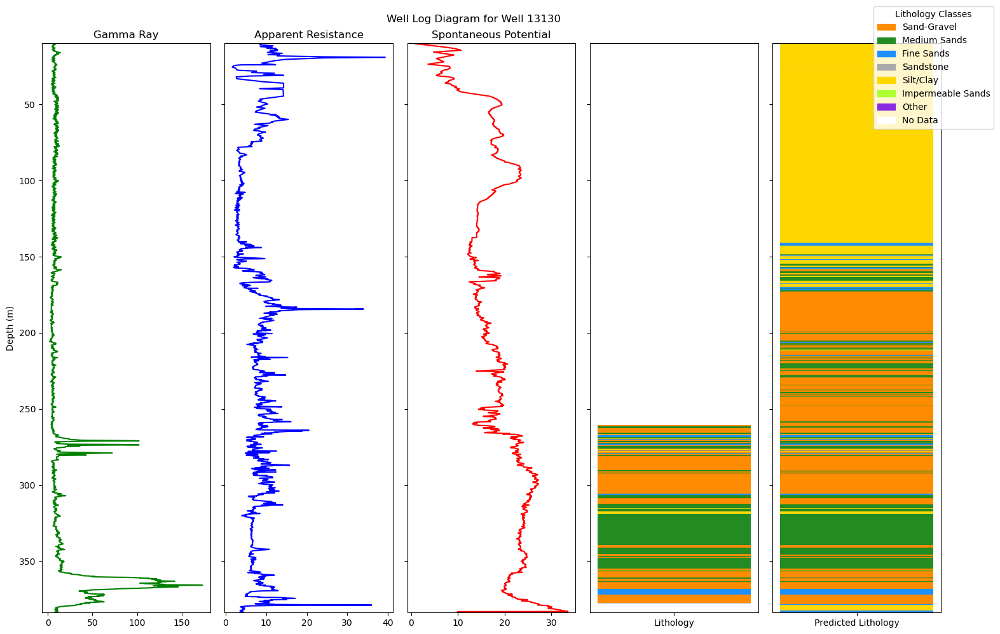

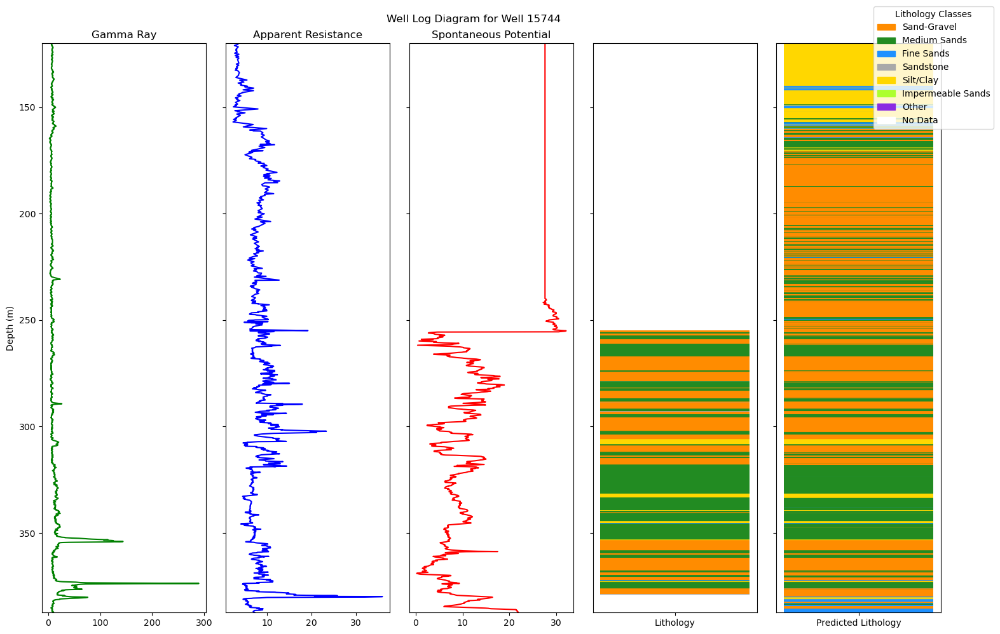

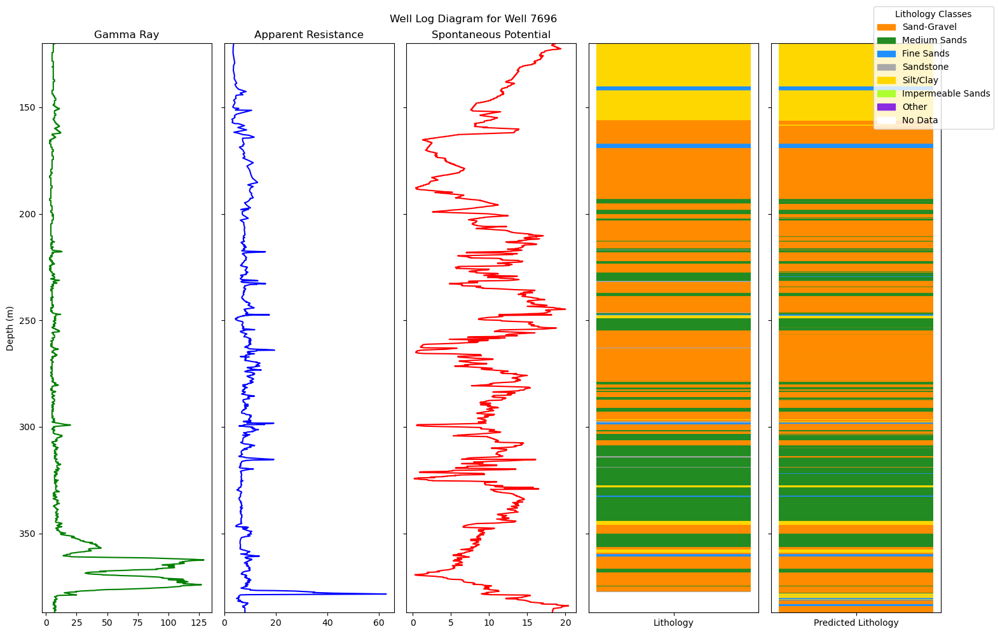

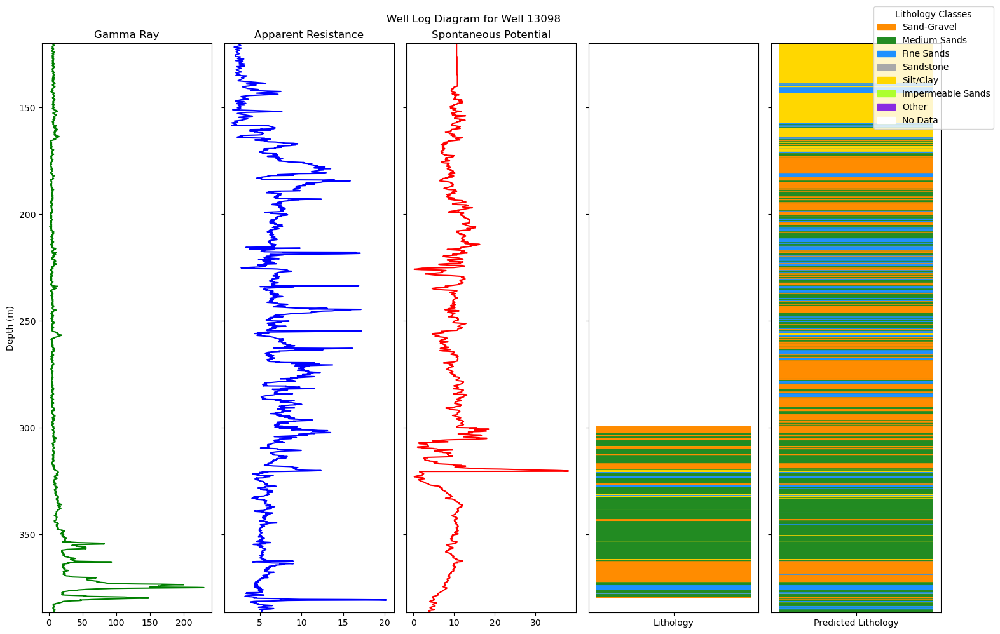

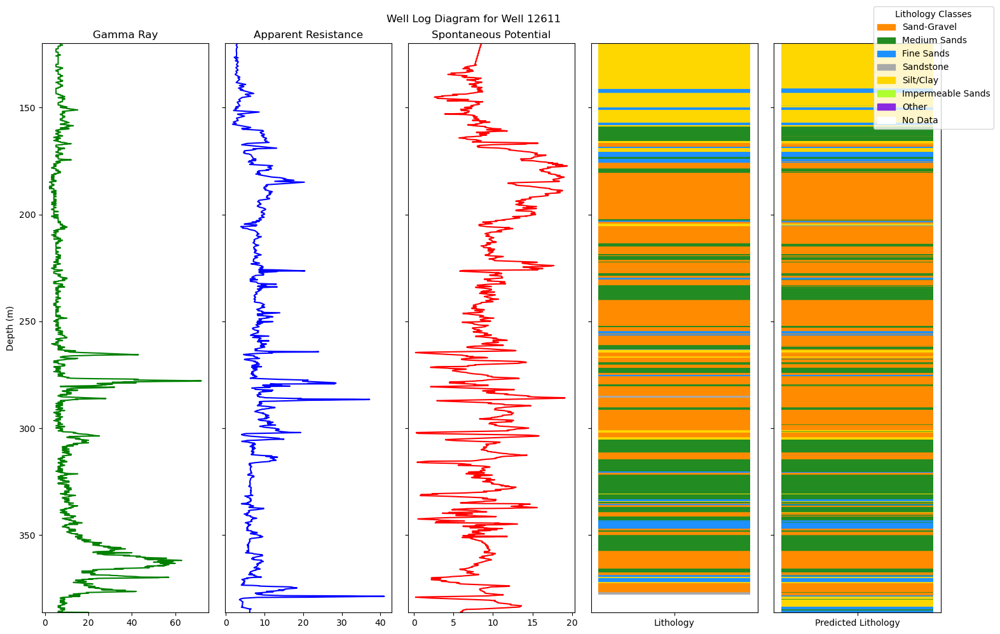

...

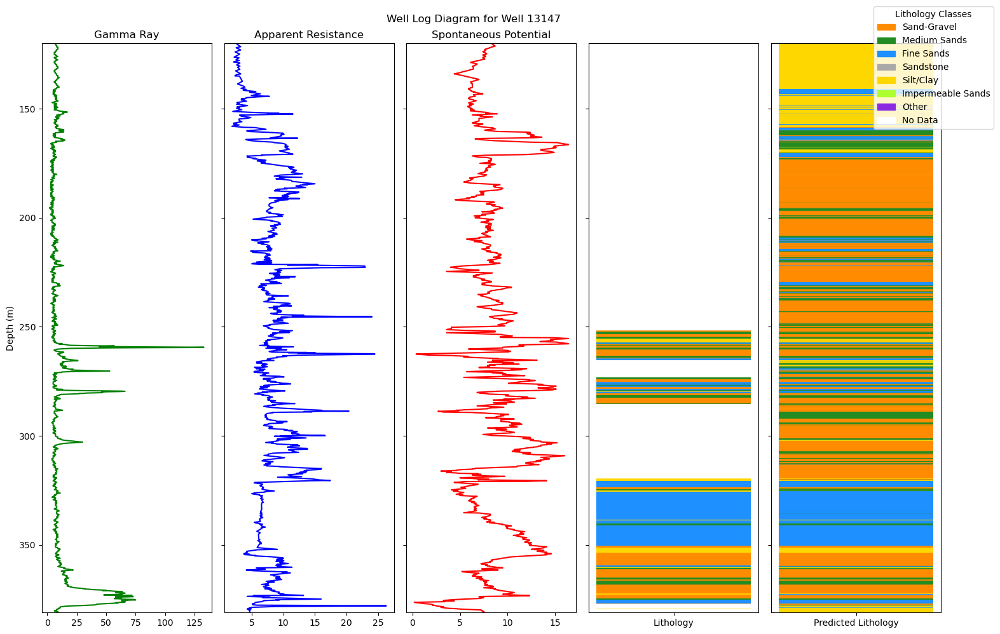

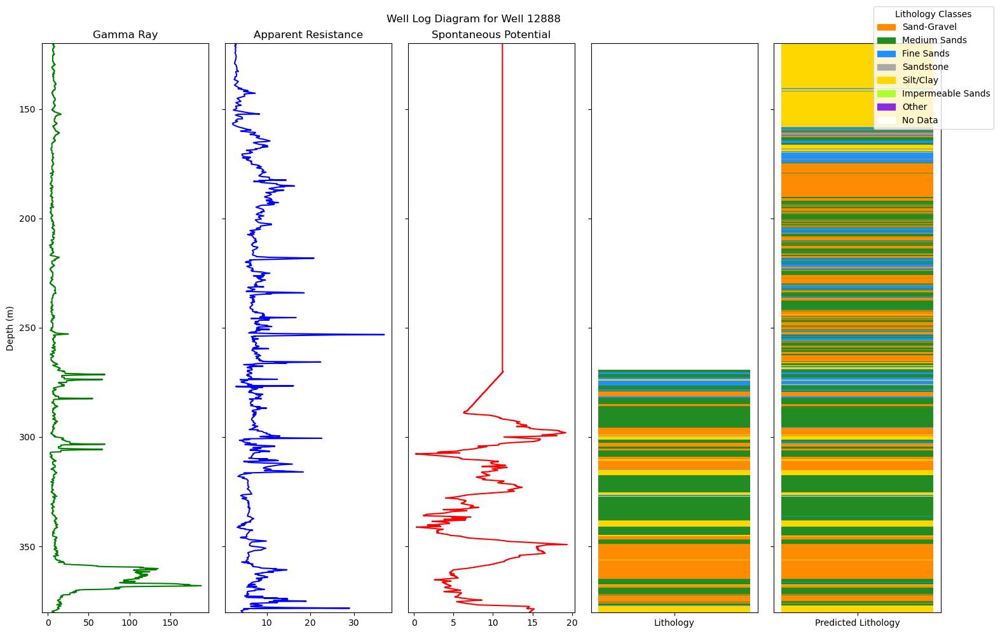

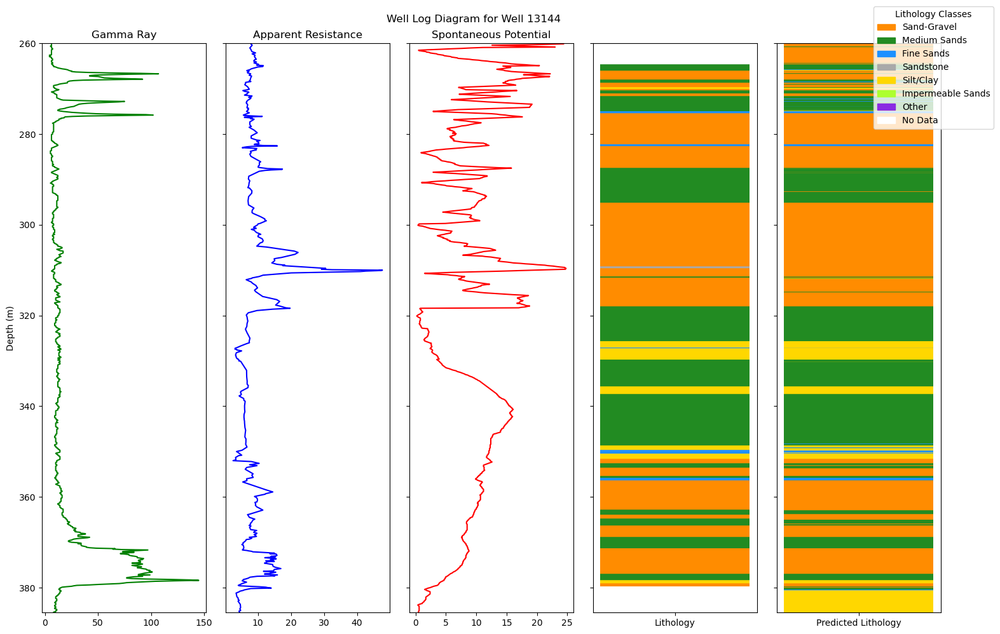

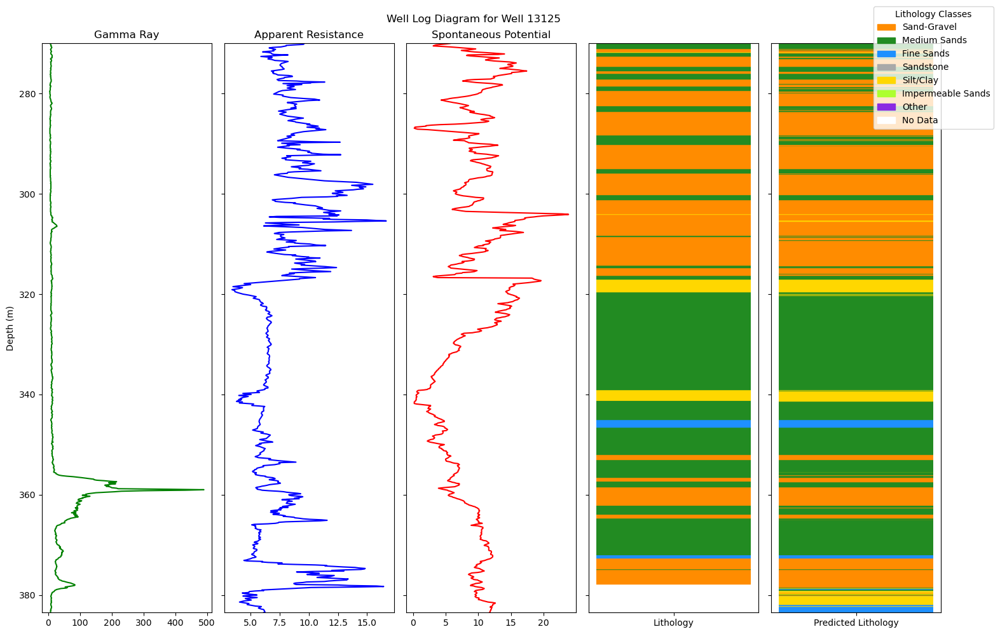

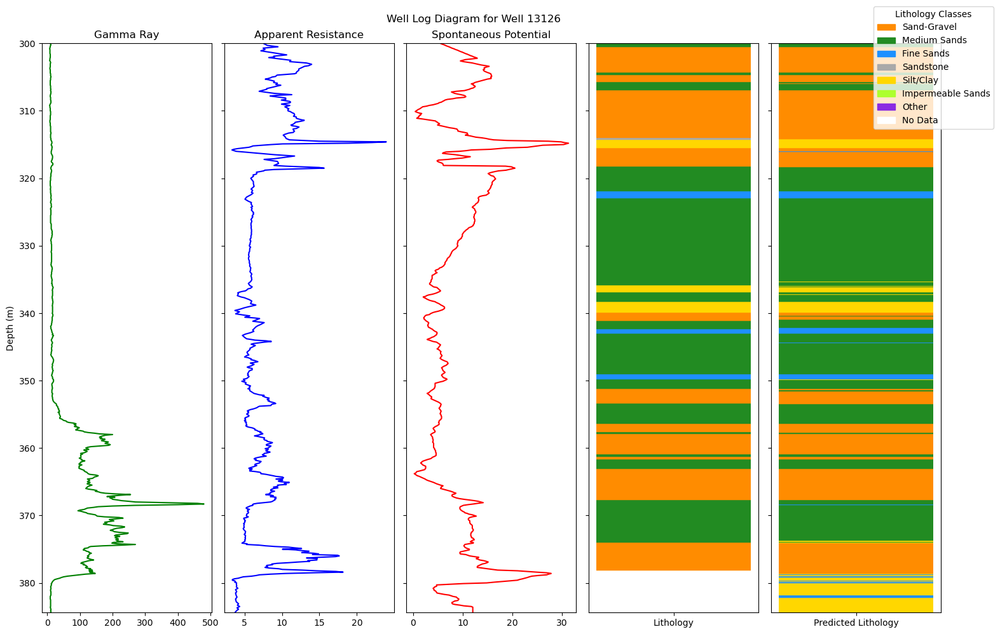

In [242]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
import pandas as pd

# Define the colormap and lithology labels as before
colors = ['#FF8C00', '#228B22', '#1E90FF', '#A9A9A9', '#FFD700', '#ADFF2F', '#8A2BE2', '#FFFFFF']
cmap = mcolors.ListedColormap(colors)
bounds = [0, 1, 2, 3, 4, 5, 6, 7]
norm = mcolors.BoundaryNorm(bounds, cmap.N)
lithology_labels = ['Sand-Gravel', 'Medium Sands', 'Fine Sands', 'Sandstone', 'Silt/Clay', 'Impermeable Sands', 'Other', 'No Data']

# List of well IDs
wells = [13130, 15744, 7696, 13098, 12611, 13148, 13140, 13134, 13207, 13128, 13131, 13155, 13145, 12441, 12442, 13132, 
         13127, 13143, 13135, 13138, 13133, 13136, 13152, 13129, 12444, 13141, 11896, 13154, 12891, 7596, 13156, 12440, 
         12889, 13146, 12890, 7698, 13137, 7699, 13153, 12893, 7694, 12892, 7697, 13147, 12888, 13144, 13125, 13126]

# Loop through each well and create a plot
for well_id in wells:
    well_data = updated_data_1[updated_data_1['well'] == well_id]
    well_data = well_data.sort_values('Depth(m)', ascending=True)

    # Replace 999 with 7 for 'No Data'
    well_data['core_lithology_plot'] = well_data['core_lithology'].replace(999, 7)
    well_data['predicted_core_lithology_plot'] = well_data['predicted_core_lithology'].replace(999, 7)

    # Create subplots
    fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(15, 10), sharey=True)

    # Plot features against depth
    axs[0].plot(well_data['gamma_ray(μR/h)'], well_data['Depth(m)'], 'g')
    axs[1].plot(well_data['appareent_resistance(ohmm)'], well_data['Depth(m)'], 'b')
    axs[2].plot(well_data['spontaneous__potential(mV)'], well_data['Depth(m)'], 'r')

    # Set y-axis label and invert y-axis
    axs[0].set_ylabel('Depth (m)')
    for ax in axs:
        ax.invert_yaxis()
        ax.set_ylim(well_data['Depth(m)'].max(), well_data['Depth(m)'].min())

    # Plot actual and predicted lithology with colors
    for d, actual, predicted in zip(well_data['Depth(m)'], well_data['core_lithology_plot'], well_data['predicted_core_lithology_plot']):
        axs[3].hlines(d, xmin=0, xmax=0.5, colors=cmap(norm([actual]))[0], linewidth=4)
        axs[4].hlines(d, xmin=0.5, xmax=1, colors=cmap(norm([predicted]))[0], linewidth=4)

    # Set x-axis labels and titles
    axs[3].set_xticks([0.25])
    axs[3].set_xticklabels(['Lithology'])
    axs[4].set_xticks([0.75])
    axs[4].set_xticklabels(['Predicted Lithology'])
    axs[0].set_title('Gamma Ray')
    axs[1].set_title('Apparent Resistance')
    axs[2].set_title('Spontaneous Potential')

    # Add legend outside the subplots
    facies_patches = [Patch(color=colors[i], label=lithology_labels[i]) for i in range(len(lithology_labels))]
    fig.legend(handles=facies_patches, loc='upper right', bbox_to_anchor=(1.05, 1), title='Lithology Classes')

    # Set global title and adjust layout
    fig.suptitle(f'Well Log Diagram for Well {well_id}')
    plt.tight_layout()
    plt.show()


# The article I found, "Analysis of deterministic and geostatistical interpolation techniques for mapping meteorological variables at large watershed scales," can be accessed via its DOI link: https://doi.org/10.1007/s11600-018-0226-y.

# Interpolation task

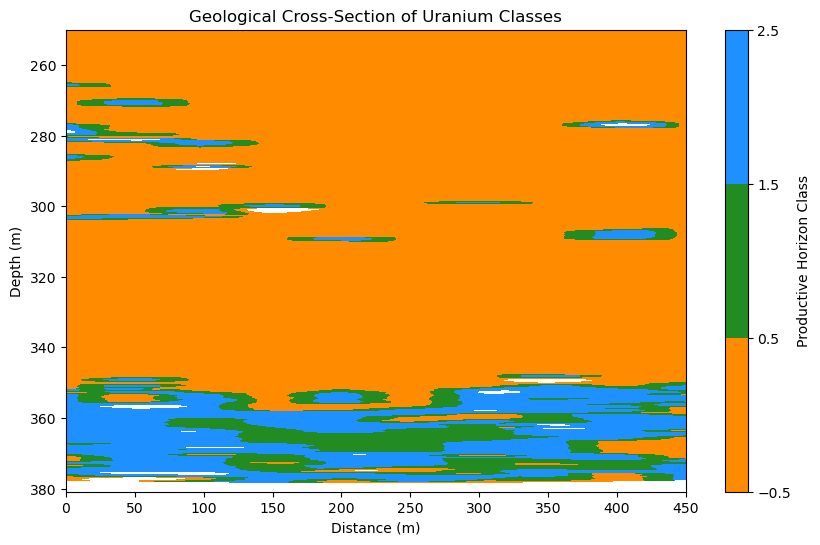

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Assuming merged_df is loaded and contains the necessary data

# Define the well locations and their distance
well_locations = np.array([0, 50, 100, 150, 200, 250, 300, 350, 400, 450])  # 50m apart
mirat_wells = [12611, 12442, 12440, 7596, 12441, 7699, 7696, 7697, 12444, 7694]

# Create a grid to interpolate onto
grid_x, grid_y = np.mgrid[0:450:450j, 250:merged_df_1['Depth(m)'].max():500j]

# Prepare data for interpolation
points = []
values = []

for i, well_id in enumerate(mirat_wells):
    well_data = merged_df_1[merged_df_1['well'] == well_id]
    for depth, classification in zip(well_data['Depth(m)'], well_data['productive_horizon']):
        points.append((well_locations[i], depth))
        values.append(classification)

points = np.array(points)
values = np.array(values)

# Perform the interpolation
grid_z = griddata(points, values, (grid_x, grid_y), method='cubic')

# Plotting
plt.figure(figsize=(10, 6))
plt.contourf(grid_x, grid_y, grid_z, levels=[-0.5, 0.5, 1.5, 2.5], colors=['#FF8C00', '#228B22', '#1E90FF'])
plt.colorbar(label='Productive Horizon Class')
plt.xlabel('Distance (m)')
plt.ylabel('Depth (m)')
plt.title('Geological Cross-Section of Uranium Classes')
plt.gca().invert_yaxis()  # Depth increases downwards
plt.show()


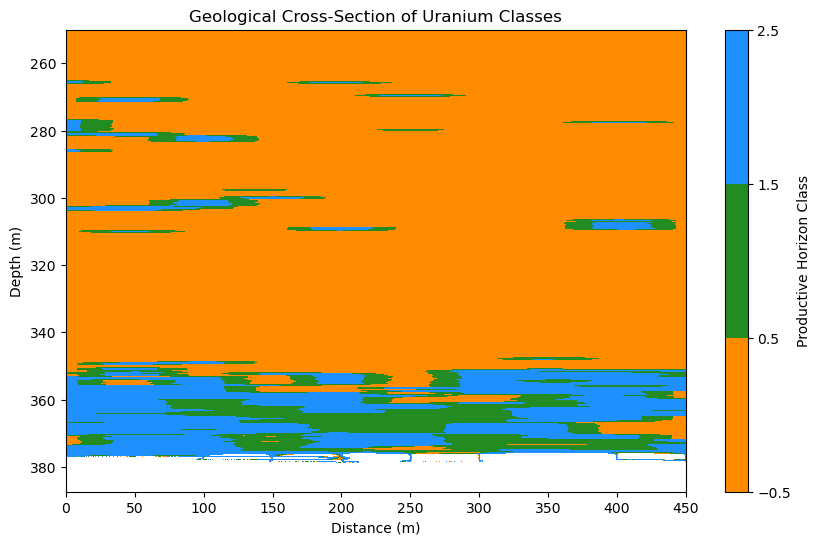

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Assuming merged_df is loaded and contains the necessary data

# Define the well locations and their distance
well_locations = np.array([0, 50, 100, 150, 200, 250, 300, 350, 400, 450])  # 50m apart
mirat_wells = [12611, 12442, 12440, 7596, 12441, 7699, 7696, 7697, 12444, 7694]

# Create a grid to interpolate onto
grid_x, grid_y = np.mgrid[0:450:450j, 250:merged_df_1['Depth(m)'].max():500j]

# Prepare data for interpolation
points = []
values = []

for i, well_id in enumerate(mirat_wells):
    well_data = merged_df_1[merged_df_1['well'] == well_id]
    for depth, classification in zip(well_data['Depth(m)'], well_data['productive_horizon']):
        points.append((well_locations[i], depth))
        values.append(classification)

points = np.array(points)
values = np.array(values)

# Perform the interpolation
grid_z = griddata(points, values, (grid_x, grid_y), method='cubic')

# Plotting
plt.figure(figsize=(10, 6))
plt.contourf(grid_x, grid_y, grid_z, levels=[-0.5, 0.5, 1.5, 2.5], colors=['#FF8C00', '#228B22', '#1E90FF'])
plt.colorbar(label='Productive Horizon Class')
plt.xlabel('Distance (m)')
plt.ylabel('Depth (m)')
plt.title('Geological Cross-Section of Uranium Classes')
plt.gca().invert_yaxis()  # Depth increases downwards
plt.show()

# 09.12.2023

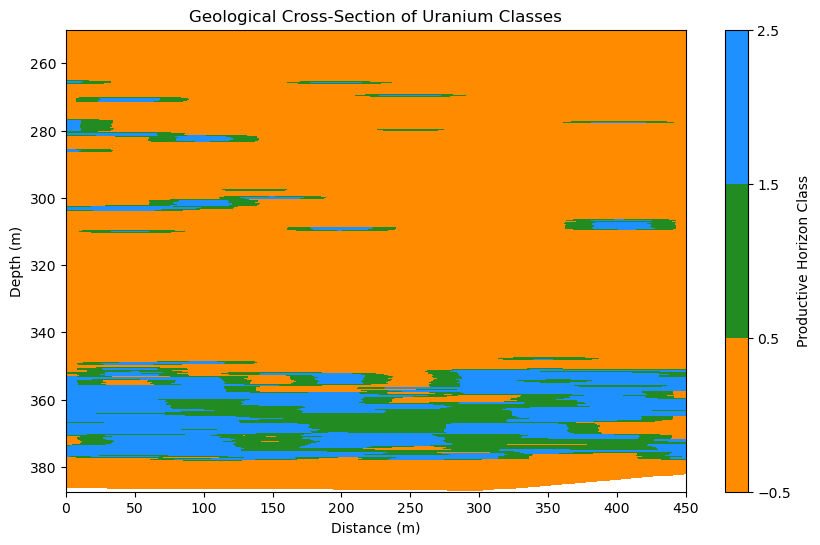

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Assuming merged_df is loaded and contains the necessary data

# Define the well locations and their distance
well_locations = np.array([0, 50, 100, 150, 200, 250, 300, 350, 400, 450])  # 50m apart
mirat_wells = [12611, 12442, 12440, 7596, 12441, 7699, 7696, 7697, 12444, 7694]

# Create a grid to interpolate onto
grid_x, grid_y = np.mgrid[0:450:450j, 250:merged_df_1['Depth(m)'].max():500j]

# Prepare data for interpolation
points = []
values = []

for i, well_id in enumerate(mirat_wells):
    well_data = merged_df_1[merged_df_1['well'] == well_id]
    for depth, classification in zip(well_data['Depth(m)'], well_data['predicted_productive_horizon']):
        points.append((well_locations[i], depth))
        values.append(classification)

points = np.array(points)
values = np.array(values)

# Perform the interpolation
grid_z = griddata(points, values, (grid_x, grid_y), method='cubic')

# Plotting
plt.figure(figsize=(10, 6))
plt.contourf(grid_x, grid_y, grid_z, levels=[-0.5, 0.5, 1.5, 2.5], colors=['#FF8C00', '#228B22', '#1E90FF'])
plt.colorbar(label='Productive Horizon Class')
plt.xlabel('Distance (m)')
plt.ylabel('Depth (m)')
plt.title('Geological Cross-Section of Uranium Classes')
plt.gca().invert_yaxis()  # Depth increases downwards
plt.show()


# 09.12.2023

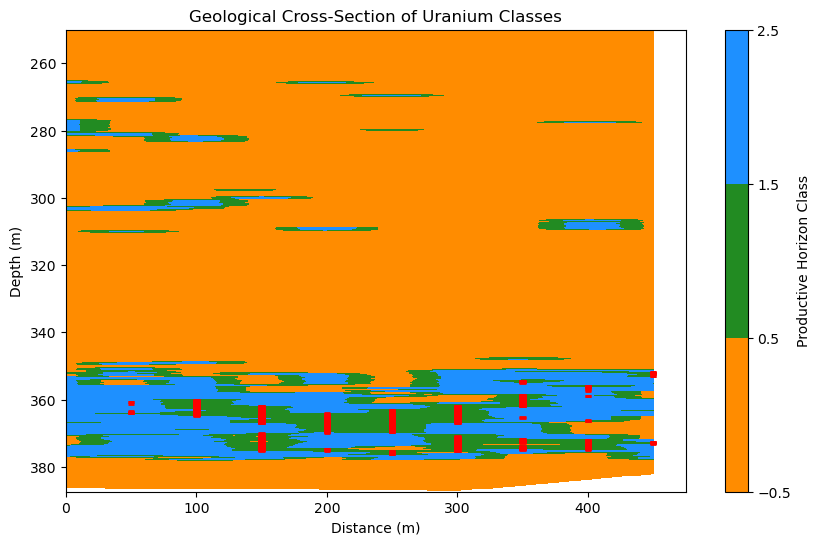

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Assuming merged_df is loaded and contains the necessary data

# Define the well locations and their distance
well_locations = np.array([0, 50, 100, 150, 200, 250, 300, 350, 400, 450])  # 50m apart
mirat_wells = [12611, 12442, 12440, 7596, 12441, 7699, 7696, 7697, 12444, 7694]

# Create a grid to interpolate onto
grid_x, grid_y = np.mgrid[0:450:450j, 250:merged_df_1['Depth(m)'].max():500j]

# Prepare data for interpolation
points = []
values = []

for i, well_id in enumerate(mirat_wells):
    well_data = merged_df_1[merged_df_1['well'] == well_id]
    for depth, classification in zip(well_data['Depth(m)'], well_data['predicted_productive_horizon']):
        points.append((well_locations[i], depth))
        values.append(classification)

points = np.array(points)
values = np.array(values)

# Perform the interpolation
grid_z = griddata(points, values, (grid_x, grid_y), method='cubic')

# Plotting
plt.figure(figsize=(10, 6))
plt.contourf(grid_x, grid_y, grid_z, levels=[-0.5, 0.5, 1.5, 2.5], colors=['#FF8C00', '#228B22', '#1E90FF'])
plt.colorbar(label='Productive Horizon Class')
plt.xlabel('Distance (m)')
plt.ylabel('Depth (m)')
plt.title('Geological Cross-Section of Uranium Classes')

# Adding intervals of productive horizons along the wells
for i, well_id in enumerate(mirat_wells):
    well_data = merged_df_1[merged_df_1['well'] == well_id]
    productive_horizons = well_data[well_data['productive_horizon'] == 1]
    for _, row in productive_horizons.iterrows():
        plt.hlines(row['Depth(m)'], well_locations[i] - 2.5, well_locations[i] + 2.5, colors='red', linewidth=2)

plt.gca().invert_yaxis()  # Depth increases downwards
plt.show()


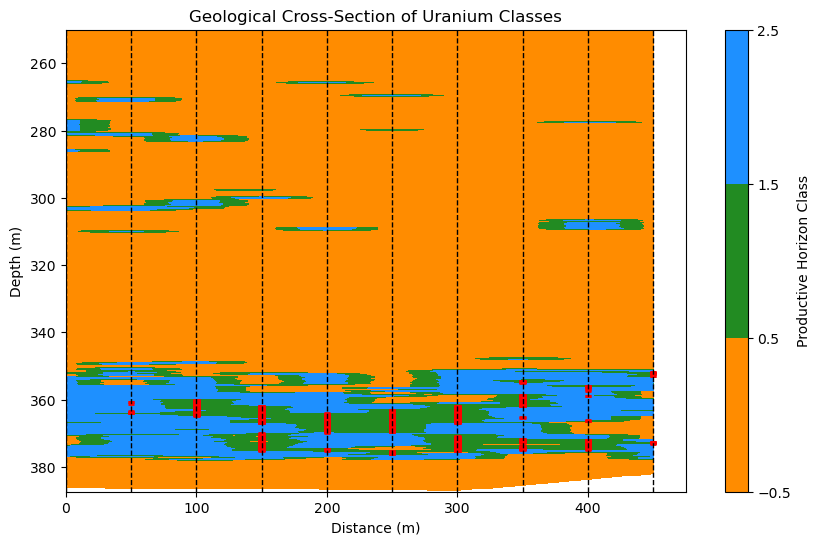

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
import pandas as pd

# Load the data
#file_path = '/path/to/your/datafile.xlsx'  # Update with the correct path
#merged_df = pd.read_excel(file_path)

# Define the well locations and their distance
well_locations = np.array([0, 50, 100, 150, 200, 250, 300, 350, 400, 450])  # 50m apart
mirat_wells = [12611, 12442, 12440, 7596, 12441, 7699, 7696, 7697, 12444, 7694]

# Create a grid to interpolate onto
grid_x, grid_y = np.mgrid[0:450:450j, 250:merged_df_1['Depth(m)'].max():500j]

# Prepare data for interpolation
points = []
values = []

for i, well_id in enumerate(mirat_wells):
    well_data = merged_df_1[merged_df_1['well'] == well_id]
    for depth, classification in zip(well_data['Depth(m)'], well_data['predicted_productive_horizon']):
        points.append((well_locations[i], depth))
        values.append(classification)

points = np.array(points)
values = np.array(values)

# Perform the interpolation
grid_z = griddata(points, values, (grid_x, grid_y), method='cubic')

# Plotting
plt.figure(figsize=(10, 6))
plt.contourf(grid_x, grid_y, grid_z, levels=[-0.5, 0.5, 1.5, 2.5], colors=['#FF8C00', '#228B22', '#1E90FF'])
plt.colorbar(label='Productive Horizon Class')
plt.xlabel('Distance (m)')
plt.ylabel('Depth (m)')
plt.title('Geological Cross-Section of Uranium Classes')

# Adding intervals of productive horizons along the wells
for i, well_id in enumerate(mirat_wells):
    well_data = merged_df_1[merged_df_1['well'] == well_id]
    productive_horizons = well_data[well_data['productive_horizon'] == 1]
    for _, row in productive_horizons.iterrows():
        plt.hlines(row['Depth(m)'], well_locations[i] - 2.5, well_locations[i] + 2.5, colors='red', linewidth=2)

    # Adding well locations as dotted lines
    plt.axvline(x=well_locations[i], color='black', linestyle='--', linewidth=1)

plt.gca().invert_yaxis()  # Depth increases downwards
plt.show()


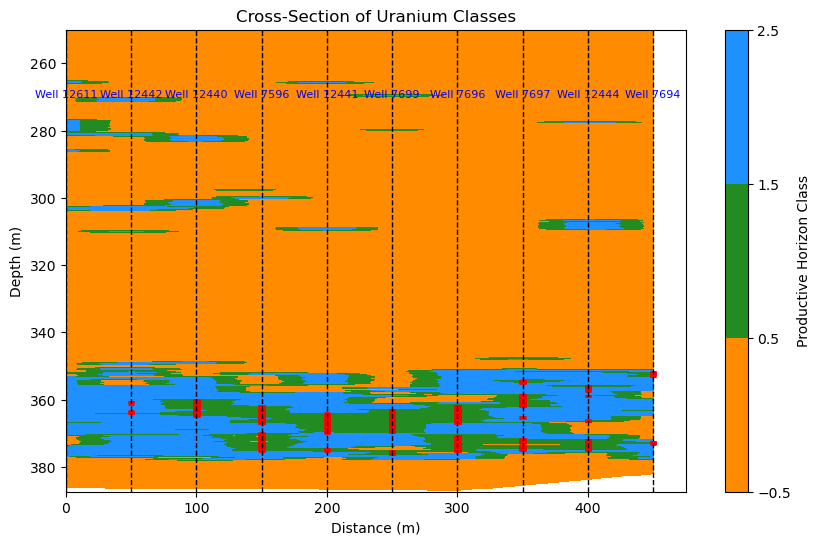

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
import pandas as pd

# Load the data
#file_path = '/path/to/your/datafile.xlsx'  # Update with the correct path
#merged_df = pd.read_excel(file_path)

# Define the well locations and their distance
well_locations = np.array([0, 50, 100, 150, 200, 250, 300, 350, 400, 450])  # 50m apart
mirat_wells = [12611, 12442, 12440, 7596, 12441, 7699, 7696, 7697, 12444, 7694]

# Create a grid to interpolate onto
grid_x, grid_y = np.mgrid[0:450:450j, 250:merged_df_1['Depth(m)'].max():500j]

# Prepare data for interpolation
points = []
values = []

for i, well_id in enumerate(mirat_wells):
    well_data = merged_df_1[merged_df_1['well'] == well_id]
    for depth, classification in zip(well_data['Depth(m)'], well_data['predicted_productive_horizon']):
        points.append((well_locations[i], depth))
        values.append(classification)

points = np.array(points)
values = np.array(values)

# Perform the interpolation
grid_z = griddata(points, values, (grid_x, grid_y), method='cubic')

# Plotting
plt.figure(figsize=(10, 6))
plt.contourf(grid_x, grid_y, grid_z, levels=[-0.5, 0.5, 1.5, 2.5], colors=['#FF8C00', '#228B22', '#1E90FF'])
plt.colorbar(label='Productive Horizon Class')
plt.xlabel('Distance (m)')
plt.ylabel('Depth (m)')
plt.title('Cross-Section of Uranium Classes')

# Adding intervals of productive horizons along the wells
for i, well_id in enumerate(mirat_wells):
    well_data = merged_df_1[merged_df_1['well'] == well_id]
    productive_horizons = well_data[well_data['predicted_productive_horizon'] == 1]
    for _, row in productive_horizons.iterrows():
        plt.hlines(row['Depth(m)'], well_locations[i] - 2.5, well_locations[i] + 2.5, colors='red', linewidth=2)

    # Adding well locations as dotted lines
    plt.axvline(x=well_locations[i], color='black', linestyle='--', linewidth=1)
    # Adding well names
    plt.text(well_locations[i], grid_y.min() + 20, f"Well {well_id}", horizontalalignment='center', fontsize=8, color='blue')

plt.gca().invert_yaxis()  # Depth increases downwards
plt.show()


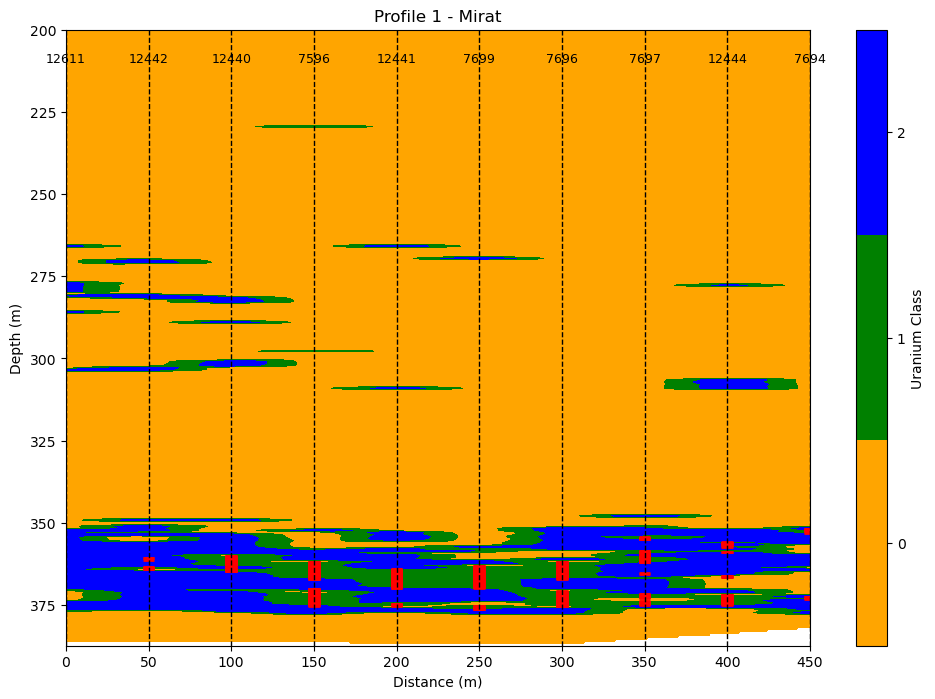

<Figure size 640x480 with 0 Axes>

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Assuming merged_df_1 is loaded and contains the necessary data

# Define the well locations and their distance
mirat_wells = [12611, 12442, 12440, 7596, 12441, 7699, 7696, 7697, 12444, 7694]
well_locations = np.linspace(0, 50 * (len(mirat_wells) - 1), len(mirat_wells))  # 50m apart


# Filter the data for depths of 200m and deeper
merged_df_filtered = merged_df_1[merged_df_1['Depth(m)'] >= 200]

# Create a grid to interpolate onto
max_depth = merged_df_filtered['Depth(m)'].max()
grid_x, grid_y = np.mgrid[0:450:450j, 200:max_depth:300j]

# Prepare data for interpolation
points = []
values = []

for i, well_id in enumerate(mirat_wells):
    well_data = merged_df_filtered[merged_df_filtered['well'] == well_id]
    for depth, classification in zip(well_data['Depth(m)'], well_data['predicted_productive_horizon']):
        points.append((well_locations[i], depth))
        values.append(classification)

points = np.array(points)
values = np.array(values)

# Perform the interpolation
grid_z = griddata(points, values, (grid_x, grid_y), method='cubic')

# Plotting
plt.figure(figsize=(12, 8))
contour = plt.contourf(grid_x, grid_y, grid_z, levels=[-0.5, 0.5, 1.5, 2.5], colors=['#FFA500', '#008000', '#0000FF'])
plt.colorbar(contour, label='Uranium Class', ticks=[0, 1, 2])
plt.clim(-0.5, 2.5)
plt.xlabel('Distance (m)')
plt.ylabel('Depth (m)')
plt.title('Profile 1 - Mirat')
plt.gca().invert_yaxis()

# Set the x-limits to match the range of your well locations
plt.xlim(0, well_locations[-1])

# Adding intervals of productive horizons along the wells
for i, well_id in enumerate(mirat_wells):
    well_data = merged_df_1[merged_df_1['well'] == well_id]
    productive_horizons = well_data[well_data['predicted_productive_horizon'] == 1]
    for _, row in productive_horizons.iterrows():
        plt.hlines(row['Depth(m)'], well_locations[i] - 3.5, well_locations[i] + 3.5, colors='red', linewidth=2)

    # Adding well locations as dotted lines
    plt.axvline(x=well_locations[i], color='black', linestyle='--', linewidth=1)
    # Adding well names
    plt.text(well_locations[i], grid_y.min() + 10, f"{well_id}", horizontalalignment='center', fontsize=9, color='black')

plt.show()



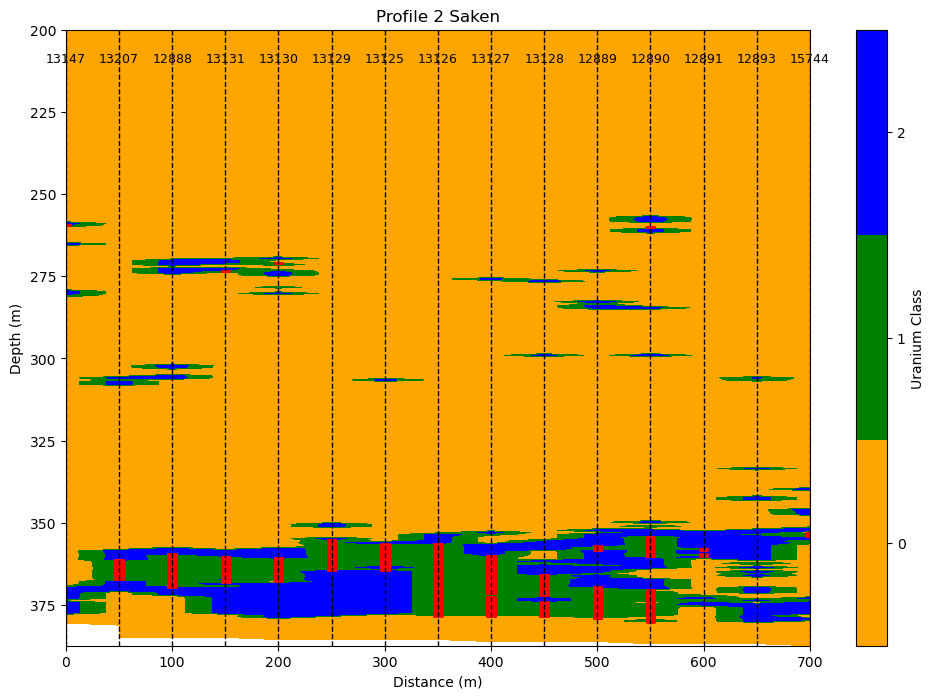

<Figure size 640x480 with 0 Axes>

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Define the new well locations for saken_wells
saken_wells = [13147, 13207, 12888, 13131, 13130, 13129, 13125, 13126, 13127, 13128, 12889, 12890, 12891, 12893, 15744]
well_locations = np.arange(0, 50 * len(saken_wells), 50)  # Generate locations at 50m intervals


# Assuming merged_df_1 is a DataFrame containing the necessary data

# Filter the data for depths of 200m and deeper
merged_df_filtered = merged_df_1[merged_df_1['Depth(m)'] >= 200]

# Create a grid to interpolate onto, ensuring it covers the range from the first to the last well
grid_x, grid_y = np.mgrid[well_locations[0]:well_locations[-1]:complex(0,len(saken_wells)), 200:max_depth:300j]

# Prepare data for interpolation
points = []
values = []

for i, well_id in enumerate(saken_wells):
    well_data = merged_df_filtered[merged_df_filtered['well'] == well_id]
    for depth, classification in zip(well_data['Depth(m)'], well_data['predicted_productive_horizon']):
        points.append((well_locations[i], depth))
        values.append(classification)

points = np.array(points)
values = np.array(values)

# Perform the interpolation
grid_z = griddata(points, values, (grid_x, grid_y), method='cubic')

# Plotting
plt.figure(figsize=(12, 8))
contour = plt.contourf(grid_x, grid_y, grid_z, levels=[-0.5, 0.5, 1.5, 2.5], colors=['#FFA500', '#008000', '#0000FF'])
plt.colorbar(contour, label='Uranium Class', ticks=[0, 1, 2])
plt.clim(-0.5, 2.5)
plt.xlabel('Distance (m)')
plt.ylabel('Depth (m)')
plt.title('Profile 2 Saken')  # Updated title for the new profile
plt.gca().invert_yaxis()

# Set the x-limits to match the range of your well locations
plt.xlim(well_locations[0], well_locations[-1])

# Adding intervals of productive horizons along the wells
for i, well_id in enumerate(saken_wells):
    well_data = merged_df_1[merged_df_1['well'] == well_id]
    productive_horizons = well_data[well_data['predicted_productive_horizon'] == 1]
    for _, row in productive_horizons.iterrows():
        plt.hlines(row['Depth(m)'], well_locations[i] - 4.5, well_locations[i] + 4.5, colors='red', linewidth=2)

    # Adding well locations as dotted lines
    plt.axvline(x=well_locations[i], color='black', linestyle='--', linewidth=1)
    # Adding well names
    plt.text(well_locations[i], grid_y.min() + 10, f"{well_id}", horizontalalignment='center', fontsize=9, color='black')

plt.show()
plt.savefig('cross_section_saken.png', format='png', dpi=800)

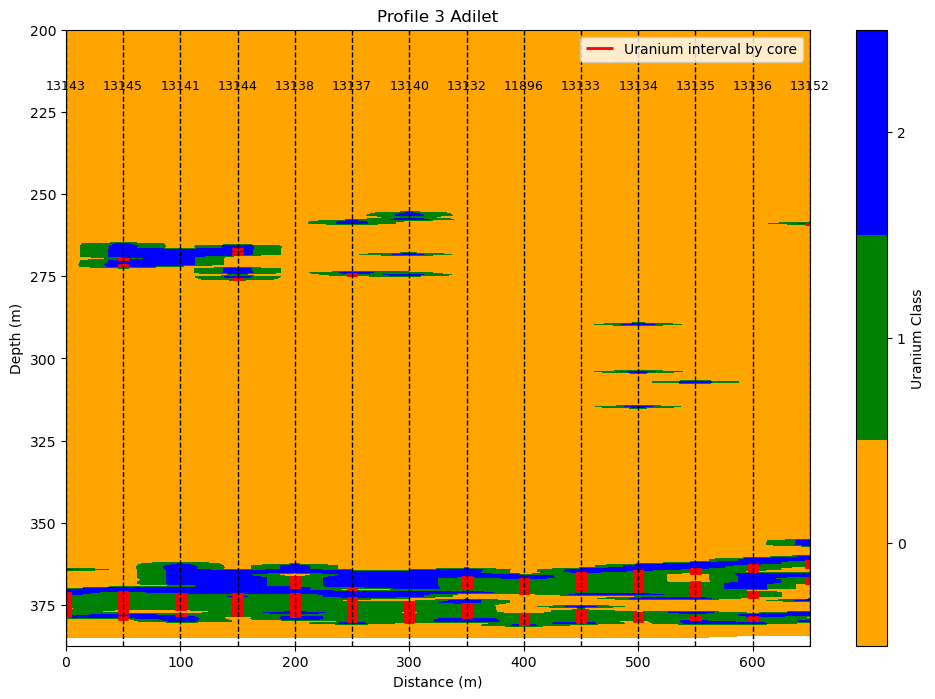

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Define the well locations and their distance for the third profile
adilet_wells = [13143, 13145, 13141, 13144, 13138, 13137, 13140, 13132, 11896, 13133, 13134, 13135, 13136, 13152]
well_locations = np.linspace(0, 50 * (len(adilet_wells) - 1), len(adilet_wells))  # 50m apart


# Filter the data for depths of 200m and deeper for the third profile
merged_df_filtered = merged_df_1[merged_df_1['Depth(m)'] >= 200]

# Create a grid to interpolate onto for the third profile
max_depth = merged_df_filtered['Depth(m)'].max()
grid_x, grid_y = np.mgrid[0:well_locations[-1]:complex(0, len(adilet_wells)), 200:max_depth:300j]

# Prepare data for interpolation for the third profile
points = []
values = []

for i, well_id in enumerate(adilet_wells):
    well_data = merged_df_filtered[merged_df_filtered['well'] == well_id]
    for depth, classification in zip(well_data['Depth(m)'], well_data['predicted_productive_horizon']):
        points.append((well_locations[i], depth))
        values.append(classification)

points = np.array(points)
values = np.array(values)

# Perform the interpolation for the third profile
grid_z = griddata(points, values, (grid_x, grid_y), method='cubic')

# Plotting for the third profile
plt.figure(figsize=(12, 8))
contour = plt.contourf(grid_x, grid_y, grid_z, levels=[-0.5, 0.5, 1.5, 2.5], colors=['#FFA500', '#008000', '#0000FF'])
plt.colorbar(contour, label='Uranium Class', ticks=[0, 1, 2])
plt.clim(-0.5, 2.5)
plt.xlabel('Distance (m)')
plt.ylabel('Depth (m)')
plt.title('Profile 3 Adilet')
plt.gca().invert_yaxis()

# Set the x-limits to match the range of your well locations for the third profile
plt.xlim(well_locations[0], well_locations[-1])

# Adding intervals of productive horizons along the wells for the third profile
for i, well_id in enumerate(adilet_wells):
    well_data = merged_df_1[merged_df_1['well'] == well_id]
    productive_horizons = well_data[well_data['predicted_productive_horizon'] == 1]
    for _, row in productive_horizons.iterrows():
        plt.hlines(row['Depth(m)'], well_locations[i] - 4.5, well_locations[i] + 4.5, colors='red', linewidth=2)

    # Adding well locations as dotted lines for the third profile
    plt.axvline(x=well_locations[i], color='black', linestyle='--', linewidth=1)
    # Adding well names for the third profile
    plt.text(well_locations[i], grid_y.min() + 18, f"{well_id}", horizontalalignment='center', fontsize=9, color='black')

plt.hlines(200, 200, 200, colors='red', linewidth=2, label='Uranium interval by core')
plt.legend(loc='best')
    
plt.show()


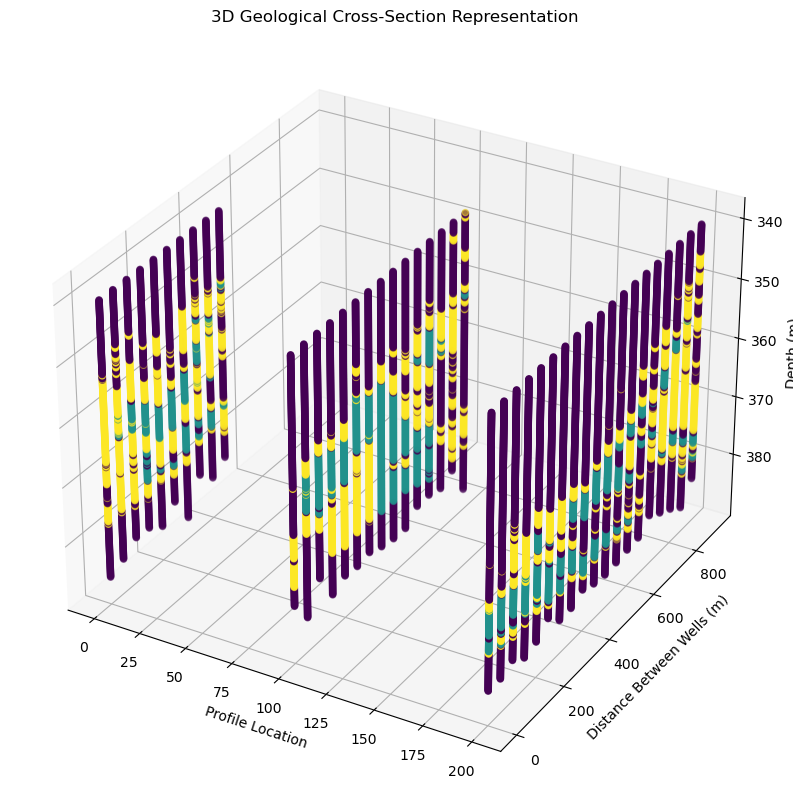

In [39]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from scipy.interpolate import griddata

# Assuming merged_df is loaded and contains the necessary data

# Define the well locations for each profile and their IDs
profiles = {
    'mirat': [12611, 12442, 12440, 7596, 12441, 7699, 7696, 7697, 12444, 7694],
    'saken': [13147, 13207, 12888, 13131, 13130, 13129, 13125, 13126, 13127, 13128, 12889, 12890, 12891, 12893, 15744],
    'adilet': [13143, 13145, 13141, 13144, 13138, 13137, 13140, 13132, 11896, 13133, 13134, 13135, 13136, 13152, 13153, 13154, 13155, 13098, 13156]
}

# Profile locations (x-coordinates)
profile_locations = {'mirat': 0, 'saken': 100, 'adilet': 200}

# Filter the data for depths of 340m and deeper
merged_df_filtered = merged_df_1[merged_df_1['Depth(m)'] >= 340]

# Initialize a 3D plot
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

# Prepare data for interpolation
points = []
values = []

for profile_name, wells in profiles.items():
    for i, well_id in enumerate(wells):
        well_data = merged_df_filtered[merged_df_filtered['well'] == well_id]
        for depth, classification in zip(well_data['Depth(m)'], well_data['predicted_productive_horizon']):
            x = profile_locations[profile_name]
            y = i * 50  # 50m apart within the same profile
            points.append((x, y, depth))
            values.append(classification)

points = np.array(points)
values = np.array(values)

# Create a grid for 3D interpolation
grid_x, grid_y, grid_z = np.mgrid[0:300:300j, 0:len(profiles['mirat'])*50:50j, 340:merged_df_1['Depth(m)'].max():500j]

# Perform the interpolation
grid_d = griddata(points, values, (grid_x, grid_y, grid_z), method='linear')

# Plotting
ax.scatter(points[:, 0], points[:, 1], points[:, 2], c=values, cmap='viridis', marker='o')
ax.set_xlabel('Profile Location')
ax.set_ylabel('Distance Between Wells (m)')
ax.set_zlabel('Depth (m)')
ax.set_title('3D Geological Cross-Section Representation')
ax.invert_zaxis()  # Invert depth axis

plt.show()

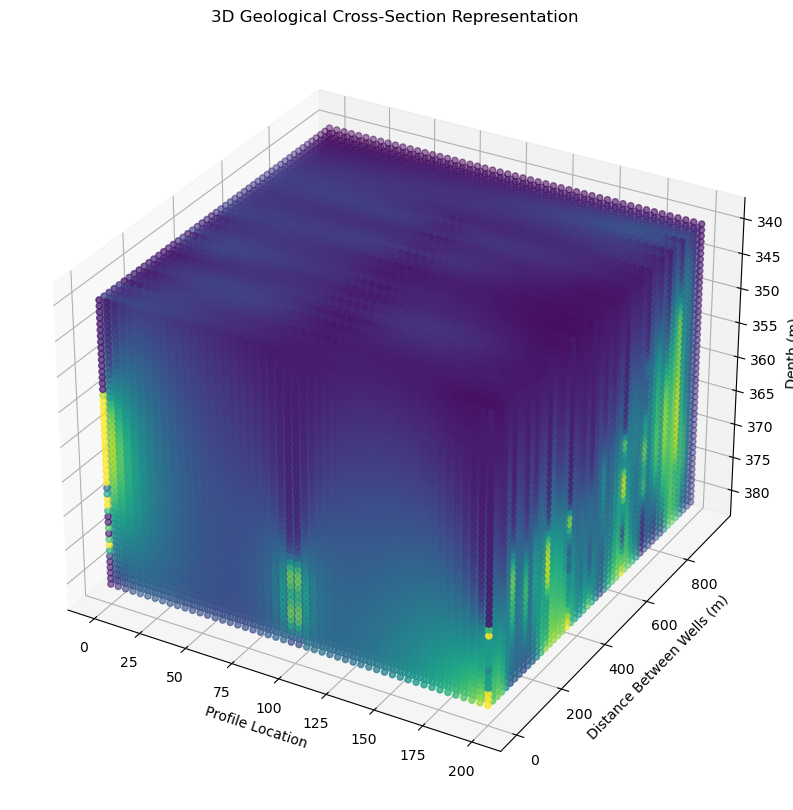

In [38]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from scipy.interpolate import Rbf

# Assuming merged_df is loaded and contains the necessary data

# Define the well locations for each profile and their IDs
profiles = {
    'mirat': [12611, 12442, 12440, 7596, 12441, 7699, 7696, 7697, 12444, 7694],
    'saken': [13147, 13207, 12888, 13131, 13130, 13129, 13125, 13126, 13127, 13128, 12889, 12890, 12891, 12893, 15744],
    'adilet': [13143, 13145, 13141, 13144, 13138, 13137, 13140, 13132, 11896, 13133, 13134, 13135, 13136, 13152, 13153, 13154, 13155, 13098, 13156]
}

# Profile locations (x-coordinates)
profile_locations = {'mirat': 0, 'saken': 100, 'adilet': 200}

# Filter the data for depths of 340m and deeper
merged_df_filtered = merged_df[merged_df['Depth(m)'] >= 340]

# Prepare data for RBF interpolation
x, y, z, d = [], [], [], []

for profile_name, wells in profiles.items():
    x_loc = profile_locations[profile_name]
    for i, well_id in enumerate(wells):
        well_data = merged_df_filtered[merged_df_filtered['well'] == well_id]
        for depth, classification in zip(well_data['Depth(m)'], well_data['productive_horizon']):
            x.append(x_loc)
            y.append(i * 50)  # Distance between wells
            z.append(depth)
            d.append(classification)

# Create the RBF interpolator
rbf = Rbf(x, y, z, d, function='linear')

# Generate grid data for visualization
x_grid, y_grid, z_grid = np.mgrid[0:200:50j, 0:max([len(profile) for profile in profiles.values()])*50:50j, 340:merged_df['Depth(m)'].max():50j]
d_grid = rbf(x_grid, y_grid, z_grid)

# 3D Plotting
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

# Use volumetric plotting
ax.scatter(x_grid, y_grid, z_grid, c=d_grid, cmap='viridis', marker='o')
ax.set_xlabel('Profile Location')
ax.set_ylabel('Distance Between Wells (m)')
ax.set_zlabel('Depth (m)')
ax.set_title('3D Geological Cross-Section Representation')
ax.invert_zaxis()  # Invert depth axis

plt.show()


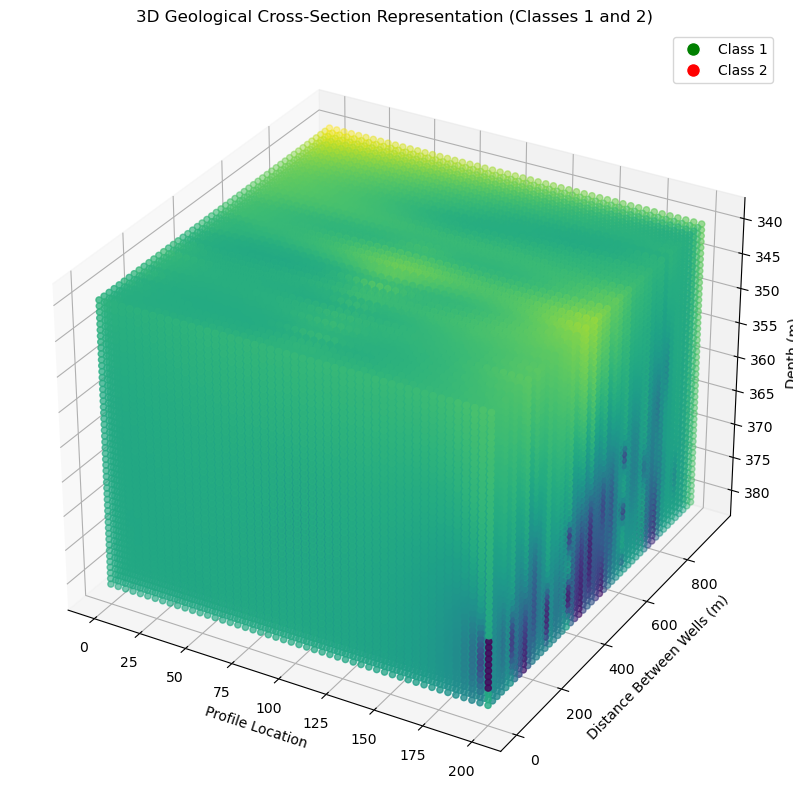

In [39]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from scipy.interpolate import Rbf

# Assuming merged_df is loaded and contains the necessary data

# Define the well locations for each profile and their IDs
profiles = {
    'mirat': [12611, 12442, 12440, 7596, 12441, 7699, 7696, 7697, 12444, 7694],
    'saken': [13147, 13207, 12888, 13131, 13130, 13129, 13125, 13126, 13127, 13128, 12889, 12890, 12891, 12893, 15744],
    'adilet': [13143, 13145, 13141, 13144, 13138, 13137, 13140, 13132, 11896, 13133, 13134, 13135, 13136, 13152, 13153, 13154, 13155, 13098, 13156]
}

# Profile locations (x-coordinates)
profile_locations = {'mirat': 0, 'saken': 100, 'adilet': 200}

# Filter the data for depths of 340m and deeper and for classes 1 and 2
merged_df_filtered = merged_df[(merged_df['Depth(m)'] >= 340) & (merged_df['productive_horizon'].isin([1, 2]))]

# Prepare data for RBF interpolation
x, y, z, d = [], [], [], []

for profile_name, wells in profiles.items():
    x_loc = profile_locations[profile_name]
    for i, well_id in enumerate(wells):
        well_data = merged_df_filtered[merged_df_filtered['well'] == well_id]
        for depth, classification in zip(well_data['Depth(m)'], well_data['productive_horizon']):
            x.append(x_loc)
            y.append(i * 50)  # Distance between wells
            z.append(depth)
            d.append(classification)

# Create the RBF interpolator
rbf = Rbf(x, y, z, d, function='linear')

# Generate grid data for visualization
x_grid, y_grid, z_grid = np.mgrid[0:200:50j, 0:max([len(profile) for profile in profiles.values()])*50:50j, 340:merged_df['Depth(m)'].max():50j]
d_grid = rbf(x_grid, y_grid, z_grid)

# 3D Plotting
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

# Use volumetric plotting
scatter = ax.scatter(x_grid, y_grid, z_grid, c=d_grid, cmap='viridis', marker='o')
ax.set_xlabel('Profile Location')
ax.set_ylabel('Distance Between Wells (m)')
ax.set_zlabel('Depth (m)')
ax.set_title('3D Geological Cross-Section Representation (Classes 1 and 2)')
ax.invert_zaxis()  # Invert depth axis

# Adding legend for classes
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=f'Class {i}', markersize=10, markerfacecolor='green' if i == 1 else 'red') for i in [1, 2]]
ax.legend(handles=legend_elements, loc='upper right')

plt.show()


# Interpolation for core lithology

In [31]:
data = pd.read_excel('data01.12.23.xlsx')
data

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon
0,7699.0,120.0,6.0,3.57,4.6,0.0,7.0,10.0,0.0
1,7699.0,120.1,6.0,3.53,4.8,0.0,7.0,10.0,0.0
2,7699.0,120.2,6.0,3.50,4.9,0.0,7.0,10.0,0.0
3,7699.0,120.3,7.0,3.46,5.1,0.0,7.0,10.0,0.0
4,7699.0,120.4,7.0,3.43,5.4,0.0,7.0,10.0,0.0
...,...,...,...,...,...,...,...,...,...
123192,11896.0,383.4,9.0,3.83,1.2,0.0,956.0,10.0,0.0
123193,11896.0,383.5,9.0,3.86,1.2,0.0,956.0,10.0,0.0
123194,11896.0,383.6,5.0,3.89,1.2,0.0,956.0,10.0,0.0
123195,11896.0,383.7,5.0,3.92,1.3,0.0,956.0,10.0,0.0


### Interpolation for all lithology code

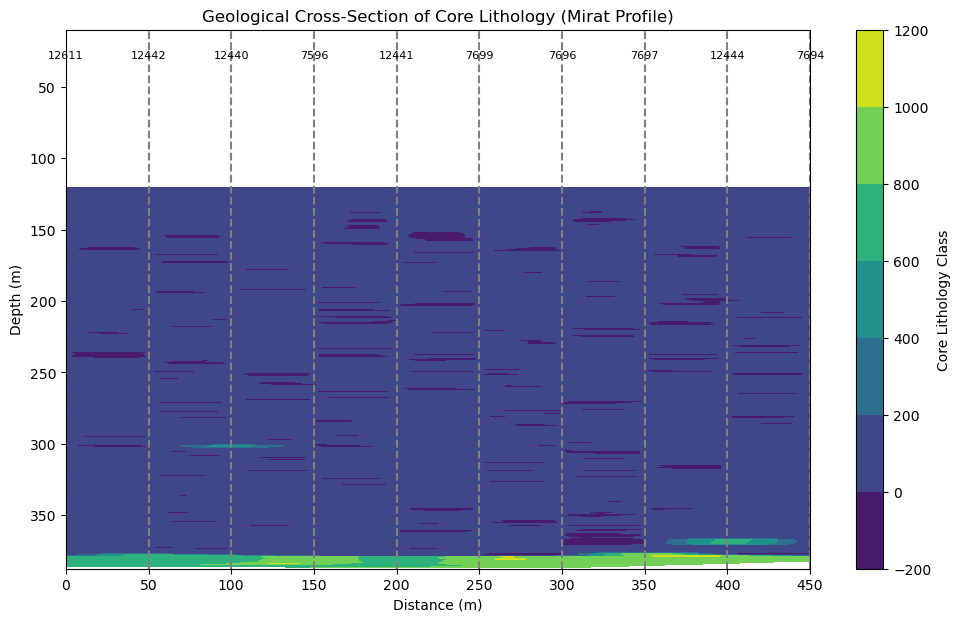

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Assuming 'data' is your dataframe
# Define well locations and names
mirat_wells = [12611, 12442, 12440, 7596, 12441, 7699, 7696, 7697, 12444, 7694]
well_locations = np.array([i * 50 for i in range(len(mirat_wells))])  # Wells are 50m apart

# Create a grid for interpolation
grid_x, grid_y = np.mgrid[0:450:450j, data['Depth(m)'].min():data['Depth(m)'].max():500j]

# Prepare data for interpolation
points = []
values = []

for well_id in mirat_wells:
    well_data = data[data['well'] == well_id]
    for depth, lithology in zip(well_data['Depth(m)'], well_data['core_lithology']):
        well_index = mirat_wells.index(well_id)
        points.append((well_locations[well_index], depth))
        values.append(lithology)

points = np.array(points)
values = np.array(values)

# Perform cubic interpolation
grid_z = griddata(points, values, (grid_x, grid_y), method='cubic')

# Plotting
plt.figure(figsize=(12, 7))
contour = plt.contourf(grid_x, grid_y, grid_z, cmap='viridis')  # 'viridis' colormap for multiclasses
plt.colorbar(contour, label='Core Lithology Class')
plt.xlabel('Distance (m)')
plt.ylabel('Depth (m)')
plt.title('Geological Cross-Section of Core Lithology (Mirat Profile)')

# Marking and labeling wells
for i, well_id in enumerate(mirat_wells):
    plt.axvline(x=well_locations[i], color='grey', linestyle='--')
    plt.text(well_locations[i], grid_y.min() + 20, str(well_id), horizontalalignment='center', color='black', fontsize=8)

plt.gca().invert_yaxis()  # Depth increases downwards
plt.show()


In [36]:
df = pd.read_excel('processed_data_eng.xlsx')

In [37]:
df

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon
0,7699,120.0,6,3.57,4.6,0.0,4.0,10,0
1,7699,120.1,6,3.53,4.8,0.0,4.0,10,0
2,7699,120.2,6,3.50,4.9,0.0,4.0,10,0
3,7699,120.3,7,3.46,5.1,0.0,4.0,10,0
4,7699,120.4,7,3.43,5.4,0.0,4.0,10,0
...,...,...,...,...,...,...,...,...,...
123192,11896,383.4,9,3.83,1.2,0.0,NaN,10,0
123193,11896,383.5,9,3.86,1.2,0.0,NaN,10,0
123194,11896,383.6,5,3.89,1.2,0.0,NaN,10,0
123195,11896,383.7,5,3.92,1.3,0.0,NaN,10,0


### Interpolation for categorized lithology code (with missing values)

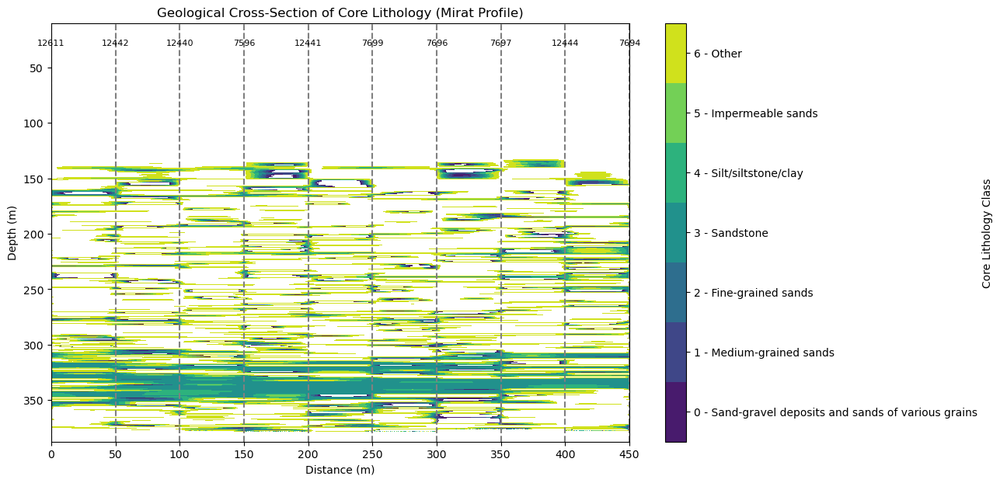

In [41]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata

# Assuming 'data' is the same as previously loaded 'updated_data'

# Define well locations and names
mirat_wells = [12611, 12442, 12440, 7596, 12441, 7699, 7696, 7697, 12444, 7694]
well_locations = np.array([i * 50 for i in range(len(mirat_wells))])  # Wells are 50m apart

# Create a grid for interpolation
grid_x, grid_y = np.mgrid[0:450:450j, data['Depth(m)'].min():data['Depth(m)'].max():500j]

# Prepare data for interpolation, handling NaN values
points = []
values = []

for well_id in mirat_wells:
    well_data = data[data['well'] == well_id]
    for depth, lithology in zip(well_data['Depth(m)'], well_data['core_lithology']):
        if not np.isnan(lithology):  # Ignore NaN values
            well_index = mirat_wells.index(well_id)
            points.append((well_locations[well_index], depth))
            values.append(lithology)

points = np.array(points)
values = np.array(values)

# Perform cubic interpolation
grid_z = griddata(points, values, (grid_x, grid_y), method='cubic')

# Plotting with adjusted legend
plt.figure(figsize=(12, 7))
contour = plt.contourf(grid_x, grid_y, grid_z, levels=[-0.5, 0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5], cmap='viridis')
cbar = plt.colorbar(contour, label='Core Lithology Class', ticks=[0, 1, 2, 3, 4, 5, 6])
cbar.set_ticklabels([
    "0 - Sand-gravel deposits and sands of various grains",
    "1 - Medium-grained sands",
    "2 - Fine-grained sands",
    "3 - Sandstone",
    "4 - Silt/siltstone/clay",
    "5 - Impermeable sands",
    "6 - Other"
])

plt.xlabel('Distance (m)')
plt.ylabel('Depth (m)')
plt.title('Geological Cross-Section of Core Lithology (Mirat Profile)')

# Marking and labeling wells
for i, well_id in enumerate(mirat_wells):
    plt.axvline(x=well_locations[i], color='grey', linestyle='--')
    plt.text(well_locations[i], grid_y.min() + 20, str(well_id), horizontalalignment='center', color='black', fontsize=8)

plt.gca().invert_yaxis()  # Depth increases downwards
plt.show()


In [ ]:
# 

In [68]:
merged_data = pd.concat([data_with_values_new, data_missing_values_new], ignore_index=True)

In [69]:
merged_data.to_excel('merged_data_01.12.23.xlsx', index=False)

In [ ]:
# Load the saved Excel file
merged_data = pd.read_excel('merged_data_01.12.23.xlsx')

### Interpolation for categorized lithology code (with all values, missing values filled with ml model)

In [70]:
merged_data

,well,Depth(m),gamma_ray(μR/h),appareent_resistance(ohmm),spontaneous__potential(mV),Ra_concentr(%),core_lithology,perm_class,productive_horizon,gamma_rate_of_change,gamma_squared
0,7699,120.1,6,3.53,4.8,0.0,4.0,10,0,0.0,36
1,7699,120.2,6,3.50,4.9,0.0,4.0,10,0,0.0,36
2,7699,120.3,7,3.46,5.1,0.0,4.0,10,0,10.0,49
3,7699,120.4,7,3.43,5.4,0.0,4.0,10,0,0.0,49
4,7699,120.5,7,3.39,5.6,0.0,4.0,10,0,0.0,49
...,...,...,...,...,...,...,...,...,...,...,...
123190,11896,383.4,9,3.83,1.2,0.0,4.0,10,NaN,0.0,81
123191,11896,383.5,9,3.86,1.2,0.0,4.0,10,NaN,0.0,81
123192,11896,383.6,5,3.89,1.2,0.0,4.0,10,NaN,-40.0,25
123193,11896,383.7,5,3.92,1.3,0.0,2.0,10,NaN,0.0,25


# Mirat profile lithology interpolation

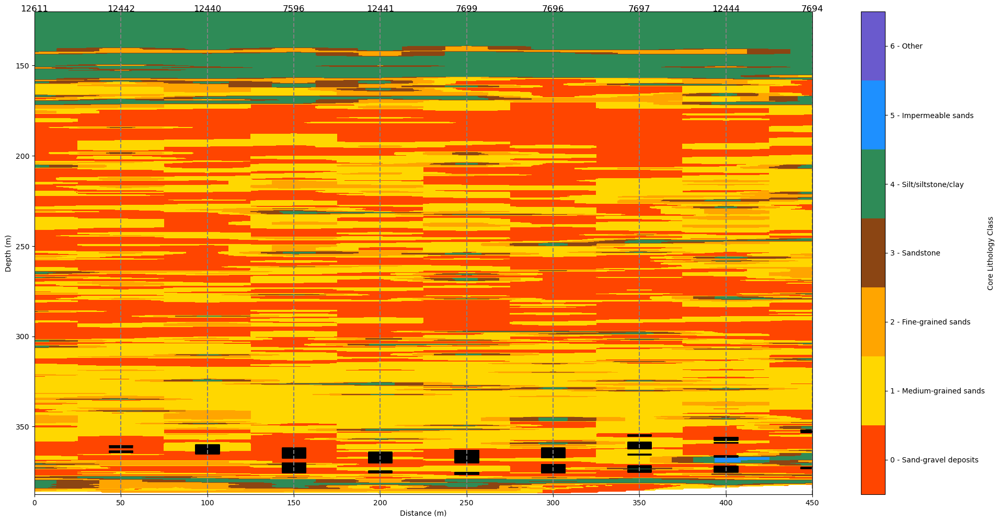

In [20]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.interpolate import griddata

# Load the data
# file_path = '/path/to/your/processed_data_eng.xlsx'  # Update with the correct path
# merged_data = pd.read_excel(file_path)

# Filter the dataset for depths of 120m and deeper
merged_data_120_deep = merged_df_1[merged_df_1['Depth(m)'] >= 120]

# Define well locations and names
mirat_wells = [12611, 12442, 12440, 7596, 12441, 7699, 7696, 7697, 12444, 7694]
well_locations = np.array([i * 50 for i in range(len(mirat_wells))])  # Wells are 50m apart

# Create a grid for interpolation with adjusted x-axis range
max_x_distance = well_locations[-1]  # Last well location distance
max_depth = merged_data_120_deep['Depth(m)'].max()
grid_x_120, grid_y_120 = np.mgrid[0:max_x_distance:max_x_distance*1j, 120:max_depth:500j]

# Prepare data for interpolation, handling NaN values
points_120 = []
values_120 = []

for well_id in mirat_wells:
    well_data = merged_data_120_deep[merged_data_120_deep['well'] == well_id]
    for depth, lithology in zip(well_data['Depth(m)'], well_data['core_lithology']):
        if not np.isnan(lithology):  # Ignore NaN values
            well_index = mirat_wells.index(well_id)
            points_120.append((well_locations[well_index], depth))
            values_120.append(lithology)

points_120 = np.array(points_120)
values_120 = np.array(values_120)

# Perform cubic interpolation
grid_z_120 = griddata(points_120, values_120, (grid_x_120, grid_y_120), method='linear')


# Define custom colors for contour levels
custom_colors = [
    '#FF4500',  # Orange Red - Sand-gravel deposits and sands of various grains
    '#FFD700',  # Gold - Medium-grained sands
    '#FFA500',  # Orange - Fine-grained sands
    '#8B4513',  # Saddle Brown - Sandstone
    '#2E8B57',  # Sea Green - Silt/siltstone/clay (Impermeable)
    '#1E90FF',  # Dodger Blue - Impermeable sands
    '#6A5ACD'   # Slate Blue - Other
]



# Plotting with adjusted legend
plt.figure(figsize=(24, 12))
contour = plt.contourf(grid_x_120, grid_y_120, grid_z_120, levels=[-0.5, 0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5], colors=custom_colors)
cbar = plt.colorbar(contour, label='Core Lithology Class', ticks=[0, 1, 2, 3, 4, 5, 6])
cbar.set_ticklabels([
    "0 - Sand-gravel deposits",
    "1 - Medium-grained sands",
    "2 - Fine-grained sands",
    "3 - Sandstone",
    "4 - Silt/siltstone/clay",
    "5 - Impermeable sands",
    "6 - Other"
])

# Add intervals of productive horizons along the wells
for i, well_id in enumerate(mirat_wells):
    well_data = merged_data_120_deep[merged_data_120_deep['well'] == well_id]
    productive_horizons = well_data[well_data['productive_horizon'] == 1]
    for _, row in productive_horizons.iterrows():
        plt.hlines(row['Depth(m)'], well_locations[i] - 7, well_locations[i] + 7, colors='black', linewidth=2)

        
        
plt.xlabel('Distance (m)')
plt.ylabel('Depth (m)')
#plt.title('Cross-Section of Core Lithology - Mirat profile')
plt.xlim(0, max_x_distance)
# Marking and labeling wells
for i, well_id in enumerate(mirat_wells):
    plt.axvline(x=well_locations[i], color='grey', linestyle='--')
    plt.text(well_locations[i], 120, str(well_id), horizontalalignment='center', color='black', fontsize=12)

plt.gca().invert_yaxis()  # Depth increases downwards
plt.show()


In [28]:
well_data['core_lithology'].isnull().sum()

0

# Saken profile lithology interpolation

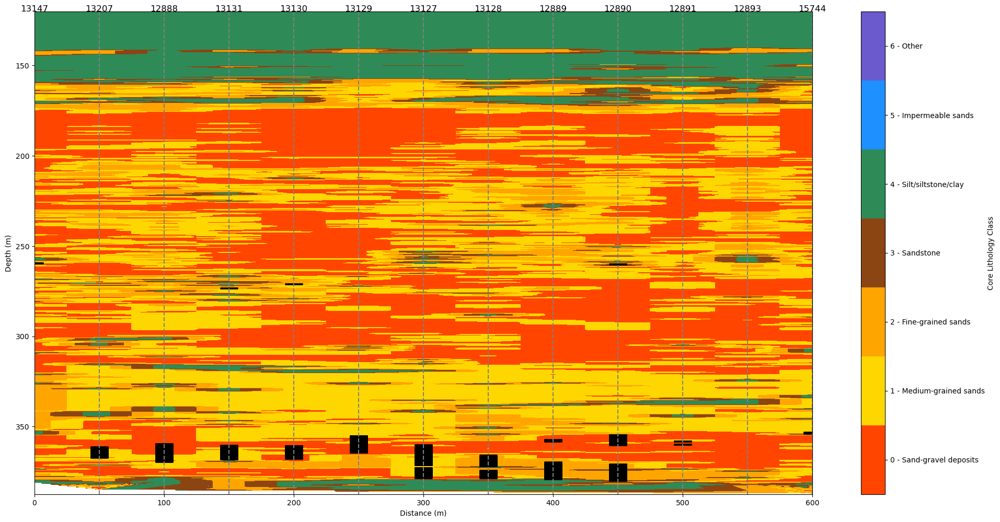

In [35]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.interpolate import griddata

# Load the data
# file_path = '/path/to/your/processed_data_eng.xlsx'  # Update with the correct path
# merged_data = pd.read_excel(file_path)

# Define well locations and names for the Saken profile
saken_wells = [13147, 13207, 12888, 13131, 13130, 13129, 13127, 13128, 12889, 12890, 12891, 12893, 15744] # wells 13125, 13126, are removed from list
well_locations_saken = np.array([i * 50 for i in range(len(saken_wells))])  # Wells are 50m apart

# Filter the dataset for depths of 120m and deeper for the Saken profile
merged_data_120_deep_saken = merged_df_1[merged_df_1['Depth(m)'] >= 120]

# Create a grid for interpolation with adjusted x-axis range for the Saken profile
max_x_distance_saken = well_locations_saken[-1]  # Last well location distance for Saken profile
max_depth_saken = merged_data_120_deep_saken['Depth(m)'].max()
grid_x_120_saken, grid_y_120_saken = np.mgrid[0:max_x_distance_saken:max_x_distance_saken*1j, 120:max_depth_saken:500j]

# Prepare data for interpolation, handling NaN values for the Saken profile
points_120_saken = []
values_120_saken = []

for well_id in saken_wells:
    well_data = merged_data_120_deep_saken[merged_data_120_deep_saken['well'] == well_id]
    for depth, lithology in zip(well_data['Depth(m)'], well_data['core_lithology']):
        if not np.isnan(lithology):  # Ignore NaN values
            well_index = saken_wells.index(well_id)
            points_120_saken.append((well_locations_saken[well_index], depth))
            values_120_saken.append(lithology)

points_120_saken = np.array(points_120_saken)
values_120_saken = np.array(values_120_saken)

# Perform cubic interpolation for the Saken profile
grid_z_120_saken = griddata(points_120_saken, values_120_saken, (grid_x_120_saken, grid_y_120_saken), method='linear')

# ... (rest of the code remains the same for custom_colors definition and plotting)

# Plotting with adjusted legend for the Saken profile
plt.figure(figsize=(24, 12))
contour = plt.contourf(grid_x_120_saken, grid_y_120_saken, grid_z_120_saken, levels=[-0.5, 0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5], colors=custom_colors)
cbar = plt.colorbar(contour, label='Core Lithology Class', ticks=[0, 1, 2, 3, 4, 5, 6])
cbar.set_ticklabels([
    "0 - Sand-gravel deposits",
    "1 - Medium-grained sands",
    "2 - Fine-grained sands",
    "3 - Sandstone",
    "4 - Silt/siltstone/clay",
    "5 - Impermeable sands",
    "6 - Other"
])

# Add intervals of productive horizons along the wells for the Saken profile
for i, well_id in enumerate(saken_wells):
    well_data = merged_data_120_deep_saken[merged_data_120_deep_saken['well'] == well_id]
    productive_horizons = well_data[well_data['productive_horizon'] == 1]
    for _, row in productive_horizons.iterrows():
        plt.hlines(row['Depth(m)'], well_locations_saken[i] - 7, well_locations_saken[i] + 7, colors='black', linewidth=2)

plt.xlabel('Distance (m)')
plt.ylabel('Depth (m)')
plt.xlim(0, max_x_distance_saken)
# Marking and labeling wells for the Saken profile
for i, well_id in enumerate(saken_wells):
    plt.axvline(x=well_locations_saken[i], color='grey', linestyle='--')
    plt.text(well_locations_saken[i], 120, str(well_id), horizontalalignment='center', color='black', fontsize=12)

plt.gca().invert_yaxis()  # Depth increases downwards
plt.show()


# Adilet profile lithology interpolation

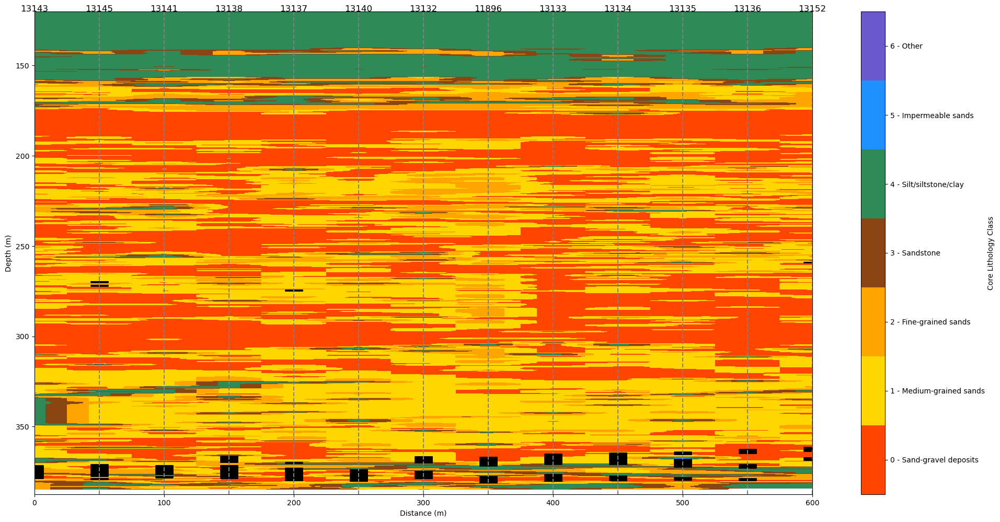

In [34]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.interpolate import griddata

# Define well locations and names for the Adilet profile
adilet_wells = [13143, 13145, 13141, 13138, 13137, 13140, 13132, 11896, 13133, 13134, 13135, 13136, 13152]  #  well #13144, is removed from list
well_locations_adilet = np.array([i * 50 for i in range(len(adilet_wells))])  # Wells are 50m apart

# Filter the dataset for depths of 120m and deeper for the Adilet profile
merged_data_120_deep_adilet = merged_df_1[merged_df_1['Depth(m)'] >= 120]

# Create a grid for interpolation with adjusted x-axis range for the Adilet profile
max_x_distance_adilet = well_locations_adilet[-1]  # Last well location distance for Adilet profile
max_depth_adilet = merged_data_120_deep_adilet['Depth(m)'].max()
grid_x_120_adilet, grid_y_120_adilet = np.mgrid[0:max_x_distance_adilet:max_x_distance_adilet*1j, 120:max_depth_adilet:500j]

# Prepare data for interpolation, handling NaN values for the Adilet profile
points_120_adilet = []
values_120_adilet = []

for well_id in adilet_wells:
    well_data = merged_data_120_deep_adilet[merged_data_120_deep_adilet['well'] == well_id]
    for depth, lithology in zip(well_data['Depth(m)'], well_data['core_lithology']):
        if not np.isnan(lithology):  # Ignore NaN values
            well_index = adilet_wells.index(well_id)
            points_120_adilet.append((well_locations_adilet[well_index], depth))
            values_120_adilet.append(lithology)

points_120_adilet = np.array(points_120_adilet)
values_120_adilet = np.array(values_120_adilet)

# Perform cubic interpolation for the Adilet profile
grid_z_120_adilet = griddata(points_120_adilet, values_120_adilet, (grid_x_120_adilet, grid_y_120_adilet), method='linear')

# ... (rest of the code remains the same for custom_colors definition and plotting)

# Plotting with adjusted legend for the Adilet profile
plt.figure(figsize=(24, 12))
contour = plt.contourf(grid_x_120_adilet, grid_y_120_adilet, grid_z_120_adilet, levels=[-0.5, 0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5], colors=custom_colors)
cbar = plt.colorbar(contour, label='Core Lithology Class', ticks=[0, 1, 2, 3, 4, 5, 6])
cbar.set_ticklabels([
    "0 - Sand-gravel deposits",
    "1 - Medium-grained sands",
    "2 - Fine-grained sands",
    "3 - Sandstone",
    "4 - Silt/siltstone/clay",
    "5 - Impermeable sands",
    "6 - Other"
])

# Add intervals of productive horizons along the wells for the Adilet profile
for i, well_id in enumerate(adilet_wells):
    well_data = merged_data_120_deep_adilet[merged_data_120_deep_adilet['well'] == well_id]
    productive_horizons = well_data[well_data['productive_horizon'] == 1]
    for _, row in productive_horizons.iterrows():
        plt.hlines(row['Depth(m)'], well_locations_adilet[i] - 7, well_locations_adilet[i] + 7, colors='black', linewidth=2)

plt.xlabel('Distance (m)')
plt.ylabel('Depth (m)')
plt.xlim(0, max_x_distance_adilet)
# Marking and labeling wells for the Adilet profile
for i, well_id in enumerate(adilet_wells):
    plt.axvline(x=well_locations_adilet[i], color='grey', linestyle='--')
    plt.text(well_locations_adilet[i], 120, str(well_id), horizontalalignment='center', color='black', fontsize=12)

plt.gca().invert_yaxis()  # Depth increases downwards
plt.show()


In [10]:
merged_df_1['core_lithology'].value_counts()

0    50828
1    36900
4    23040
2    11943
3      432
5       50
6        2
Name: core_lithology, dtype: int64

# 10.12.2023 
### mean and median values of gamma_ray(μR/h)	appareent_resistance(ohmm)	spontaneous__potential(mV)	for three different classes (0 - no_uranium, 1 - commercial, 2 - non-commercial) in predicted_productive_horizon column

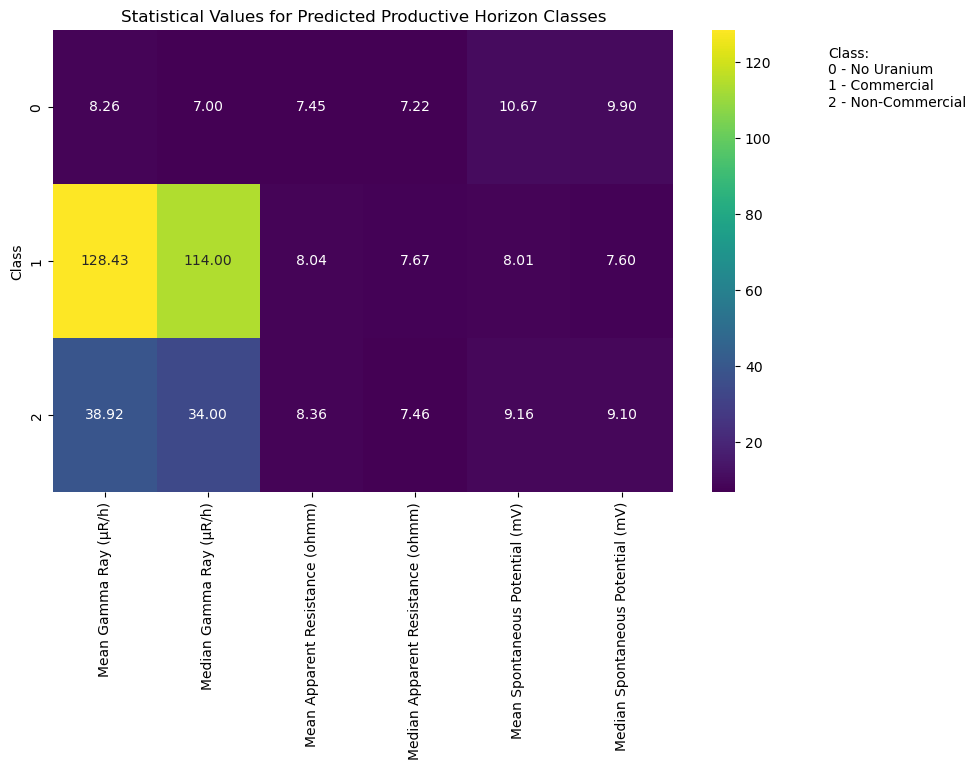

In [47]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming merged_df_1 is your DataFrame
# merged_df_1 = pd.read_csv('path_to_your_data.csv')  # Uncomment this line and replace with your actual file path

# Define the classes
classes = [0, 1, 2]

# Initialize an empty list to store results
stats_data = []

# Loop through each class and calculate mean and median
for class_value in classes:
    filtered_data = merged_df_1[merged_df_1['predicted_productive_horizon'] == class_value]
    
    stats_data.append([
        class_value,
        filtered_data['gamma_ray(μR/h)'].mean(),
        filtered_data['gamma_ray(μR/h)'].median(),
        filtered_data['appareent_resistance(ohmm)'].mean(),
        filtered_data['appareent_resistance(ohmm)'].median(),
        filtered_data['spontaneous__potential(mV)'].mean(),
        filtered_data['spontaneous__potential(mV)'].median()
    ])

# Create a DataFrame for the heatmap
stats_df = pd.DataFrame(stats_data, columns=['Class', 'Mean Gamma Ray (μR/h)', 'Median Gamma Ray (μR/h)', 
                                             'Mean Apparent Resistance (ohmm)', 'Median Apparent Resistance (ohmm)', 
                                             'Mean Spontaneous Potential (mV)', 'Median Spontaneous Potential (mV)'])

# Set Class as the index
stats_df.set_index('Class', inplace=True)

# Create the heatmap
plt.figure(figsize=(10, 6))
ax = sns.heatmap(stats_df, annot=True, fmt=".2f", cmap='viridis')
plt.title('Statistical Values for Predicted Productive Horizon Classes')

# Add custom legend-like annotation closer to the heatmap
class_legend = "Class:\n0 - No Uranium\n1 - Commercial\n2 - Non-Commercial"
plt.gcf().text(0.9, 0.8, class_legend, fontsize=10, ha='left', va='center')

plt.show()


# 14.12.2023 
### mean and median values of gamma_ray(μR/h)	appareent_resistance(ohmm)	spontaneous__potential(mV)	for 7 different classes ("0 - Sand-gravel deposits", "1 - Medium-grained sands", "2 - Fine-grained sands", "3 - Sandstone", "4 - Silt/siltstone/clay", "5 - Impermeable sands", "6 - Other") in core_lithology column

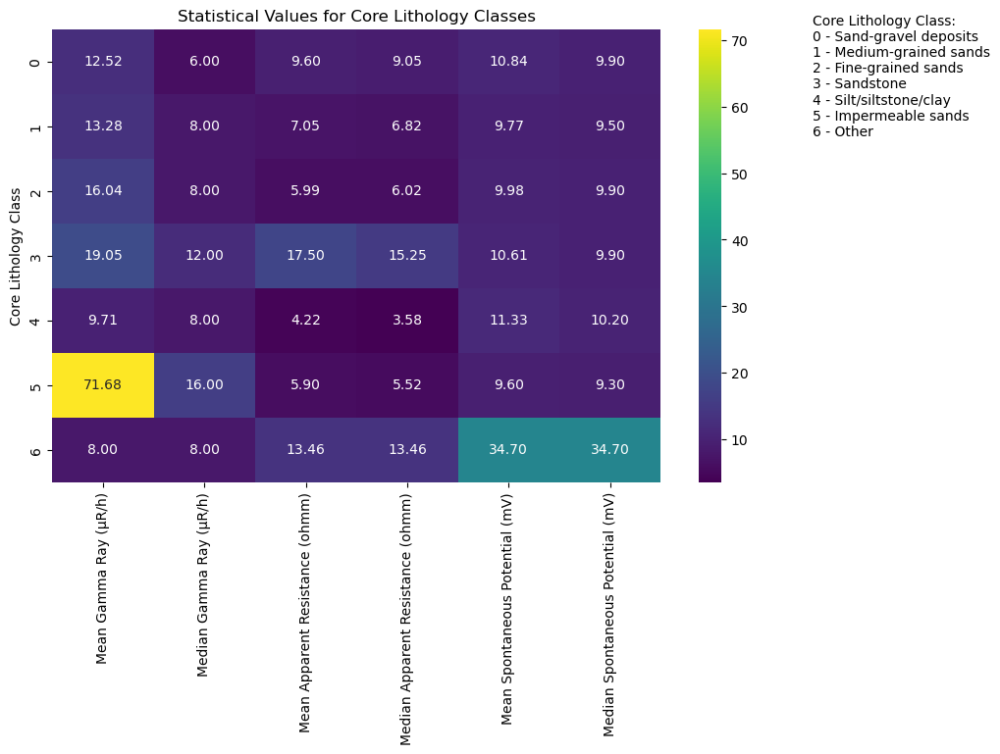

In [44]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming merged_df_1 is your DataFrame
# merged_df_1 = pd.read_csv('path_to_your_data.csv')  # Uncomment this line and replace with your actual file path

# Define the classes for core_lithology
core_lithology_classes = [0, 1, 2, 3, 4, 5, 6]

# Initialize an empty list to store results
lithology_stats_data = []

# Loop through each class and calculate mean and median for core_lithology
for lithology_class in core_lithology_classes:
    filtered_data = merged_df_1[merged_df_1['core_lithology'] == lithology_class]
    
    lithology_stats_data.append([
        lithology_class,
        filtered_data['gamma_ray(μR/h)'].mean(),
        filtered_data['gamma_ray(μR/h)'].median(),
        filtered_data['appareent_resistance(ohmm)'].mean(),
        filtered_data['appareent_resistance(ohmm)'].median(),
        filtered_data['spontaneous__potential(mV)'].mean(),
        filtered_data['spontaneous__potential(mV)'].median()
    ])

# Create a DataFrame for the heatmap
lithology_stats_df = pd.DataFrame(lithology_stats_data, columns=['Core Lithology Class', 
                                                                'Mean Gamma Ray (μR/h)', 'Median Gamma Ray (μR/h)', 
                                                                'Mean Apparent Resistance (ohmm)', 'Median Apparent Resistance (ohmm)', 
                                                                'Mean Spontaneous Potential (mV)', 'Median Spontaneous Potential (mV)'])

# Set Core Lithology Class as the index
lithology_stats_df.set_index('Core Lithology Class', inplace=True)

# Create the heatmap
plt.figure(figsize=(10, 6))
ax = sns.heatmap(lithology_stats_df, annot=True, fmt=".2f", cmap='viridis')
plt.title('Statistical Values for Core Lithology Classes')

# Add custom legend-like annotation closer to the heatmap
lithology_class_legend = "Core Lithology Class:\n" \
                         "0 - Sand-gravel deposits\n" \
                         "1 - Medium-grained sands\n" \
                         "2 - Fine-grained sands\n" \
                         "3 - Sandstone\n" \
                         "4 - Silt/siltstone/clay\n" \
                         "5 - Impermeable sands\n" \
                         "6 - Other"
plt.gcf().text(0.9, 0.8, lithology_class_legend, fontsize=10, ha='left', va='center')

plt.show()


# Quanity of Codes in Each Lithology Group

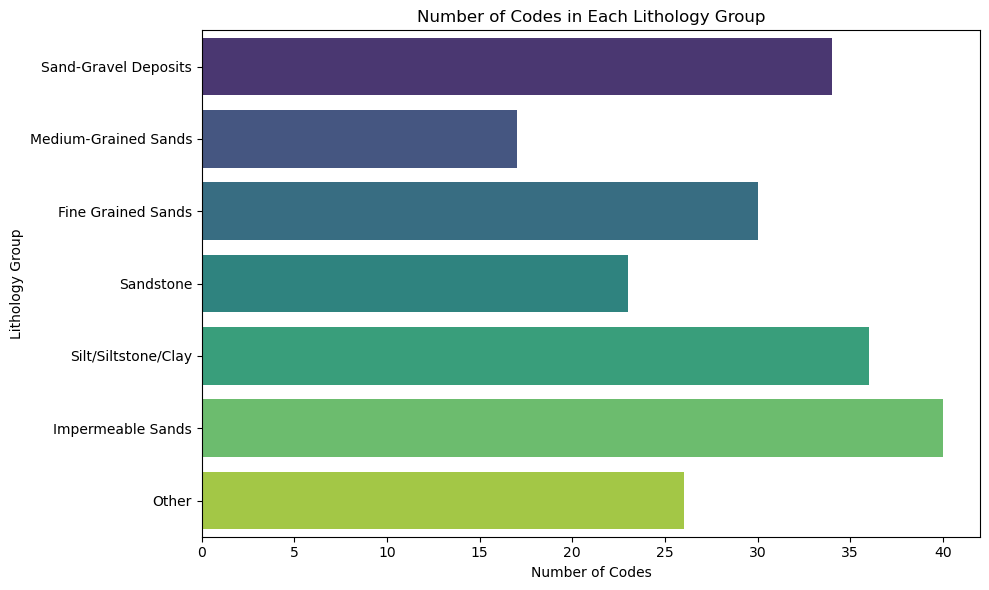

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Data
groups_data = {
    'Sand-Gravel Deposits': [1, 1111, 1277, 10, 101, 111, 17, 11, 117, 112, 1127, 1125, 11257, 123, 12, 1225, 1229, 127, 1227, 121, 1217, 122, 1235, 1237, 12377, 1239, 125, 14, 126, 129, 1259, 149, 19, 29],
    'Medium-Grained Sands': [3, 31, 321, 34, 35, 30, 309, 355, 37, 376, 347, 36, 370, 375, 377, 379, 39],
    'Fine Grained Sands': [4, 41, 421, 4217, 43, 415, 45, 456, 457, 467, 4777, 40, 409, 455, 437, 46, 466, 47, 475, 477, 49, 44, 442, 445, 440, 4409, 4455, 446, 447, 4475],
    'Sandstone': [5, 51, 519, 52, 591, 592, 529, 58, 53, 530, 5306, 54, 56, 57, 578, 593, 5399, 594, 549, 579, 598, 509, 59],
    'Silt/Siltstone/Clay': [6, 60, 61, 63, 659, 64, 641, 6410, 647, 648, 65, 66, 669, 67, 674, 675, 69, 693, 62, 967, 969, 7, 71, 714, 715, 731, 74, 75, 76, 763, 765, 709, 77, 789, 79, 794],
    'Impermeable Sands': [517, 551, 552, 7121, 7122, 7123, 7124, 7127, 7155, 7255, 717, 553, 535, 5358, 73, 730, 733, 735, 739, 7355, 743, 539, 545, 5458, 554, 745, 7455, 7456, 746, 7466, 747, 7475, 774, 7745, 7746, 5445, 644, 6449, 744, 7445],
    'Other': [55, 723, 81, 82, 83, 84, 85, 86, 87, 88, 89, 9, 907, 90, 91, 92, 93, 94, 95, 96, 962, 965, 97, 28, 0, 999]
}

# Count the number of codes in each group
group_counts = {k: len(v) for k, v in groups_data.items()}

# Create DataFrame for visualization
df = pd.DataFrame(list(group_counts.items()), columns=['Group', 'Count'])

# Visualization
plt.figure(figsize=(10, 6))
sns.barplot(x='Count', y='Group', data=df, palette='viridis')
plt.title('Number of Codes in Each Lithology Group')
plt.xlabel('Number of Codes')
plt.ylabel('Lithology Group')
plt.tight_layout()
plt.show()


# Distribution of core_lithology measurements Before and After SMOTE

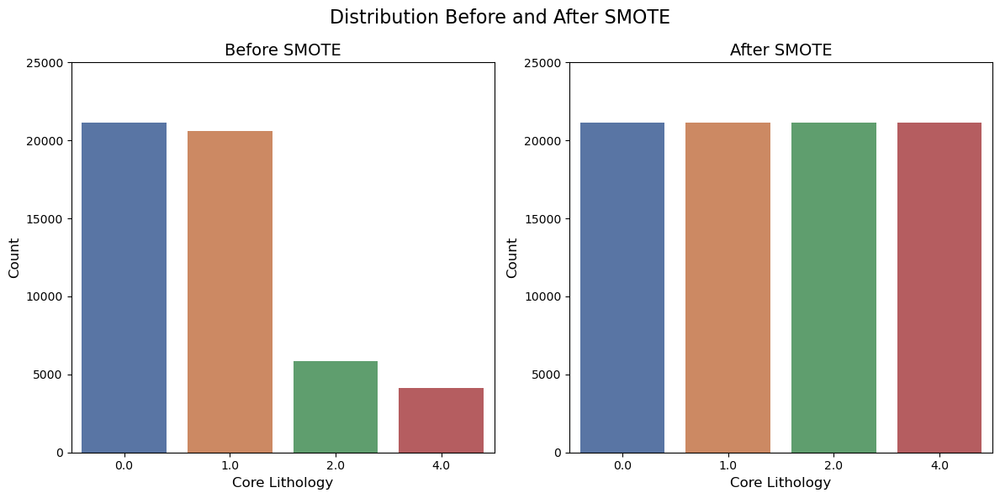

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns

# Class distribution before SMOTE
before_smote_counts = [21155, 20601, 5828, 4129]
classes = [0.0, 1.0, 2.0, 4.0]

# Class distribution after SMOTE
after_smote_counts = [21155, 21155, 21155, 21155]

# Set up the matplotlib figure
plt.figure(figsize=(12, 6))

# Subplot 1: Before SMOTE
plt.subplot(1, 2, 1)
sns.barplot(x=classes, y=before_smote_counts, palette='deep')
plt.title('Before SMOTE', fontsize=14)
plt.xlabel('Core Lithology', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.ylim(0, 25000)

# Subplot 2: After SMOTE
plt.subplot(1, 2, 2)
sns.barplot(x=classes, y=after_smote_counts, palette='deep')
plt.title('After SMOTE', fontsize=14)
plt.xlabel('Core Lithology', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.ylim(0, 25000)

plt.suptitle('Distribution Before and After SMOTE', fontsize=16)
plt.tight_layout()
plt.show()


# Schematic Visualization of a Decision Tree

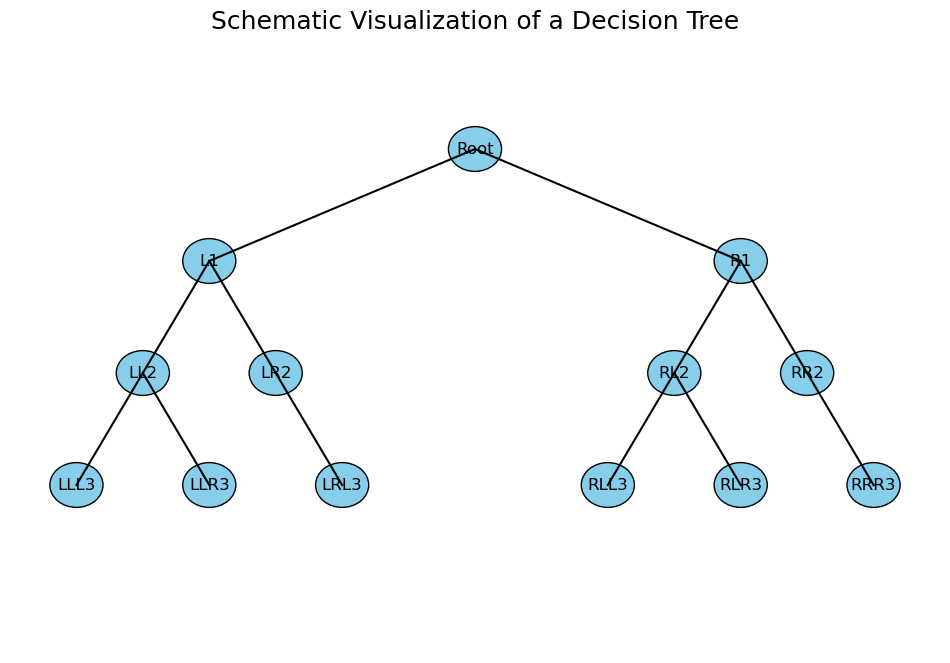

In [16]:
import matplotlib.pyplot as plt

def draw_node(ax, center, text, radius=0.2):
    circle = plt.Circle(center, radius, fc='skyblue', ec='black')
    ax.add_artist(circle)
    ax.text(*center, text, fontsize=12, ha='center', va='center')

def draw_line(ax, start, end):
    ax.plot([start[0], end[0]], [start[1], end[1]], color='black')

# Initialize plot
fig, ax = plt.subplots(figsize=(12, 8))
ax.set_xlim(-3.5, 3.5)
ax.set_ylim(-4.5, 1)
ax.axis('off')

# Draw nodes
draw_node(ax, (0, 0), 'Root')
draw_node(ax, (-2, -1), 'L1')
draw_node(ax, (2, -1), 'R1')
draw_node(ax, (-2.5, -2), 'LL2')
draw_node(ax, (-1.5, -2), 'LR2')
draw_node(ax, (1.5, -2), 'RL2')
draw_node(ax, (2.5, -2), 'RR2')
draw_node(ax, (-3, -3), 'LLL3')
draw_node(ax, (-2, -3), 'LLR3')
draw_node(ax, (-1, -3), 'LRL3')
draw_node(ax, (1, -3), 'RLL3')
draw_node(ax, (2, -3), 'RLR3')
draw_node(ax, (3, -3), 'RRR3')

# Draw lines
draw_line(ax, (0, 0), (-2, -1))
draw_line(ax, (0, 0), (2, -1))
draw_line(ax, (-2, -1), (-2.5, -2))
draw_line(ax, (-2, -1), (-1.5, -2))
draw_line(ax, (2, -1), (1.5, -2))
draw_line(ax, (2, -1), (2.5, -2))
draw_line(ax, (-2.5, -2), (-3, -3))
draw_line(ax, (-2.5, -2), (-2, -3))
draw_line(ax, (-1.5, -2), (-1, -3))
draw_line(ax, (1.5, -2), (1, -3))
draw_line(ax, (1.5, -2), (2, -3))
draw_line(ax, (2.5, -2), (3, -3))

plt.title("Schematic Visualization of a Decision Tree", fontsize=18)
plt.show()


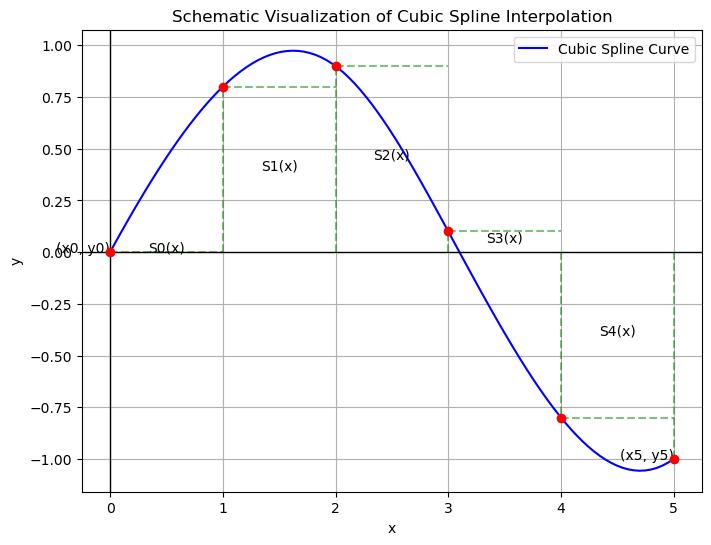

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import CubicSpline

# Sample data points
x = np.array([0, 1, 2, 3, 4, 5])
y = np.array([0.0, 0.8, 0.9, 0.1, -0.8, -1.0])

# Perform cubic spline interpolation
cs = CubicSpline(x, y)

# Generate dense x values for plotting the spline
x_dense = np.linspace(min(x), max(x), 100)
y_dense = cs(x_dense)

# Plotting
plt.figure(figsize=(8, 6))

# Plot the original data points
plt.scatter(x, y, color='red', zorder=5)
plt.text(x[0], y[0], '(x0, y0)', ha='right')
plt.text(x[-1], y[-1], f'(x{x.size - 1}, y{x.size - 1})', ha='right')

# Plot the cubic spline curve
plt.plot(x_dense, y_dense, label='Cubic Spline Curve', color='blue')

# Annotate and add additional elements to illustrate the concept
for i in range(len(x) - 1):
    plt.plot([x[i], x[i + 1]], [y[i], y[i]], color='green', linestyle='--', alpha=0.5)
    plt.plot([x[i + 1], x[i + 1]], [0, y[i + 1]], color='green', linestyle='--', alpha=0.5)
    plt.text((x[i] + x[i + 1]) / 2, y[i] / 2, f'S{i}(x)', ha='center')

plt.axhline(0, color='black', lw=1)
plt.axvline(0, color='black', lw=1)
plt.xlabel('x')
plt.ylabel('y')
plt.title('Schematic Visualization of Cubic Spline Interpolation')
plt.legend()
plt.grid(True)
plt.show()
